In [20]:
# D_learning online = DL-Online
# 对象为 Inverted Pendulum

import torch
from torch import nn
from torch.nn import functional as F
import numpy as np
import matplotlib.pyplot as plt
import cvxpy as cp
import pickle

from systems_and_functions.control_affine_system import ControlAffineSystem
from systems_and_functions.cart_pole_system import CartPole
from systems_and_functions.inverted_pendulum_system import InvertedPendulum

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [21]:
class PolicyNet(nn.Module):
    def __init__(
        self, 
        n_states: int = 2, 
        n_hiddens: int = 16,
        n_actions: int = 1, 
        action_bound: float = 5.0
    ):
        super(PolicyNet, self).__init__()
        # 环境可以接受的动作最大值
        self.action_bound = action_bound
        self.n_actions = n_actions
        # 只包含一个隐含层
        self.fc1 = nn.Linear(n_states, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_actions + 1)

    # 前向传播
    def forward(self, x):
        x = x.t()
        x = self.fc1(x)  # [b,n_states]-->[b,n_hiddens]
        x = F.relu(x)
        x = self.fc2(x)  # [b,n_hiddens]-->[b,n_actions]
        return x
    
    def Controller(self, x):
        u = self.forward(x).t()[:self.n_actions]
        return u

class LyapunovNet(nn.Module):
    def __init__(
        self,
        n_states:int = 4, 
        n_hiddens:int = 128
    ):
        super(LyapunovNet, self).__init__()
        self.fc1 = nn.Linear(n_states, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_hiddens)
        self.fc3 = nn.Linear(n_hiddens, 2)

    def forward(self, x):
        s = self.fc1(x)  # -->[b, n_hiddens]
        s = torch.tanh(s)
        s = self.fc2(s)  # -->[b, n_hiddens]
        s = torch.tanh(s)
        V = self.fc3(s)  # -->[b, 1]
        return V
    
    def V(self, x):
        return self.forward(x)[:,0]

    def V_with_JV(self, x):
        x = x.clone().detach().requires_grad_(True)
        V = self.forward(x)
        JV = torch.autograd.grad(V, x)
        return V, JV

class DFunctionNet(nn.Module):
    def __init__(
        self,
        n_states:int = 4, 
        n_hiddens: int = 128, 
        n_actions: int = 2
    ):
        super(DFunctionNet, self).__init__()
        self.fc1 = nn.Linear(n_states + n_actions, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_hiddens)
        self.fc3 = nn.Linear(n_hiddens, 2)

    # 前向传播
    def forward(self, x, a):
        # 拼接状态和动作
        cat = torch.cat([x, a], dim=1)  # [b, n_states + n_actions]
        x = self.fc1(cat)  # -->[b, n_hiddens]
        x = F.relu(x)
        x = self.fc2(x)  # -->[b, n_hiddens]
        x = F.relu(x)
        x = self.fc3(x)  # -->[b, 1]
        return x

    def D(self, x, a):
        return self.forward(x, a)[:,0]

In [22]:
# D-learning 类，包含了D-learning中的各种功能函数 
class DlearningProcess:
    def __init__(
        self, 
        system: ControlAffineSystem,
        actor_bound: float = 5.0,
        n_hiddens_policy: int = 16,
        n_hiddens_lyapunov: int = 128,
        n_hiddens_dfunction: int = 128,
        actor_lr: float = 0.01,
        lyapunov_lr: float = 0.01,
        dfunction_lr: float = 0.01,
        sigma: float = 0.5,
        tau: float = 0.1,
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'),
    ):
        # 属性分配
        self.system = system # 动力学系统
        self.sigma = sigma # 噪声标准差
        self.tau = tau # 软更新权重
        self.n_states = self.system.state_dims()
        self.n_actions = self.system.control_dims()
        self.device = device
        # 训练网络
        self.actor = PolicyNet(self.system.state_dims(), n_hiddens_policy, self.system.control_dims(), actor_bound).to(device)
        self.lyapunov = LyapunovNet(self.system.state_dims(), n_hiddens_lyapunov).to(device)
        self.dfunction = DFunctionNet(self.system.state_dims(), n_hiddens_dfunction, self.system.control_dims()).to(device)
        # 训练网络的优化器
        self.actor_optimizer = torch.optim.Adam(self.actor.parameters(), lr=actor_lr)
        self.lyapunov_optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lyapunov_lr)
        self.dfunction_optimizer = torch.optim.Adam(self.dfunction.parameters(), lr=dfunction_lr)



    def initialize_policy_net(
            self,
            x_train_lim: int = 10,
            x_test_lim: int = 13,
            sample_num: int = 1000,
            iteration: int = 2*10**4,
            lr: float = 1e-4
    ):
        """
        用神经网络拟合专家策略（线性静态状态反馈）
        """
        print('---------------------Initializing Policy------------------------')

        random_data = [-x_train_lim + torch.rand(400)*2*x_train_lim for _ in range(self.system.state_dims())]
        train_data = torch.stack(random_data, dim=1).to(self.device)
        K = torch.tensor(-self.system.K)
        zero_column = torch.zeros(1, 2)
        K_extended = torch.vstack((K, zero_column)).t().to(self.device)
        labels = train_data @ K_extended
        loss_fn = nn.MSELoss()
        optimizer = torch.optim.SGD(self.actor.parameters(), lr = lr)
        for i in range(iteration):
            optimizer.zero_grad()
            y_train = self.actor(train_data.t())
            loss = loss_fn(y_train, labels)
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
            loss.backward()
            optimizer.step()
    
    
    def sample_training_data(
        #  沿轨迹采样 + 均匀分布采样 
        self,
        sample_trajectory_number: int = 10,
        sample_number_per_trajectory: int = 500,
        sample_radius: int = 15,
        sample_number_in_radius: int = 0,
        invariant_sample: bool = True,
        sample_plot: bool = True,
        the_controller = None, # 指定控制器，默认为ControlAffineSystem自带控制器
        title = "Samples"
    )->torch.Tensor:
        """
        sample training data
        data content: x_i, x_dot_i, controller_params
        sample strategy: data set is composed of two parts: 
            samples from trajectory;
            samples from random state;
            (if invariant_sample is true, random state point is Unchanging) 
        """
        # initialize system: use LQR as 
        # self.system.compute_LQR_controller()
        # self.system.use_LQR_controller()

        # sample initialize ([100, 2, 2, 1])
        # dim1: sample index
        # dim2: x  x'
        # dim3: x1 x2
        # dim4: value
        sample_from_trajectory = torch.zeros(sample_trajectory_number*sample_number_per_trajectory,2,2,1).to(self.device)
        sample_from_radius = torch.zeros(sample_number_in_radius,2,2,1).to(self.device)
        theta = np.linspace(0, 2*np.pi, sample_trajectory_number + 1)
        
        # sample in trajectory
        for i in range(0, sample_trajectory_number):
            x_0_traj = torch.tensor([[sample_radius*np.cos(theta[i])],[sample_radius*np.sin(theta[i])]],dtype=torch.float).to(self.device)
            simulate_rk4 = self.system.simulate_rk4(x_0_traj,sample_number_per_trajectory,1,the_controller)
            x = simulate_rk4[:,0].unsqueeze(1)
            x_dot = simulate_rk4[:,1].unsqueeze(1)
            sample_from_trajectory[i*sample_number_per_trajectory:(i+1)*sample_number_per_trajectory] = torch.cat((x, x + x_dot*self.system.dt), dim=1)

        # sample randomly in radius
        if invariant_sample == True:
            np.random.seed(42)
        theta_ = np.random.uniform(0, 2*np.pi, sample_number_in_radius)
        r_ = np.sqrt(np.random.uniform(0, sample_radius**2, sample_number_in_radius))
        combined_data = zip(theta_, r_)
        i = 0
        for data in combined_data:
            theta__, r__ = data
            x_0_radius = torch.tensor([[r__ * np.cos(theta__)],[r__ * np.sin(theta__)]]).to(self.device)
            one_step_euler = self.system.one_step_euler(x_0_radius,1,the_controller)[1].to(self.device)
            x = one_step_euler[0].unsqueeze(0)
            x_dot = one_step_euler[1].unsqueeze(0)
            sample_from_radius[i] = torch.cat((x, x + x_dot*self.system.dt), dim=0)
            i = i + 1

        sample_data = torch.cat((sample_from_trajectory,sample_from_radius),dim=0).to(self.device)
        return sample_data


    def learn_V_LQF(
        self,
        sample_data,
        plot_lyapuonv: bool = True
    ):
        """
        learn a V(x) by constraining V(x)>=0, V_dot(x)<=0
        """
        print('--------------------------Learning V--------------------------')
        sample_data = sample_data.cpu().detach().numpy()
        P = cp.Variable((self.system.state_dims(), self.system.state_dims()))
        eta = cp.Variable()
        
        constraints = [P.T == P, eta>=0]
        for i in range(sample_data.shape[0]):
            xi = sample_data[i][0]
            xi_dot = (sample_data[i][1]-sample_data[i][0])/self.system.dt
            constraints.append(xi.T@P@xi>=0)
            constraints.append(xi.T@P@xi_dot+xi_dot.T@P@xi<=-eta*np.linalg.norm(xi)**2)

        objective = cp.Minimize(-eta)
        problem = cp.Problem(objective, constraints)
        # 求解优化问题
        problem.solve()
        print("status:",problem.status)
        # print("optimal value",problem.value)
        # 输出解
        print("var eta (eta should be positive):", eta.value)
        print("var P:", P.value)
        self.P = torch.tensor(P.value).float()

        if plot_lyapuonv:
            xlim = 5
            ylim = 5
            print('-----------------------Plotting Lyapunov-----------------------')
            x = np.linspace(-xlim, xlim, 100)
            y = np.linspace(-ylim, ylim, 100)
            X, Y = np.meshgrid(x, y)
            grid = np.stack([X, Y], axis=-1)
            P = self.P
            Z = np.einsum('...i,ij,...j->...', grid, P, grid)

            plt.figure(figsize=(8, 6))
            plt.contourf(X, Y, Z, levels=25, cmap='RdBu')
            plt.colorbar(label='Lyapunov Function')
            plt.xlabel(r"$\mathregular{x_{1}}$")
            plt.ylabel(r"$\mathregular{x_{2}}$")
            plt.title('Lyapunov Function Contour Plot')
            plt.show()


    def V_value_P_batch(self, x: torch.Tensor):
        """
        x:[sample num, value, n dims]
        return [sumple num, value]
        """
        P = self.P.to(self.device)
        xP = torch.matmul(x, P)
        quadratic_form = torch.sum(xP * x, dim=1, keepdim=True)

        return quadratic_form


    def initialize_lyapunov_net(
            self,
            x_train_lim: int = 15,
            x_test_lim: int = 13,
            sample_num: int = 1000,
            iteration: int = 5*10**4,
            lr: float = 1e-3,
            plot_loss: bool = True,
            plot_lyapuonv: bool = True
    ):
        """
        用lyapunov_net拟合二次型lyapunov作为初始化
        """
        print('--------------------Initializing Lyapunov---------------------')
        random_data = [-x_train_lim + torch.rand(sample_num) * 2 * x_train_lim for _ in range(self.system.state_dims())]
        training_data = torch.stack(random_data, dim=1).to(self.device)
        V_value_P = self.V_value_P_batch(training_data)
        labels = torch.cat([V_value_P, torch.zeros(V_value_P.shape[0],1).to(self.device)], dim=1).to(self.device)

        loss_fn = nn.MSELoss()

        optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        for i in range(iteration):
            optimizer.zero_grad()
            y_train = self.lyapunov(training_data)
            param_squares = [p ** 2 for p in self.lyapunov.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = loss_fn(y_train, labels) + 0.01 * param_sum_square

            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
            loss.backward()
            optimizer.step()
        
        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Initializing V Loss')
            plt.legend() 
            plt.show()

        if plot_lyapuonv:
            self.plot_contour(5, 5, 'Lyapunov')

    # DONE: learn a NN Lyapunov Candidate using discrete data
    def learn_V_LNN(
        self,
        sample_data,
        iteration: int = 3*10**3,
        plot_loss: bool = True,
        plot_lyapuonv: bool = True,
        lr: float = 1e-4
    ):
        dt = self.system.dt
        print('--------------------------Learning V--------------------------')
        sample_data = sample_data.detach().clone()
        # DONE: using sample_data = sample_data.detach().clone()
        # RuntimeError: Trying to backward through the graph a second time 
        # (or directly access saved tensors after they have already been freed).
        # Saved intermediate values of the graph are freed when you call 
        # .backward() or autograd.grad(). Specify retain_graph=True 
        # if you need to backward through the graph a second time or 
        # if you need to access saved tensors after calling backward

        # sample initialize ([100, 2, 2, 1])
        # dim1: sample index
        # dim2: x  x'
        # dim3: x1 x2
        # dim4: value

        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1).squeeze(1)
        s_ = sample_data[:,1].permute(0, 2, 1).squeeze(1)
        s0 = torch.tensor([[0.],[0.]]).t().to(device)
        optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        # self.lyapunov_optimizer
        loss_values = []

        # 扩大 ROA
        data = sample_data[:,0]
        result = []
        for j in range(data.shape[0]):
            row_sum = torch.sum(data[j,:]**2)
            f = torch.sqrt(row_sum)
            result.append(f.item())  # 将结果添加到列表中，使用item()获取标量值
        Circle_Tuning = torch.tensor(result)
        Circle_Tuning = Circle_Tuning.squeeze()

        for i in range(iteration):
            L0 = self.lyapunov.V(s0)
            Ls = self.lyapunov.V(s)
            Ls_ = self.lyapunov.V(s_)
            dL = (Ls_ - Ls) / dt
            SND = torch.sum(F.relu(dL+0.5))
            PD = torch.sum(F.relu(-Ls))

            Ls_squeezed = Ls.squeeze()
            loss = (PD + 1.5 * SND)/N + 1.2* L0.pow(2) + 2.2*((Circle_Tuning-6*Ls_squeezed).pow(2)).mean()
         
        
            loss.backward(retain_graph = True)  # 计算损失的梯度
            with torch.no_grad(): 
                optimizer.step()                # 根据梯度更新模型参数
                optimizer.zero_grad()           # 清除梯度，准备下一个迭代
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))

        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Training V Loss')
            plt.legend() 
            plt.show()
        
        if plot_lyapuonv:
            self.plot_contour()
        print('L0:{}, PD:{}, torch.sum(F.relu(dL)):{}'.format(L0, PD, torch.sum(F.relu(dL)) ))
    
    def plot_contour(
        self,
        xlim = 5,
        ylim = 5,
        select = 'Lyapunov'
    ):
        print('-----------------------Plotting Lyapunov-----------------------')
        x = np.linspace(-xlim, xlim, 100)
        y = np.linspace(-ylim, ylim, 100)
        X, Y = np.meshgrid(x, y)
        Z = np.zeros(X.shape)
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
            # 将X和Y的值合并成一个二维列向量
                xy = torch.tensor([[X[i, j], Y[i, j]]], dtype=torch.float32).to(device)
                # 计算Lyapunov函数值
                if select == 'Dfunction':
                    Z[i, j] = self.dfunction.D(xy,self.actor.Controller(xy.t())).item()
                else:
                    Z[i, j] = self.lyapunov.V(xy).item()

        plt.figure(figsize=(8, 6))
        plt.contourf(X, Y, Z, levels=25, cmap='RdBu')
        plt.colorbar(label='Function Value')
        plt.xlabel(r"$\mathregular{x_{1}}$")
        plt.ylabel(r"$\mathregular{x_{2}}$")
        plt.title(select +' Function Contour Plot')
        plt.show()

    def learn_D_DNN(
        self,
        sample_data,
        iteration: int = 10**4,
        plot_loss: bool = True,
        plot_dfunction: bool = True,
        lr: float = 1e-4
    ):
        dt = self.system.dt
        print('--------------------------Learning D--------------------------')
        sample_data = sample_data.detach().clone()
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1)
        s_ = sample_data[:,1].permute(0, 2, 1)
        s0 = torch.tensor([[0.],[0.]]).to(device)
        a0 = self.actor.Controller(s0)
        Ls = self.lyapunov(s)
        Ls_ = self.lyapunov(s_)
        dL = ((Ls_ - Ls) / dt).squeeze(1)
        print(dL.shape)
        a = self.actor.Controller(s.squeeze(1).t()).t()
        # optimizer = self.dfunction_optimizer
        optimizer = torch.optim.Adam(self.dfunction.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        loss_fn = nn.MSELoss()
        for i in range(iteration):
            D0 = self.dfunction.D(s0.t(), a0)
            DV_ext = self.dfunction(s.squeeze(1),a)
            DV = self.dfunction.D(s.squeeze(1),a)
            param_squares = [p ** 2 for p in self.dfunction.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = torch.sum(loss_fn(dL, DV_ext)) + torch.sum(F.relu(DV)) + D0**2 + 0.01 * param_sum_square
            loss.backward(retain_graph = True)
            with torch.no_grad(): 
                optimizer.step()
                optimizer.zero_grad()
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
        
        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Training D Loss')
            plt.legend()
            plt.show()
        
        if plot_dfunction:
            self.plot_contour(select='Dfunction')
        print('torch.sum(loss_fn(dL, DV_ext)):{}, torch.sum(F.relu(DV)):{}, D0:{}'.format(torch.sum(loss_fn(dL, DV_ext)),torch.sum(F.relu(DV)),D0))

    def upper_bound_loss(self, output, K0):
        positive_penalty = torch.sum(torch.relu(output + 0.1))
        control_effort_penalty = torch.sum(self.Learned_K**2)
        upper_bound = torch.max(output, dim=0).values
        control_deviation_penalty = torch.sum((self.Learned_K - K0)**2)
        # print('upper_bound:{}, positive_penalty:{}'.format(upper_bound, positive_penalty))
        return upper_bound + positive_penalty + control_effort_penalty*0 + control_deviation_penalty*0
    
    def mean_variance_loss(self,output):
        positive_penalty = torch.sum(torch.relu(output))
        mean = torch.mean(output)
        variance = torch.var(output)
        # print('Mean:{}, Variance:{}'.format(mean, variance))
        return mean + variance*0.1 + positive_penalty*1000

    def upper_bound_mean_variance_loss(self,output,temp):
        """
        """
        positive_penalty = torch.sum(torch.relu(output))
        # upper_bound = torch.max(output, dim=0).values
        upper_bound = torch.max(temp, dim=0).values
        mean = torch.mean(output)
        variance = torch.var(output)
        return upper_bound*100 + mean*10 + variance*0 + positive_penalty*1000

    # TODO: 策略改进
    def policy_improvement(
        self,
        sample_data,
        iteration: int = 10**4,
        plot_loss: bool = True,
        lr: float = 1e-4,
    ):
        print('----------------------Improveing Policy-----------------------')
        sample_data = sample_data.detach().clone()
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1).squeeze(1)

        optimizer = torch.optim.Adam(self.actor.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        

        for i in range(iteration):
            a_new = self.actor.Controller(s.t()).t()
            DV = self.dfunction.D(s.squeeze(1),a_new)
      
            s_squared = torch.pow(s, 2)
            s_sum = torch.sum(s_squared, dim=1, keepdim=True) 
            s_sum = s_sum.squeeze()

            # 检查s_sum中是否有元素为0
            zero_indices = (s_sum == 0)
            # 将为0的元素设置为10^-6
            s_sum[zero_indices] = 1e-6
            
            DV_s = DV / s_sum
        
            param_squares = [p ** 2 for p in self.actor.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = self.upper_bound_mean_variance_loss(DV,DV_s) + 0.01 * param_sum_square
            loss.backward(retain_graph = True)

            with torch.no_grad(): 
                optimizer.step()
                optimizer.zero_grad()
            loss_values.append(loss.item())

            
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))

        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Policy Improvement Loss')
            plt.legend()
            plt.show()



Controller is involved.
-----------------It takes 226 steps to converge.------------------


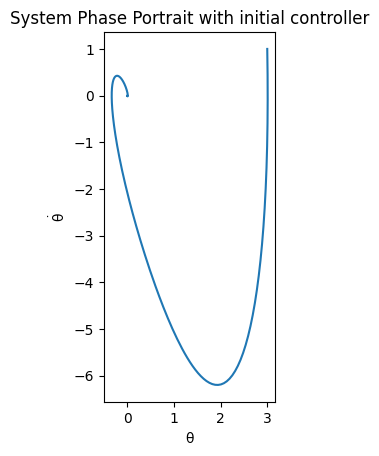

In [24]:
# 初始化动力学模型，准备收集数据
params={'m': 2,'L': 1, 'b': 0.1}
controller_params = {'K':np.array([[35, 8]])}

p1 = InvertedPendulum(system_params = params,
                      controller_params = controller_params,
                      dt = 0.01, 
                      controller_period = 0.01)


x_initial = torch.tensor([[3],[1]]).to(device)
step_num = 4000
sim_data_ = p1.simulate_rk4(x_initial, step_num, 1)
p1.convergence_judgment(sim_data_)
p1.plot_phase_portrait(data_sim = sim_data_,
                       arrow_on = False,
                       title = 'System Phase Portrait with initial controller')

d1 = DlearningProcess(system=p1,
                      actor_bound=5.0,
                      n_hiddens_policy=16,
                      n_hiddens_lyapunov=16,
                      n_hiddens_dfunction=32,
                      actor_lr=0.001,
                      lyapunov_lr=0.004,
                      dfunction_lr=0.001)



In [ ]:
_ = d1.sample_training_data(sample_trajectory_number = 4,
                            sample_number_per_trajectory = 300,
                            sample_radius = 10,
                            sample_number_in_radius = 0,
                            invariant_sample = 1,
                            sample_plot = 1,
                            the_controller = d1.actor.Controller,
                            title='Before policy initialization')


d1.initialize_policy_net(x_train_lim = 10,
                         x_test_lim = 13,
                         sample_num = 1000,
                         iteration = 10**4,
                         lr = 1e-3)


x_initial = torch.tensor([[3],[1]]).to(device)
step_num = 4000
sim_data_ = p1.simulate_rk4(x_initial = x_initial, 
                           step_number = step_num,
                           use_controller = 1,
                           the_controller = d1.actor.Controller)
stepconverge_initial = p1.convergence_judgment(sim_data_)
p1.plot_phase_portrait(data_sim = sim_data_,
                       arrow_on = False,
                       title = 'System Phase Portrait with initialized NN controller')

sim_data = d1.sample_training_data(sample_trajectory_number = 0,
                                   sample_number_per_trajectory = 0,
                                   sample_radius = 10,
                                   sample_number_in_radius = 3000,
                                   invariant_sample = 1,
                                   the_controller = d1.actor.Controller,
                                   title = 'After policy initialization but before LQR')


第1次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 2.2952287197
Epoch [2000/10000], Loss: 2.2297792435
Epoch [3000/10000], Loss: 2.1574258804
Epoch [4000/10000], Loss: 2.1032249928
Epoch [5000/10000], Loss: 2.0728263855
Epoch [6000/10000], Loss: 2.0496056080
Epoch [7000/10000], Loss: 2.0186901093
Epoch [8000/10000], Loss: 2.0012083054
Epoch [9000/10000], Loss: 1.9890661240
Epoch [10000/10000], Loss: 1.9828341007


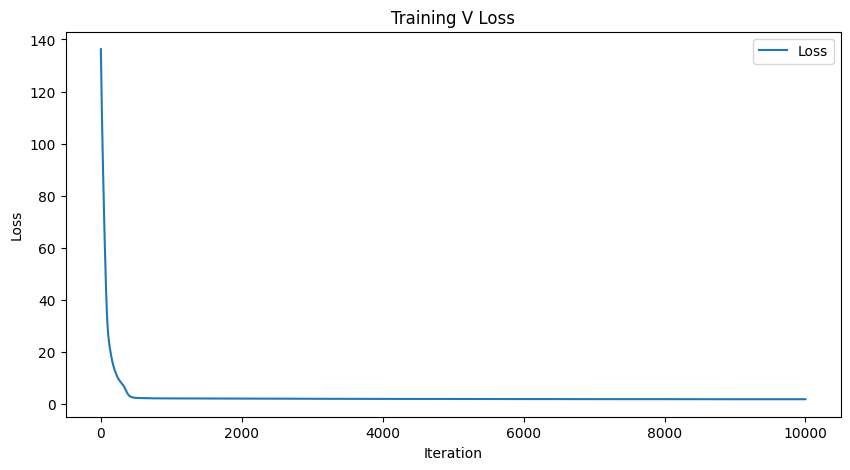

-----------------------Plotting Lyapunov-----------------------


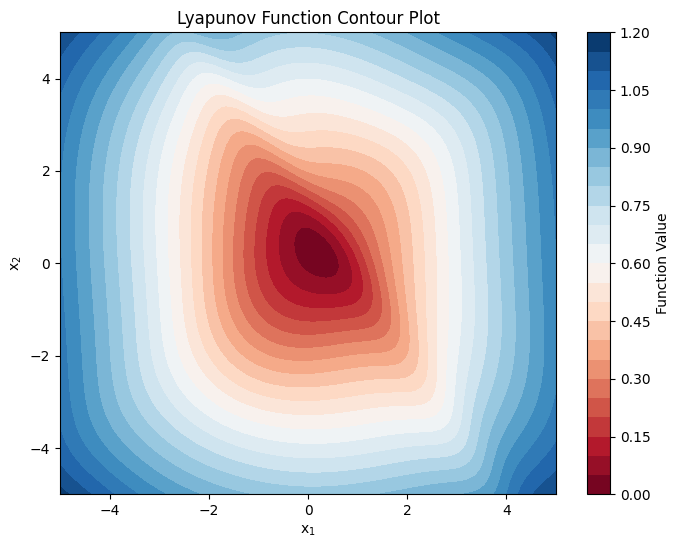

L0:tensor([0.0345], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1944.574462890625
--------------------------Learning D--------------------------
torch.Size([3000, 2])
Epoch [1000/10000], Loss: 10.6101541519
Epoch [2000/10000], Loss: 9.5134830475
Epoch [3000/10000], Loss: 7.5867314339
Epoch [4000/10000], Loss: 5.8450837135
Epoch [5000/10000], Loss: 5.0800175667
Epoch [6000/10000], Loss: 4.6589965820
Epoch [7000/10000], Loss: 4.3336687088
Epoch [8000/10000], Loss: 3.9689035416
Epoch [9000/10000], Loss: 3.7698545456
Epoch [10000/10000], Loss: 3.4682452679


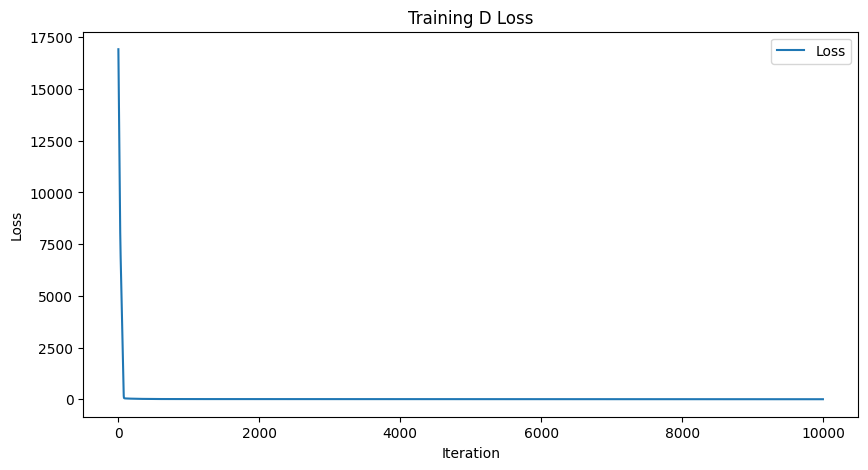

-----------------------Plotting Lyapunov-----------------------


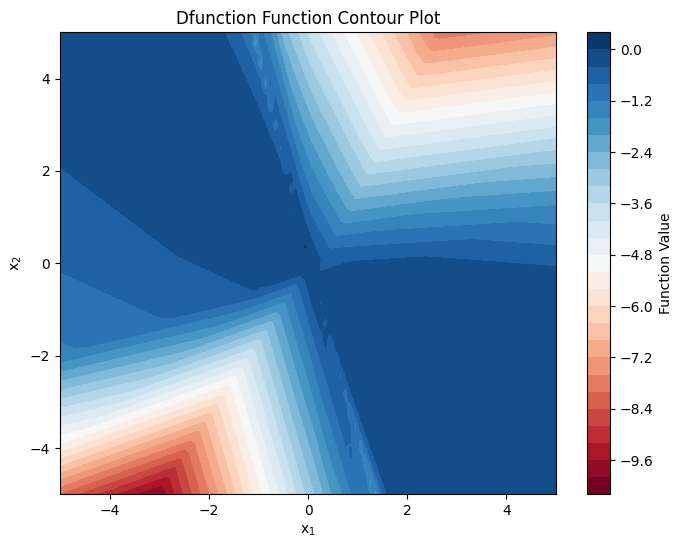

torch.sum(loss_fn(dL, DV_ext)):3.005185127258301, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0094], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


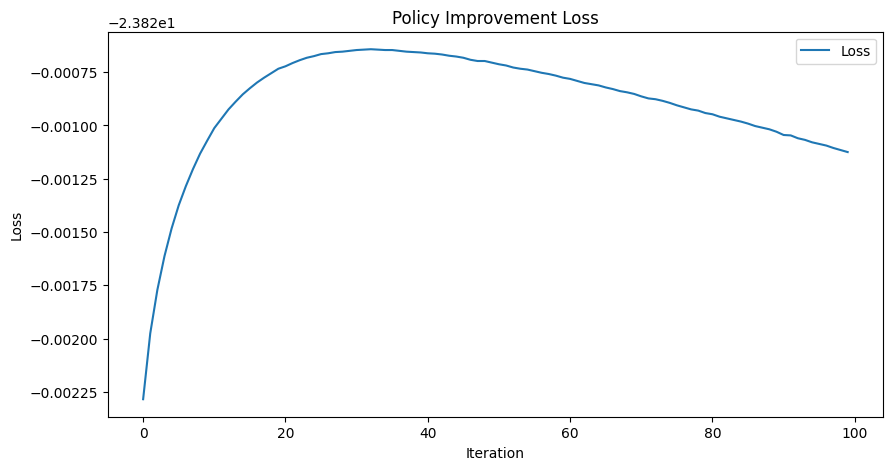

---------------------Sampling Training Data---------------------


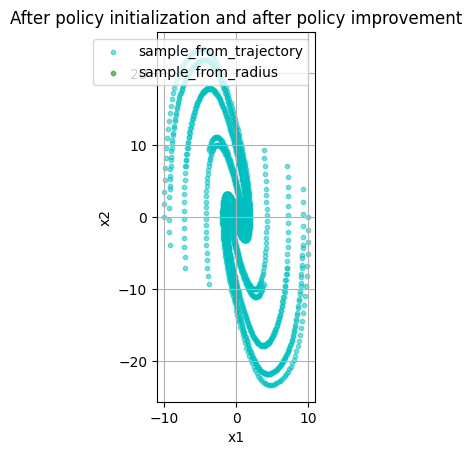

-----------------It takes 231 steps to converge.------------------


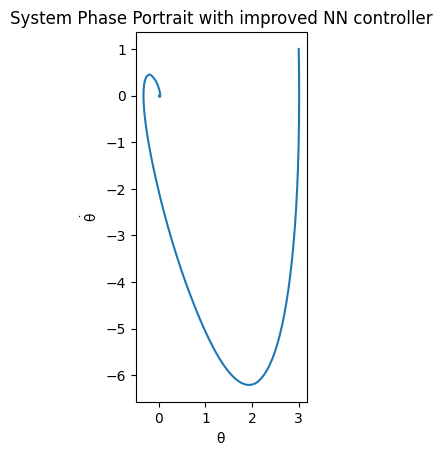

第2次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 13.3062982559
Epoch [2000/10000], Loss: 6.8383617401
Epoch [3000/10000], Loss: 4.2519841194
Epoch [4000/10000], Loss: 2.9796309471
Epoch [5000/10000], Loss: 2.2877697945
Epoch [6000/10000], Loss: 1.8517656326
Epoch [7000/10000], Loss: 1.5546300411
Epoch [8000/10000], Loss: 1.3351105452
Epoch [9000/10000], Loss: 1.2794387341
Epoch [10000/10000], Loss: 1.2543421984


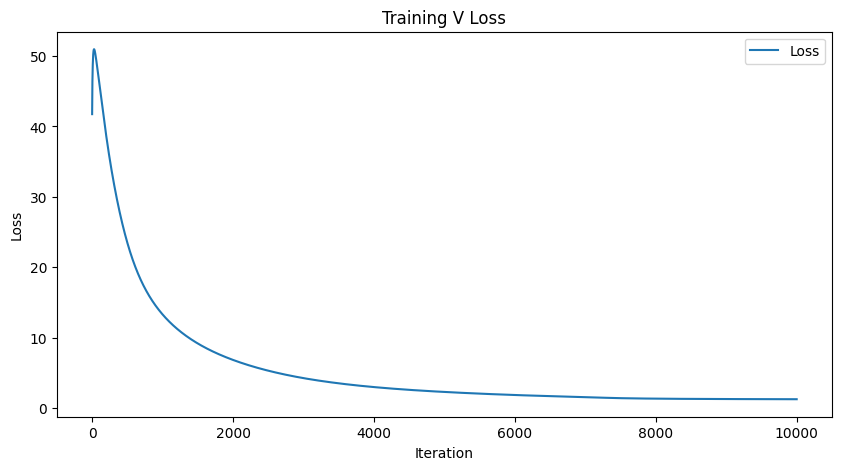

-----------------------Plotting Lyapunov-----------------------


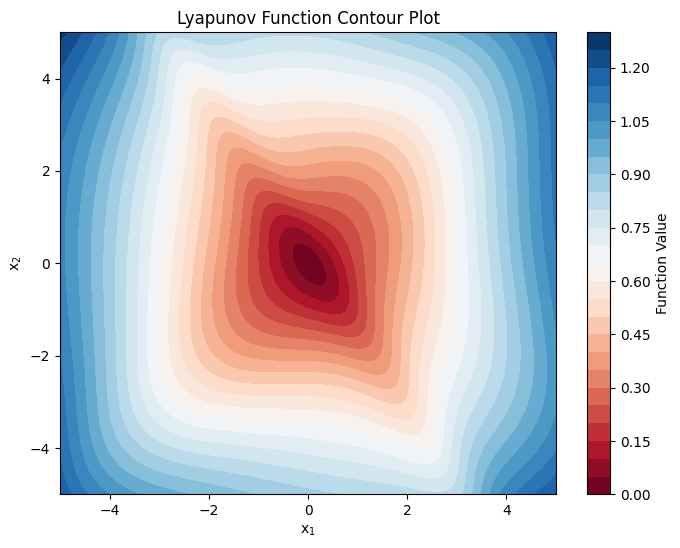

L0:tensor([0.0238], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2165.291748046875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 3.0230314732
Epoch [2000/10000], Loss: 2.8496105671
Epoch [3000/10000], Loss: 2.8348357677
Epoch [4000/10000], Loss: 2.7842261791
Epoch [5000/10000], Loss: 2.6595072746
Epoch [6000/10000], Loss: 2.7260432243
Epoch [7000/10000], Loss: 2.8336043358
Epoch [8000/10000], Loss: 2.6597995758
Epoch [9000/10000], Loss: 2.7877721786
Epoch [10000/10000], Loss: 2.7559587955


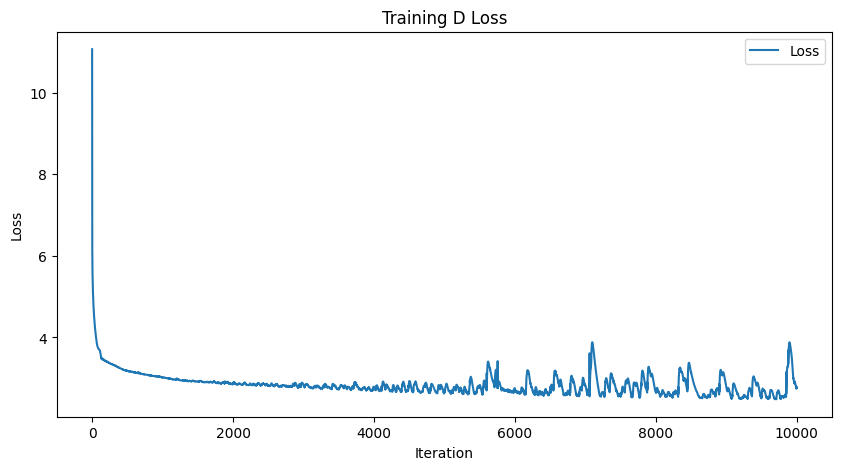

-----------------------Plotting Lyapunov-----------------------


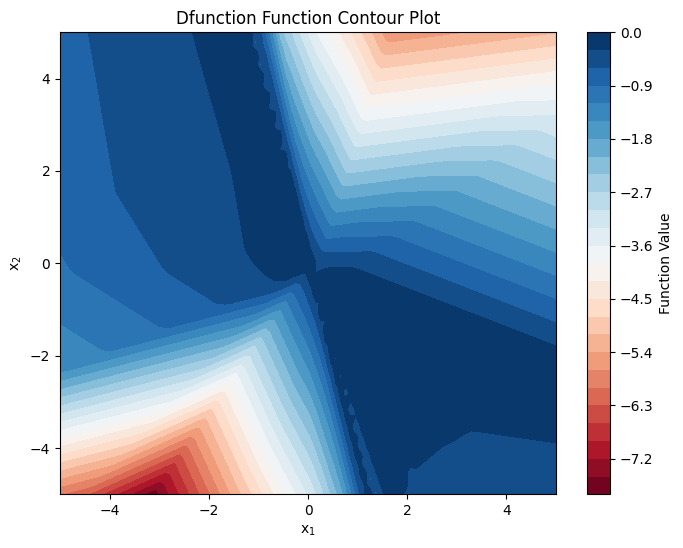

torch.sum(loss_fn(dL, DV_ext)):2.3361353874206543, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0081], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


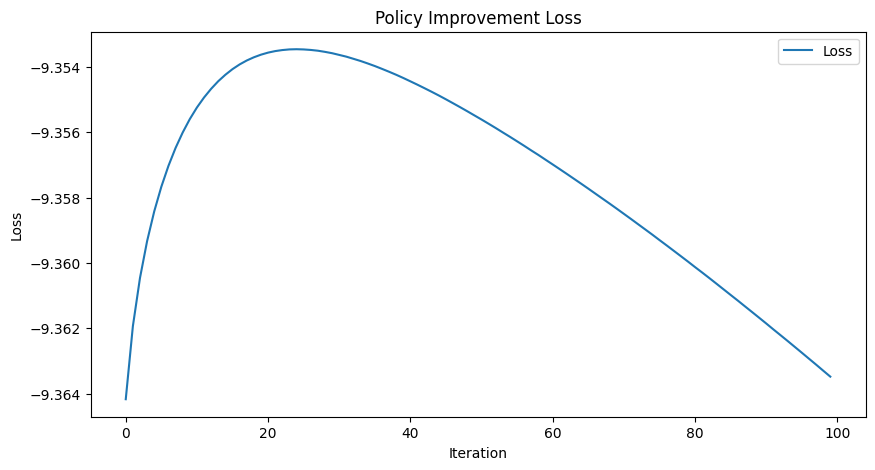

---------------------Sampling Training Data---------------------


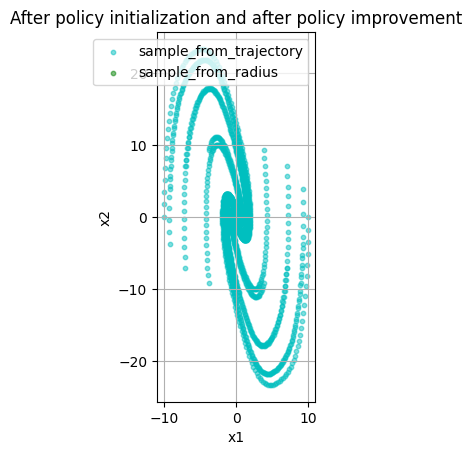

-----------------It takes 231 steps to converge.------------------


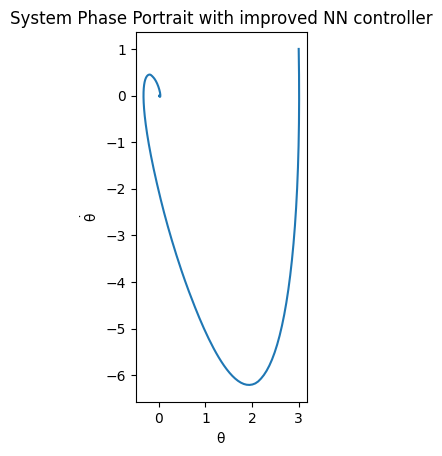

第3次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.4530234337
Epoch [2000/10000], Loss: 1.2932775021
Epoch [3000/10000], Loss: 1.2543907166
Epoch [4000/10000], Loss: 1.2430121899
Epoch [5000/10000], Loss: 1.2367421389
Epoch [6000/10000], Loss: 1.2303392887
Epoch [7000/10000], Loss: 1.2226285934
Epoch [8000/10000], Loss: 1.2134830952
Epoch [9000/10000], Loss: 1.2036421299
Epoch [10000/10000], Loss: 1.1919640303


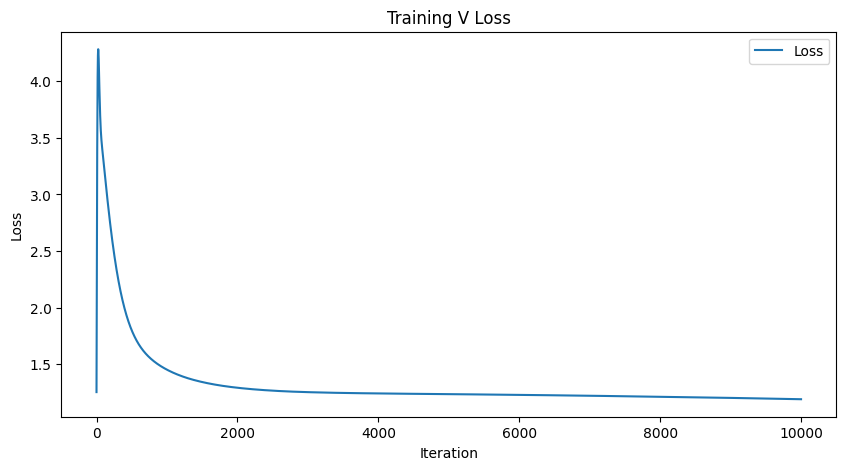

-----------------------Plotting Lyapunov-----------------------


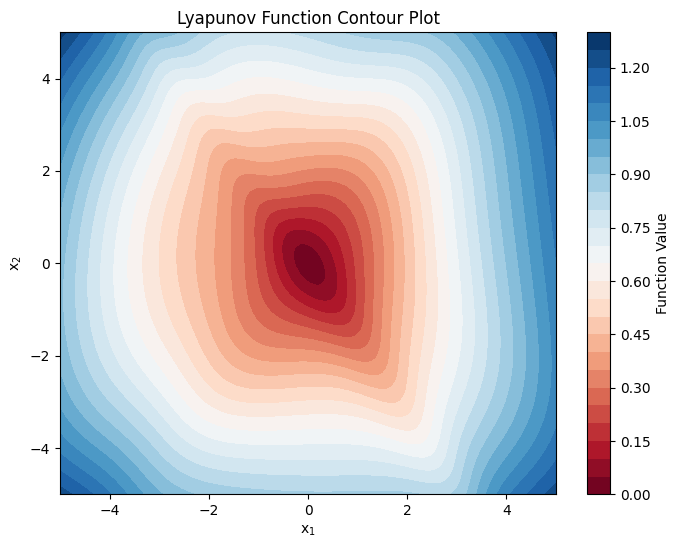

L0:tensor([0.0216], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2094.803466796875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.4638309479
Epoch [2000/10000], Loss: 2.3776535988
Epoch [3000/10000], Loss: 2.5036072731
Epoch [4000/10000], Loss: 2.5512788296
Epoch [5000/10000], Loss: 2.4398291111
Epoch [6000/10000], Loss: 2.3754546642
Epoch [7000/10000], Loss: 2.5821099281
Epoch [8000/10000], Loss: 2.6377010345
Epoch [9000/10000], Loss: 2.5829107761
Epoch [10000/10000], Loss: 2.9709444046


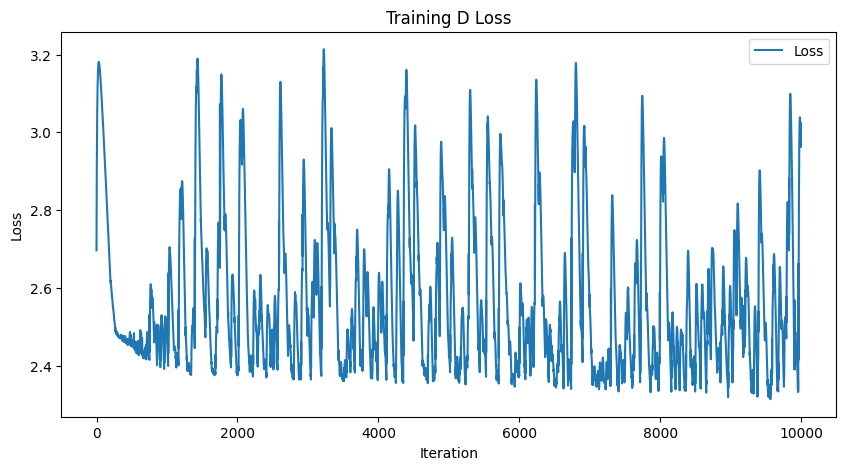

-----------------------Plotting Lyapunov-----------------------


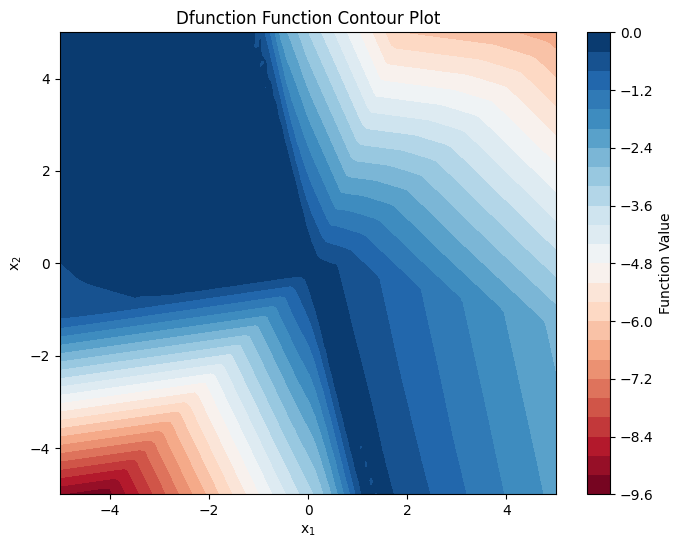

torch.sum(loss_fn(dL, DV_ext)):2.5868494510650635, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0097], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


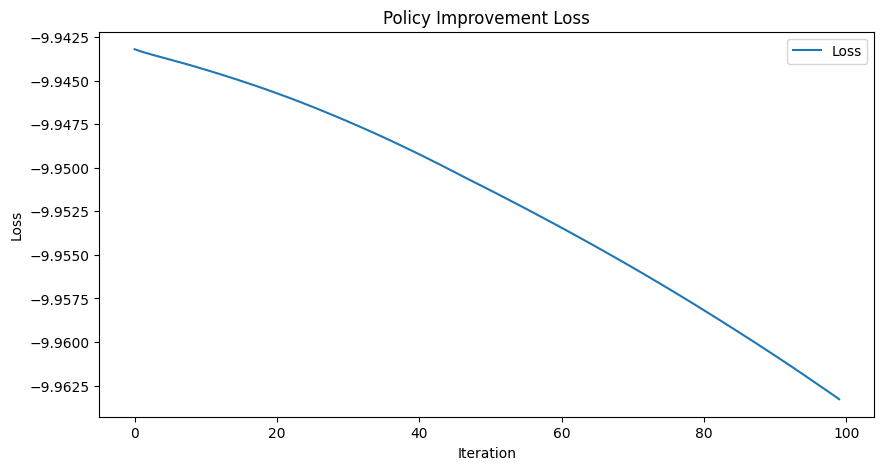

---------------------Sampling Training Data---------------------


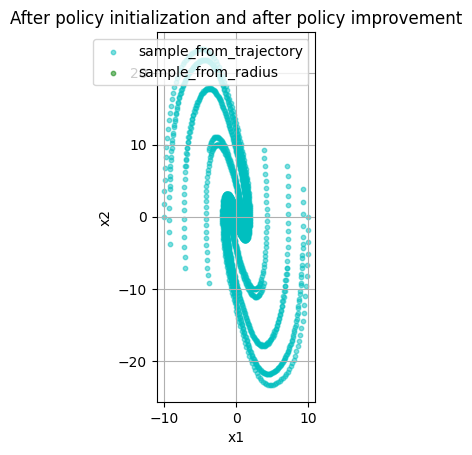

-----------------It takes 231 steps to converge.------------------


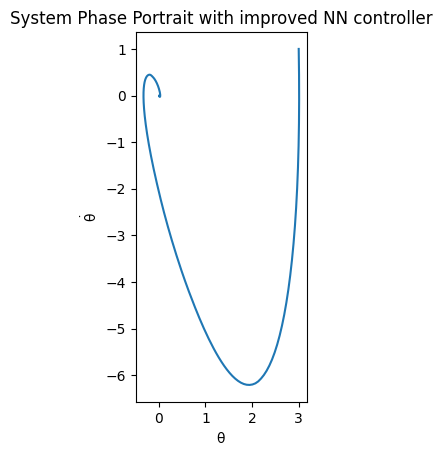

第4次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.4057869911
Epoch [2000/10000], Loss: 1.2410885096
Epoch [3000/10000], Loss: 1.2023762465
Epoch [4000/10000], Loss: 1.1916526556
Epoch [5000/10000], Loss: 1.1890034676
Epoch [6000/10000], Loss: 1.1870143414
Epoch [7000/10000], Loss: 1.1840938330
Epoch [8000/10000], Loss: 1.1794201136
Epoch [9000/10000], Loss: 1.1732851267
Epoch [10000/10000], Loss: 1.1652474403


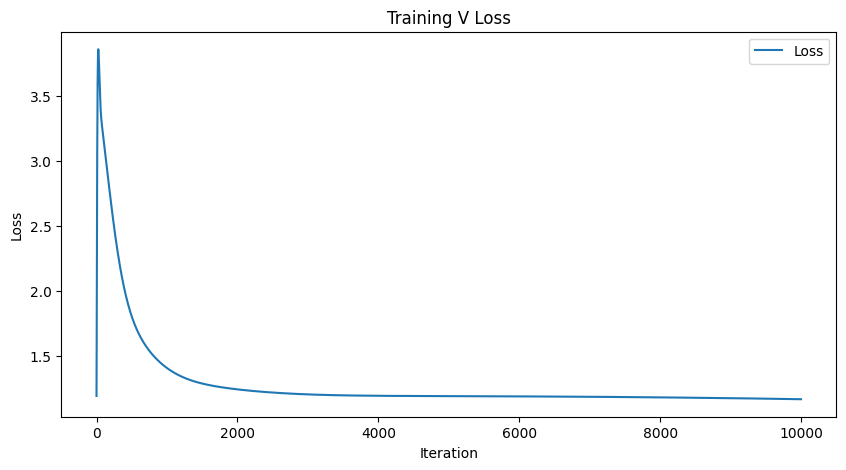

-----------------------Plotting Lyapunov-----------------------


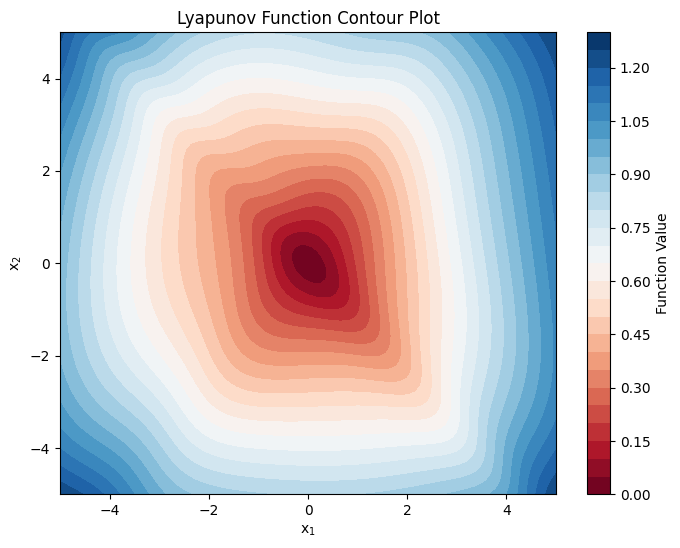

L0:tensor([0.0184], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2121.92041015625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.4603552818
Epoch [2000/10000], Loss: 2.8083119392
Epoch [3000/10000], Loss: 2.6615500450
Epoch [4000/10000], Loss: 2.3664751053
Epoch [5000/10000], Loss: 2.4845001698
Epoch [6000/10000], Loss: 2.4871473312
Epoch [7000/10000], Loss: 2.3861472607
Epoch [8000/10000], Loss: 2.3017206192
Epoch [9000/10000], Loss: 2.7951481342
Epoch [10000/10000], Loss: 2.2832348347


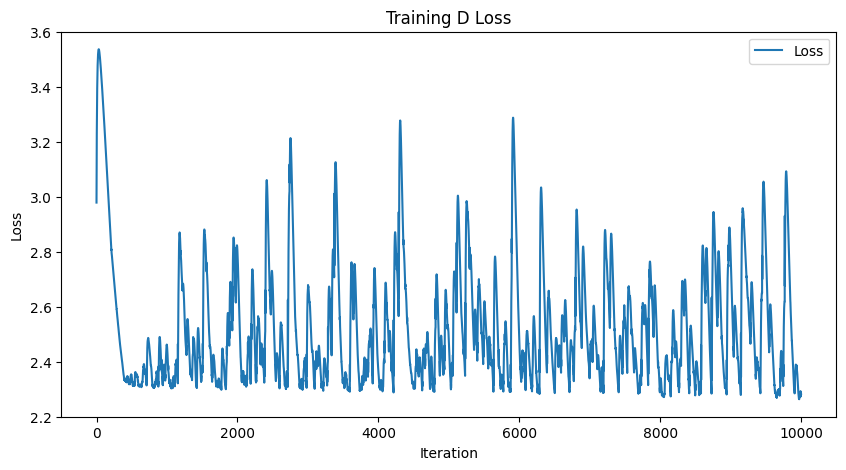

-----------------------Plotting Lyapunov-----------------------


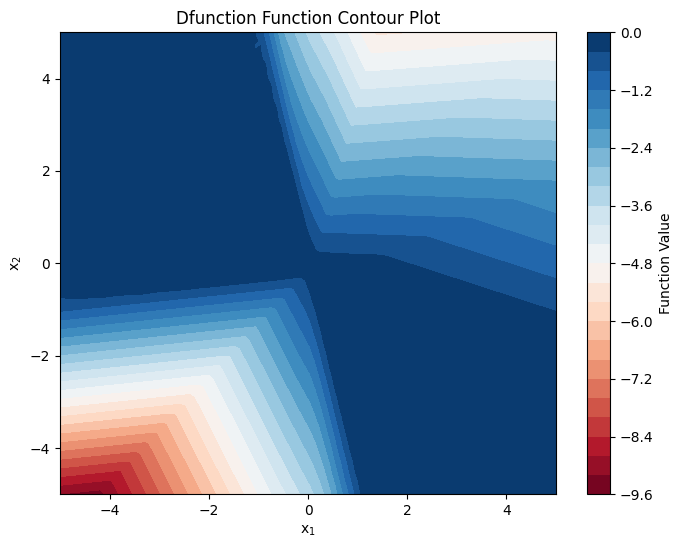

torch.sum(loss_fn(dL, DV_ext)):1.9306762218475342, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0063], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


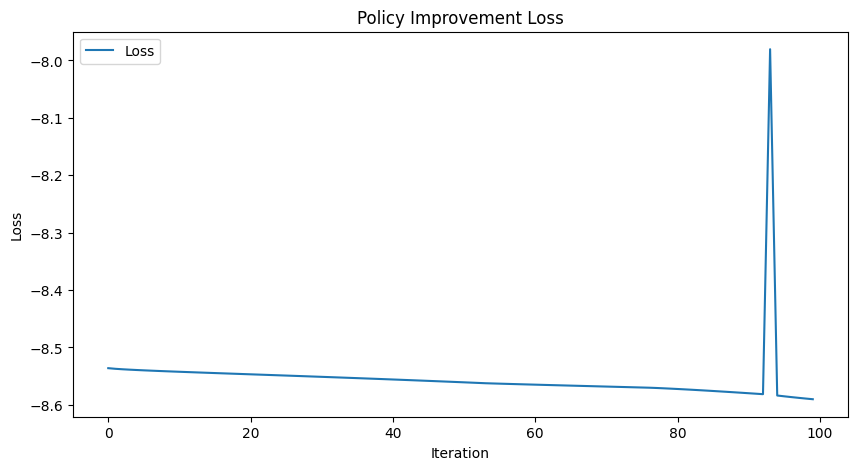

---------------------Sampling Training Data---------------------


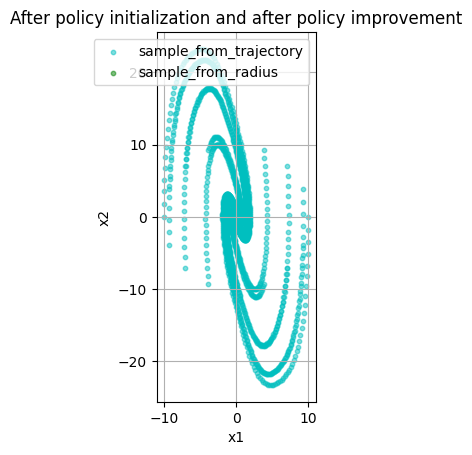

-----------------It takes 230 steps to converge.------------------


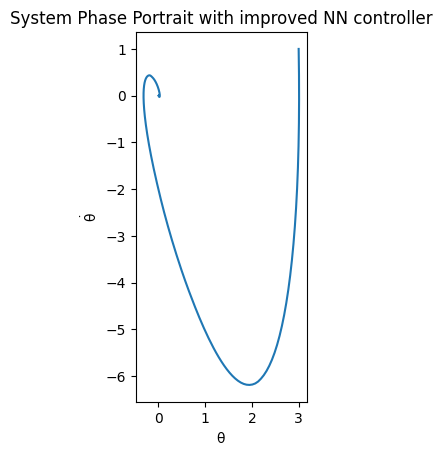

第5次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3882800341
Epoch [2000/10000], Loss: 1.2079818249
Epoch [3000/10000], Loss: 1.1712448597
Epoch [4000/10000], Loss: 1.1626018286
Epoch [5000/10000], Loss: 1.1599571705
Epoch [6000/10000], Loss: 1.1584680080
Epoch [7000/10000], Loss: 1.1567926407
Epoch [8000/10000], Loss: 1.1544111967
Epoch [9000/10000], Loss: 1.1509346962
Epoch [10000/10000], Loss: 1.1459271908


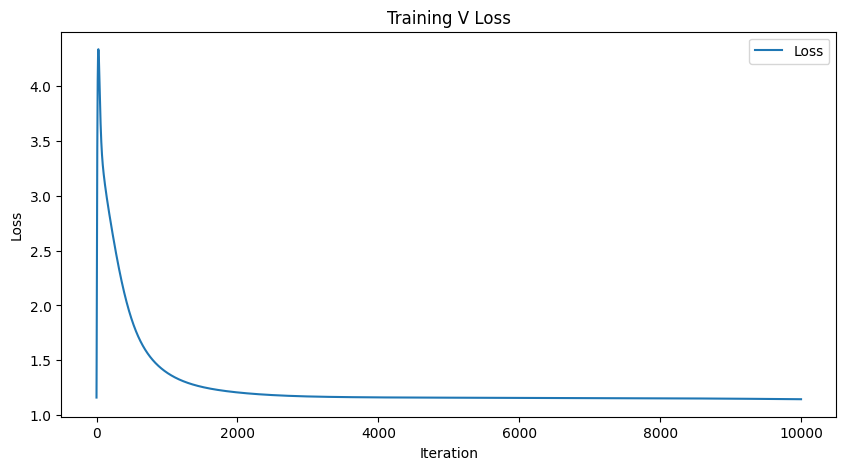

-----------------------Plotting Lyapunov-----------------------


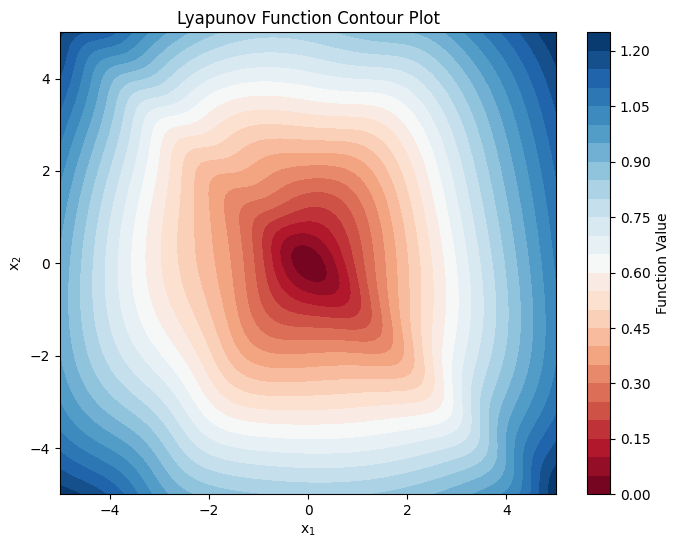

L0:tensor([0.0153], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2100.74853515625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.3117618561
Epoch [2000/10000], Loss: 2.3048083782
Epoch [3000/10000], Loss: 2.3851990700
Epoch [4000/10000], Loss: 2.5393404961
Epoch [5000/10000], Loss: 2.5700702667
Epoch [6000/10000], Loss: 2.2590236664
Epoch [7000/10000], Loss: 3.0279264450
Epoch [8000/10000], Loss: 2.2751591206
Epoch [9000/10000], Loss: 2.4228374958
Epoch [10000/10000], Loss: 2.2922589779


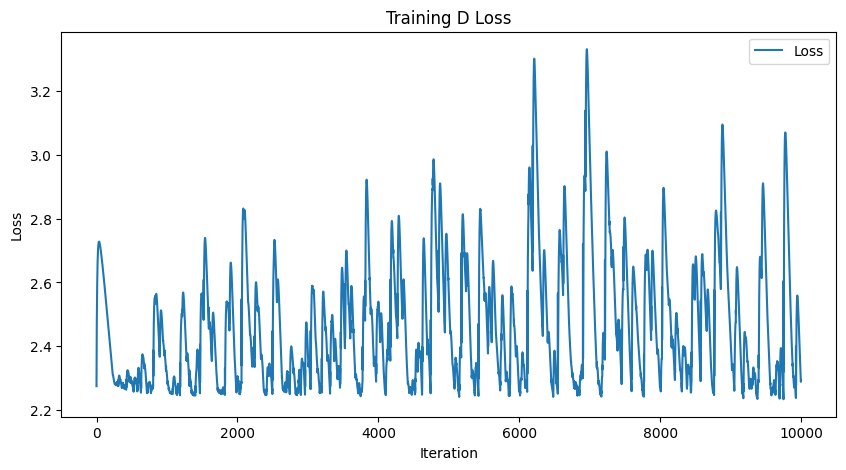

-----------------------Plotting Lyapunov-----------------------


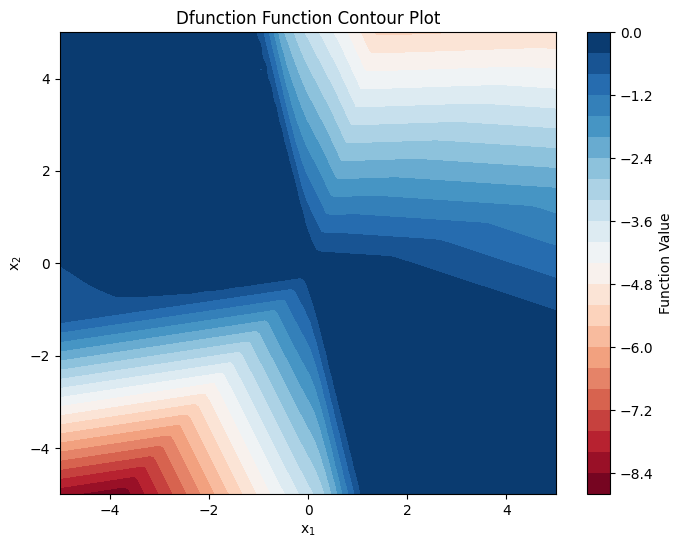

torch.sum(loss_fn(dL, DV_ext)):1.9577510356903076, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0121], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


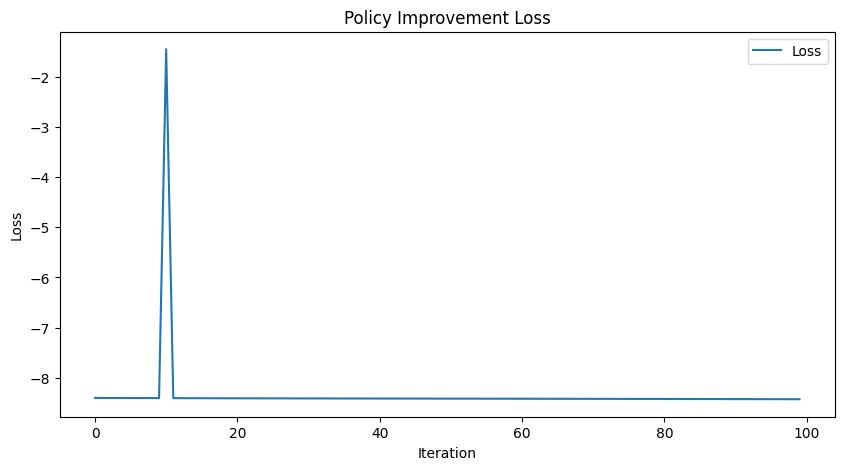

---------------------Sampling Training Data---------------------


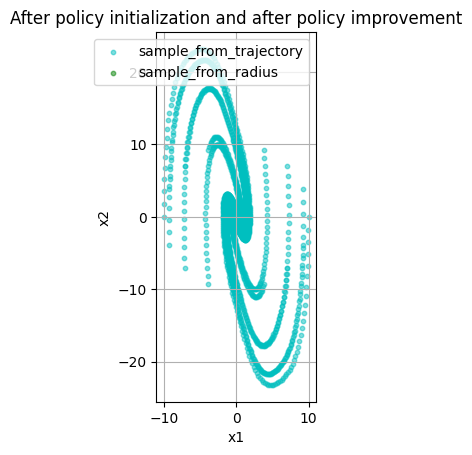

-----------------It takes 229 steps to converge.------------------


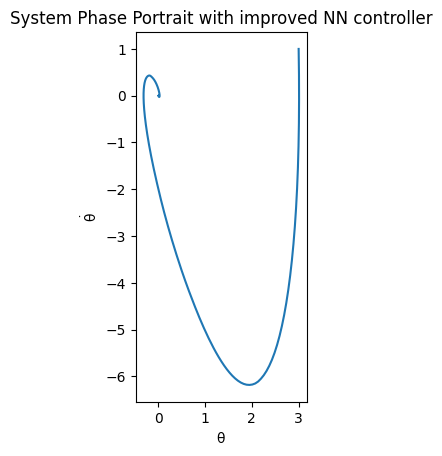

第6次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3807446957
Epoch [2000/10000], Loss: 1.1932719946
Epoch [3000/10000], Loss: 1.1566787958
Epoch [4000/10000], Loss: 1.1470266581
Epoch [5000/10000], Loss: 1.1442726851
Epoch [6000/10000], Loss: 1.1432365179
Epoch [7000/10000], Loss: 1.1421828270
Epoch [8000/10000], Loss: 1.1406524181
Epoch [9000/10000], Loss: 1.1383311749
Epoch [10000/10000], Loss: 1.1347560883


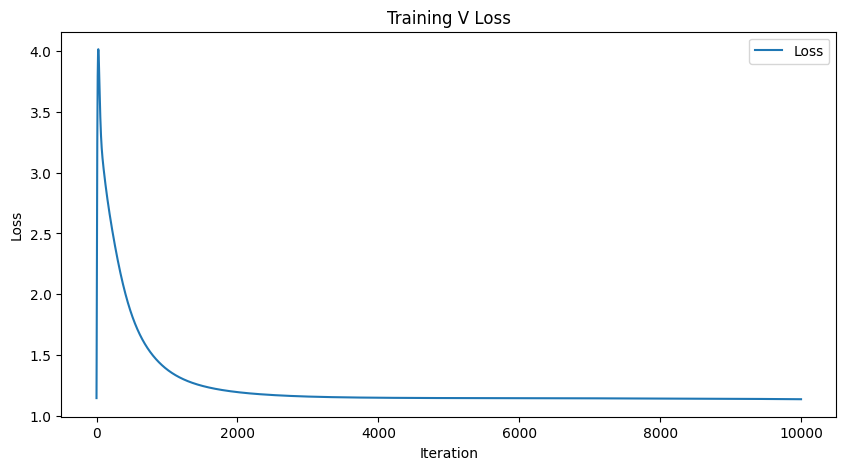

-----------------------Plotting Lyapunov-----------------------


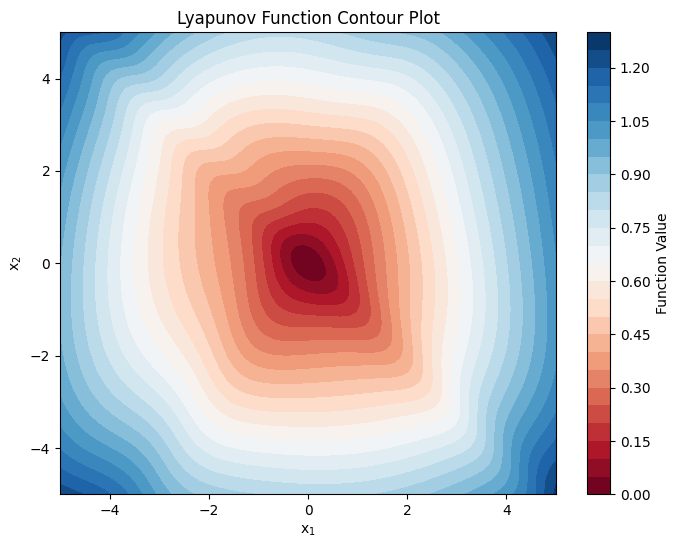

L0:tensor([0.0135], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2079.412353515625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.6357634068
Epoch [2000/10000], Loss: 2.3414430618
Epoch [3000/10000], Loss: 2.7956159115
Epoch [4000/10000], Loss: 2.6822581291
Epoch [5000/10000], Loss: 2.7839837074
Epoch [6000/10000], Loss: 2.8217222691
Epoch [7000/10000], Loss: 2.4297456741
Epoch [8000/10000], Loss: 2.4255006313
Epoch [9000/10000], Loss: 2.8495893478
Epoch [10000/10000], Loss: 3.1069645882


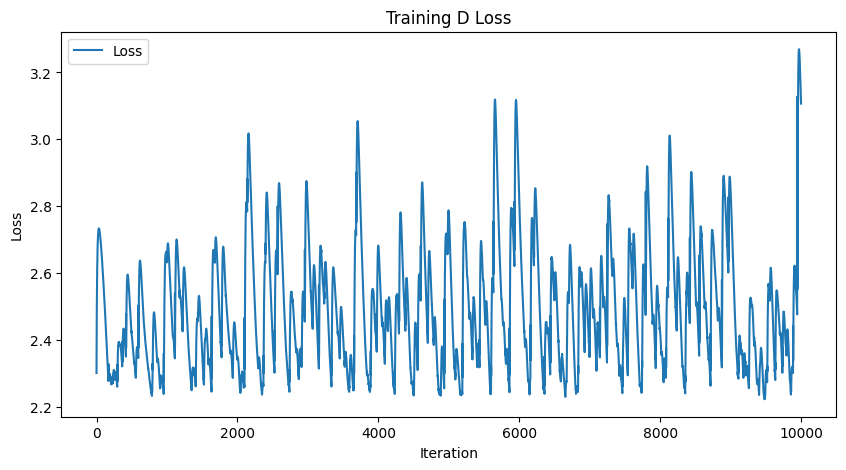

-----------------------Plotting Lyapunov-----------------------


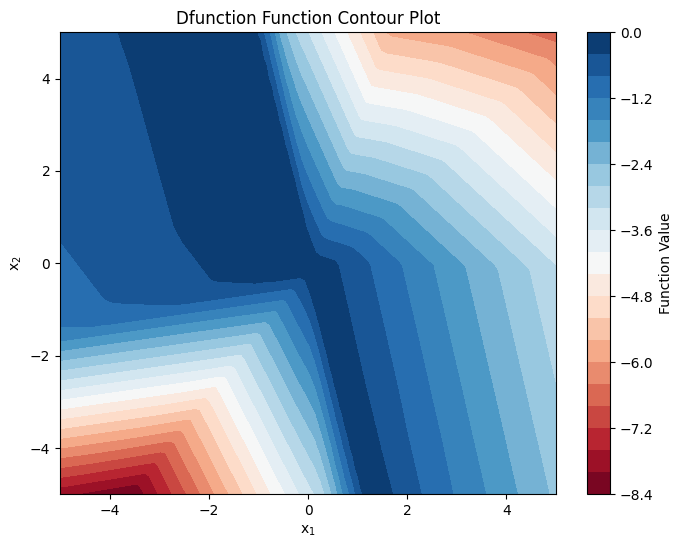

torch.sum(loss_fn(dL, DV_ext)):2.783057689666748, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0192], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


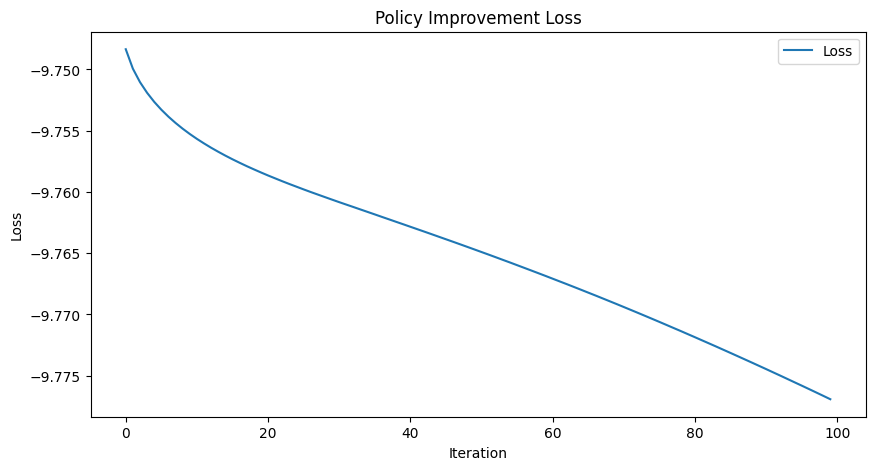

---------------------Sampling Training Data---------------------


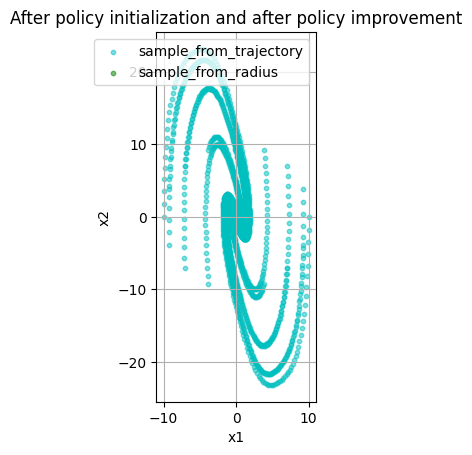

-----------------It takes 228 steps to converge.------------------


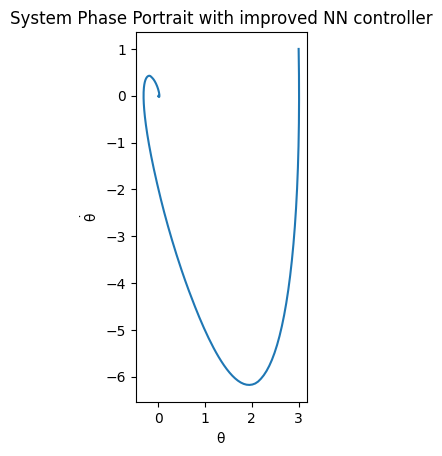

第7次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3614401817
Epoch [2000/10000], Loss: 1.1805047989
Epoch [3000/10000], Loss: 1.1456264257
Epoch [4000/10000], Loss: 1.1354087591
Epoch [5000/10000], Loss: 1.1327403784
Epoch [6000/10000], Loss: 1.1314526796
Epoch [7000/10000], Loss: 1.1302210093
Epoch [8000/10000], Loss: 1.1285668612
Epoch [9000/10000], Loss: 1.1261234283
Epoch [10000/10000], Loss: 1.1225305796


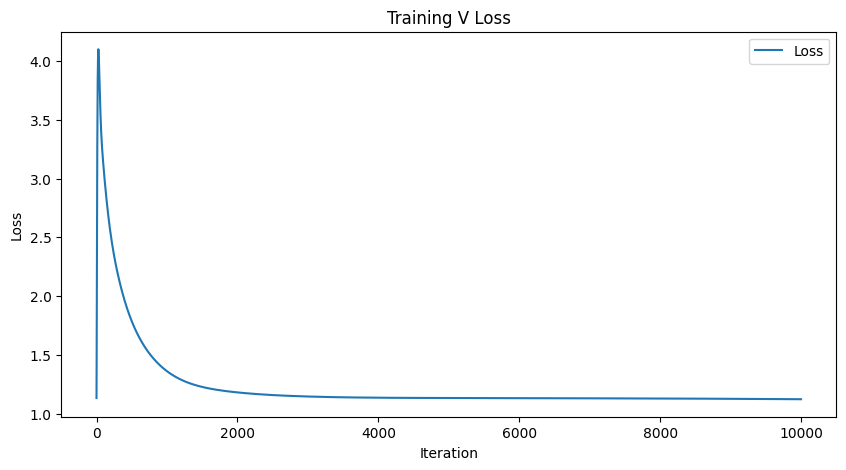

-----------------------Plotting Lyapunov-----------------------


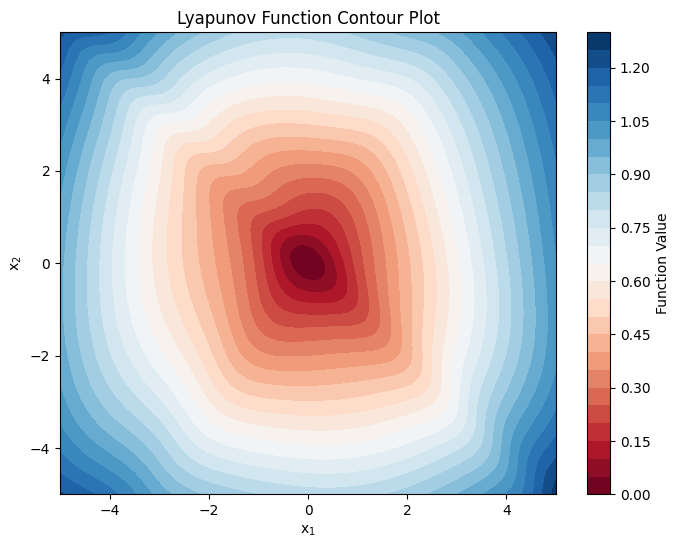

L0:tensor([0.0110], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2055.17822265625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.3479695320
Epoch [2000/10000], Loss: 2.3277649879
Epoch [3000/10000], Loss: 2.6277546883
Epoch [4000/10000], Loss: 2.3880269527
Epoch [5000/10000], Loss: 2.4276242256
Epoch [6000/10000], Loss: 2.2493762970
Epoch [7000/10000], Loss: 2.5086708069
Epoch [8000/10000], Loss: 2.5551288128
Epoch [9000/10000], Loss: 2.8423523903
Epoch [10000/10000], Loss: 2.2415027618


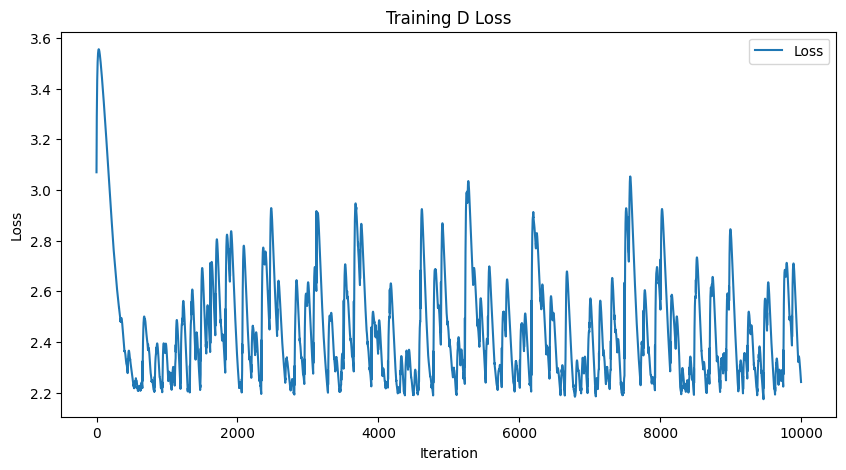

-----------------------Plotting Lyapunov-----------------------


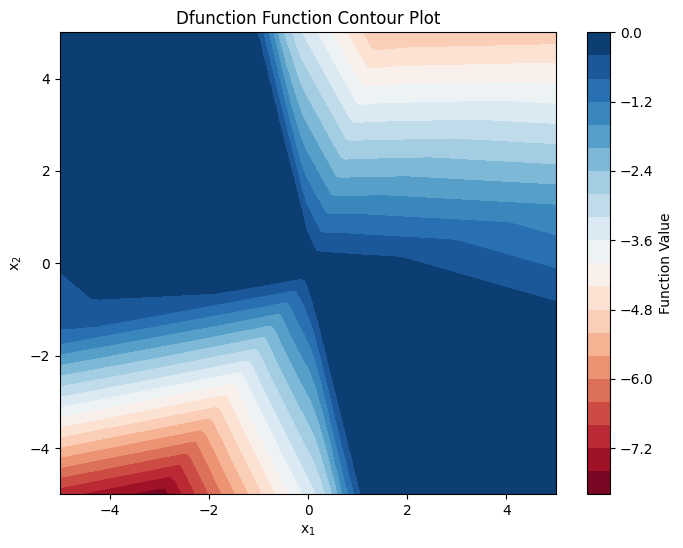

torch.sum(loss_fn(dL, DV_ext)):1.9348118305206299, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0039], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


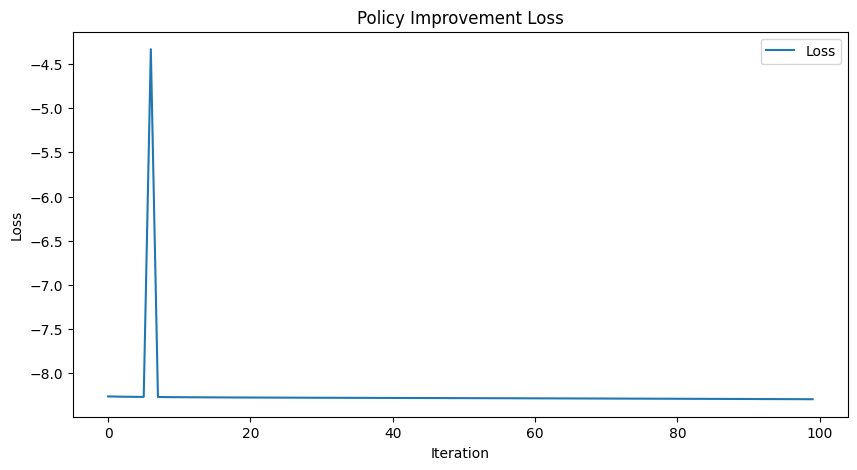

---------------------Sampling Training Data---------------------


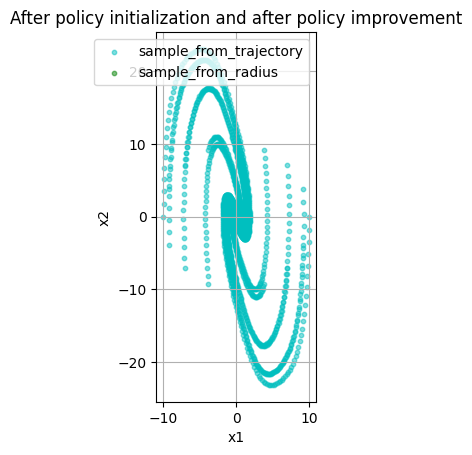

-----------------It takes 228 steps to converge.------------------


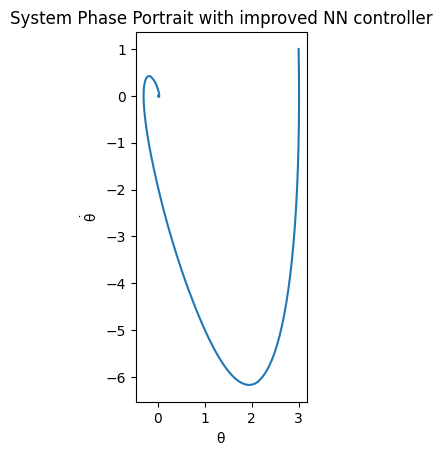

第8次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3354860544
Epoch [2000/10000], Loss: 1.1701959372
Epoch [3000/10000], Loss: 1.1323686838
Epoch [4000/10000], Loss: 1.1226655245
Epoch [5000/10000], Loss: 1.1202341318
Epoch [6000/10000], Loss: 1.1192704439
Epoch [7000/10000], Loss: 1.1183373928
Epoch [8000/10000], Loss: 1.1170254946
Epoch [9000/10000], Loss: 1.1151242256
Epoch [10000/10000], Loss: 1.1124411821


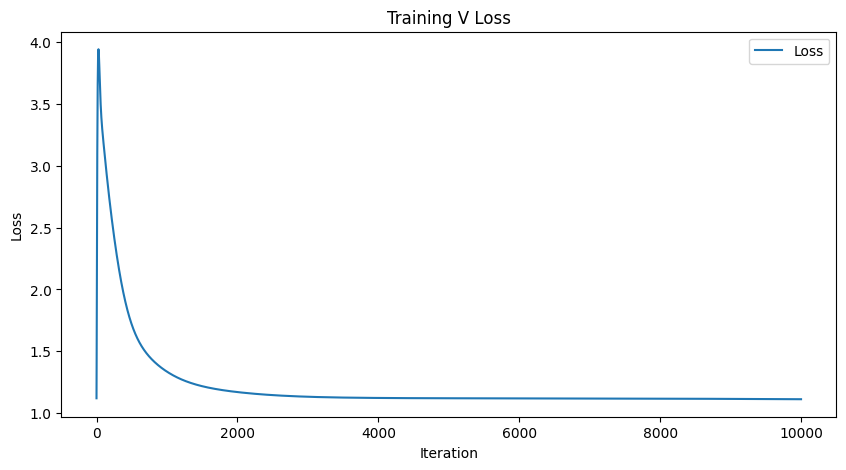

-----------------------Plotting Lyapunov-----------------------


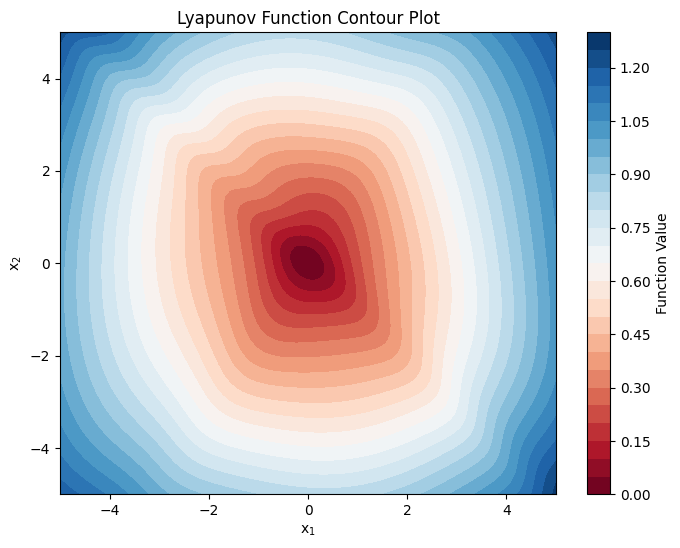

L0:tensor([0.0087], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2025.42822265625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.5605905056
Epoch [2000/10000], Loss: 2.2062051296
Epoch [3000/10000], Loss: 2.5161161423
Epoch [4000/10000], Loss: 2.6032142639
Epoch [5000/10000], Loss: 2.7205674648
Epoch [6000/10000], Loss: 2.5423316956
Epoch [7000/10000], Loss: 2.5624623299
Epoch [8000/10000], Loss: 2.6295673847
Epoch [9000/10000], Loss: 2.6129934788
Epoch [10000/10000], Loss: 2.5782697201


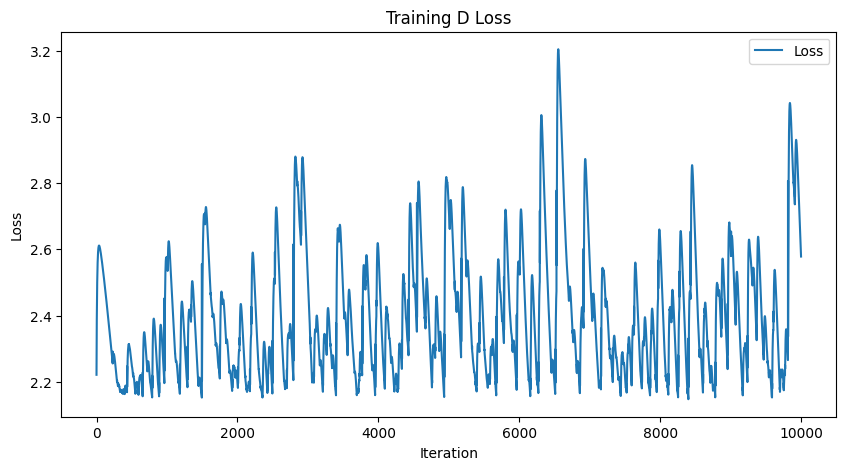

-----------------------Plotting Lyapunov-----------------------


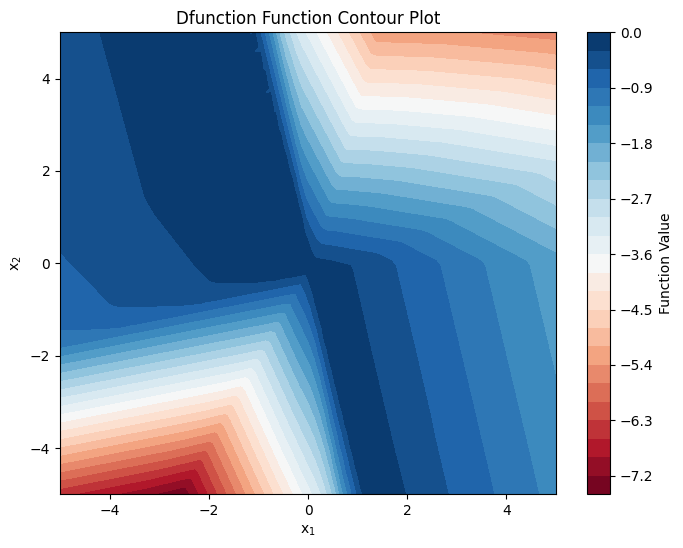

torch.sum(loss_fn(dL, DV_ext)):2.2815613746643066, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0126], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


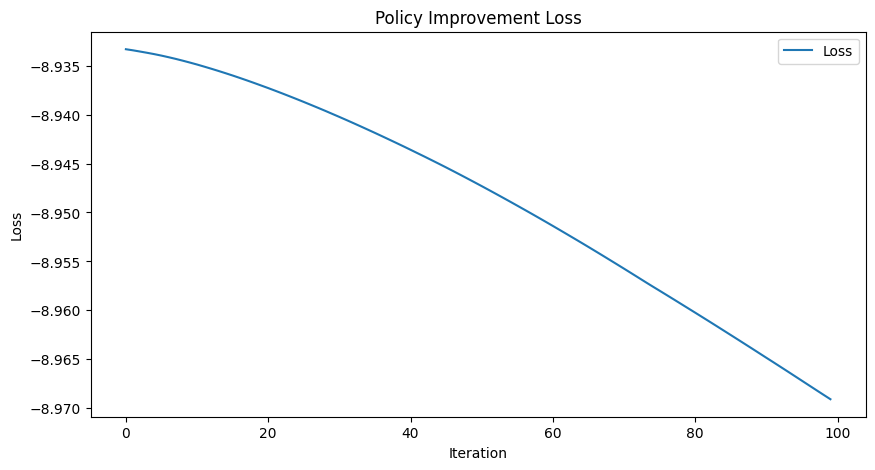

---------------------Sampling Training Data---------------------


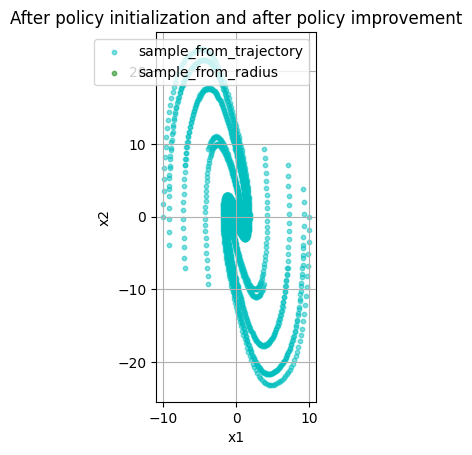

-----------------It takes 227 steps to converge.------------------


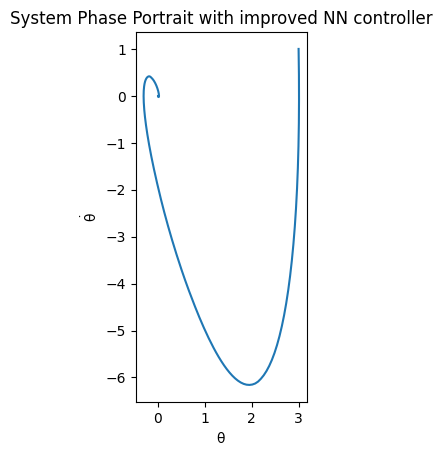

第9次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3326447010
Epoch [2000/10000], Loss: 1.1854364872
Epoch [3000/10000], Loss: 1.1309120655
Epoch [4000/10000], Loss: 1.1143926382
Epoch [5000/10000], Loss: 1.1107597351
Epoch [6000/10000], Loss: 1.1098067760
Epoch [7000/10000], Loss: 1.1091018915
Epoch [8000/10000], Loss: 1.1082805395
Epoch [9000/10000], Loss: 1.1071708202
Epoch [10000/10000], Loss: 1.1056963205


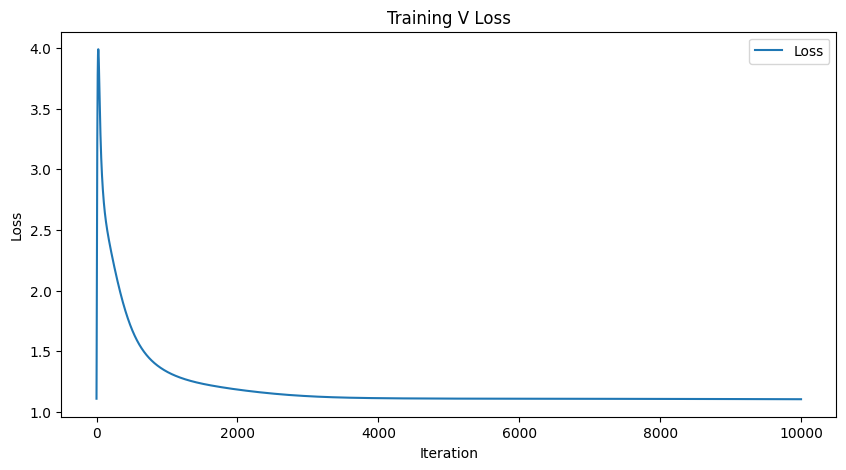

-----------------------Plotting Lyapunov-----------------------


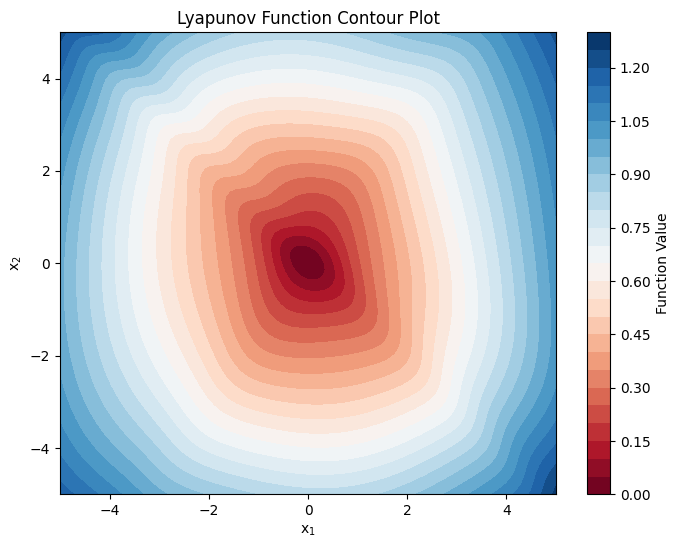

L0:tensor([0.0069], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2003.6700439453125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.6101248264
Epoch [2000/10000], Loss: 2.6116607189
Epoch [3000/10000], Loss: 2.8069262505
Epoch [4000/10000], Loss: 2.3003079891
Epoch [5000/10000], Loss: 2.3517491817
Epoch [6000/10000], Loss: 2.3295085430
Epoch [7000/10000], Loss: 2.5225877762
Epoch [8000/10000], Loss: 2.3949475288
Epoch [9000/10000], Loss: 2.2030351162
Epoch [10000/10000], Loss: 2.5319600105


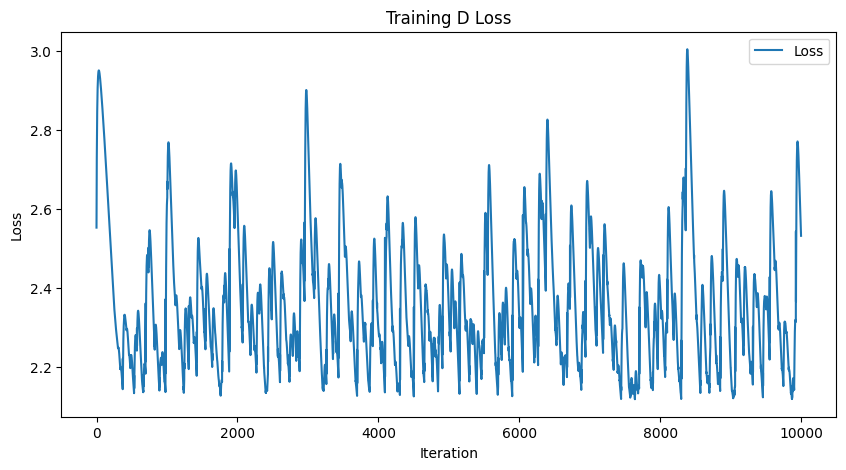

-----------------------Plotting Lyapunov-----------------------


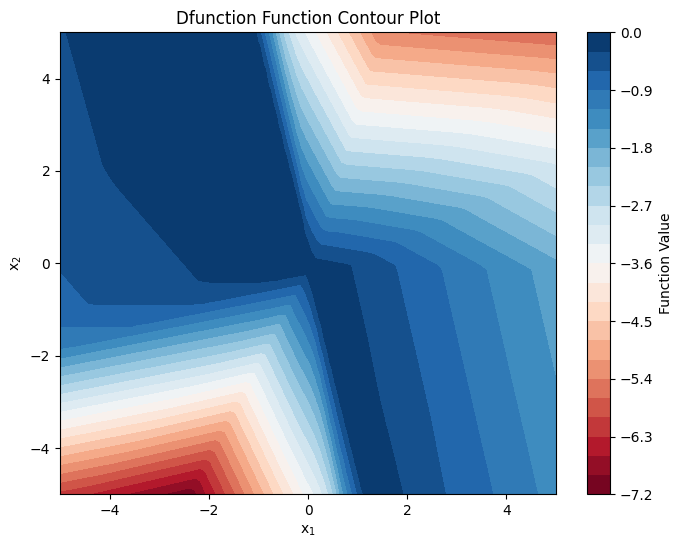

torch.sum(loss_fn(dL, DV_ext)):2.24792742729187, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0052], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


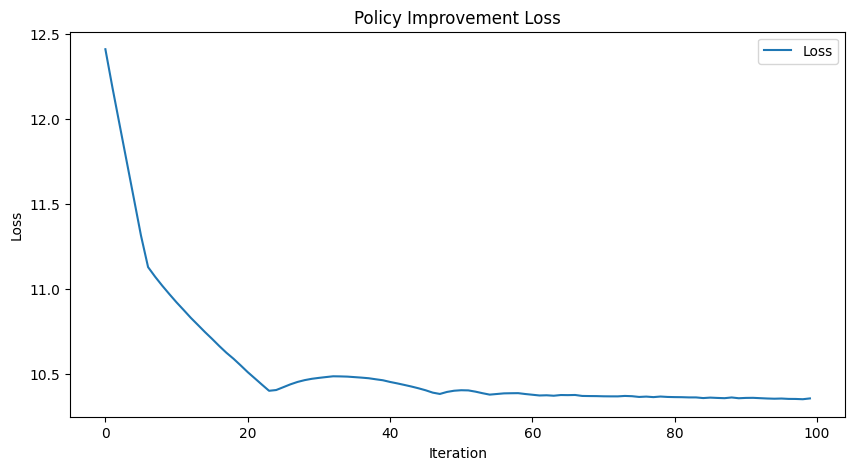

---------------------Sampling Training Data---------------------


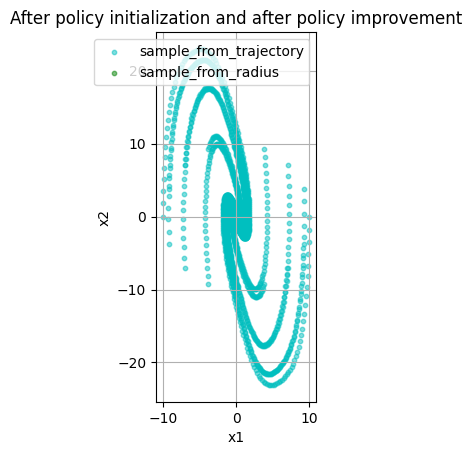

-----------------It takes 226 steps to converge.------------------


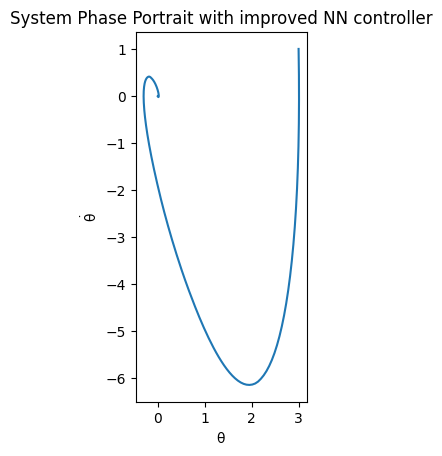

第10次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3036861420
Epoch [2000/10000], Loss: 1.1700663567
Epoch [3000/10000], Loss: 1.1200788021
Epoch [4000/10000], Loss: 1.1060875654
Epoch [5000/10000], Loss: 1.1036188602
Epoch [6000/10000], Loss: 1.1029704809
Epoch [7000/10000], Loss: 1.1025230885
Epoch [8000/10000], Loss: 1.1020063162
Epoch [9000/10000], Loss: 1.1012943983
Epoch [10000/10000], Loss: 1.1003643274


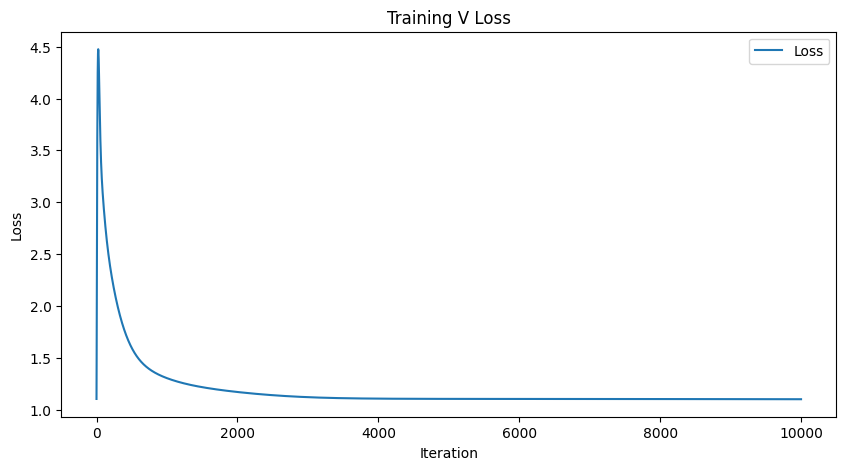

-----------------------Plotting Lyapunov-----------------------


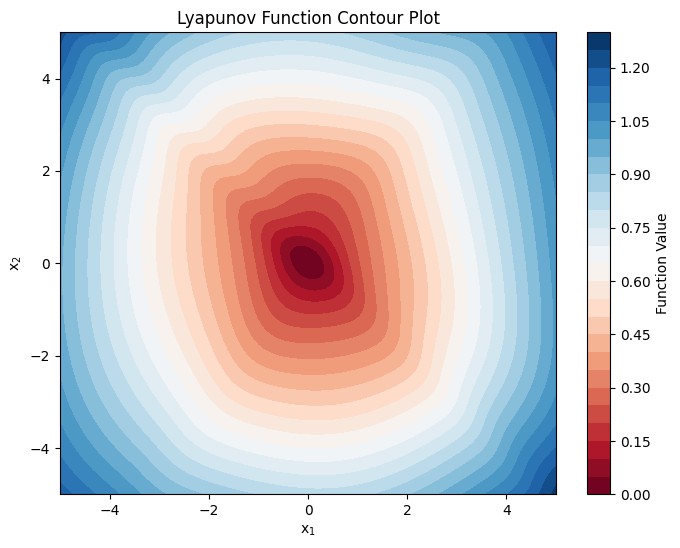

L0:tensor([0.0057], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1983.47119140625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.3065443039
Epoch [2000/10000], Loss: 2.1550748348
Epoch [3000/10000], Loss: 2.1532468796
Epoch [4000/10000], Loss: 2.2715179920
Epoch [5000/10000], Loss: 2.1044113636
Epoch [6000/10000], Loss: 2.3201441765
Epoch [7000/10000], Loss: 2.1432979107
Epoch [8000/10000], Loss: 2.0943379402
Epoch [9000/10000], Loss: 2.2277438641
Epoch [10000/10000], Loss: 2.0870268345


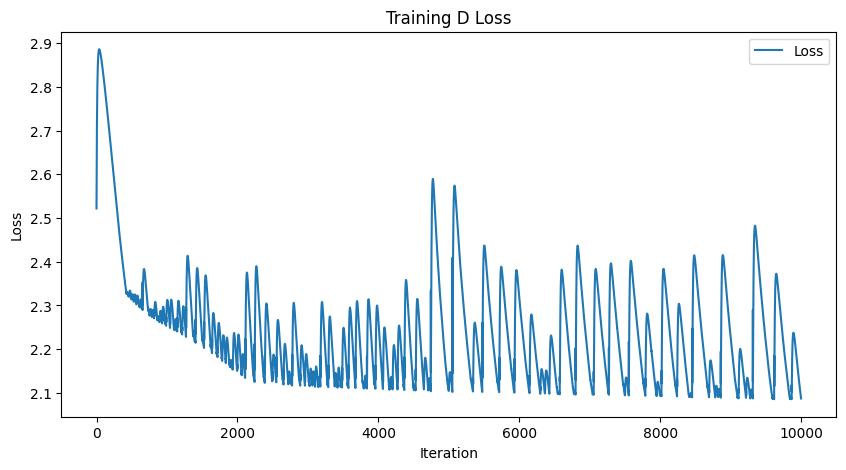

-----------------------Plotting Lyapunov-----------------------


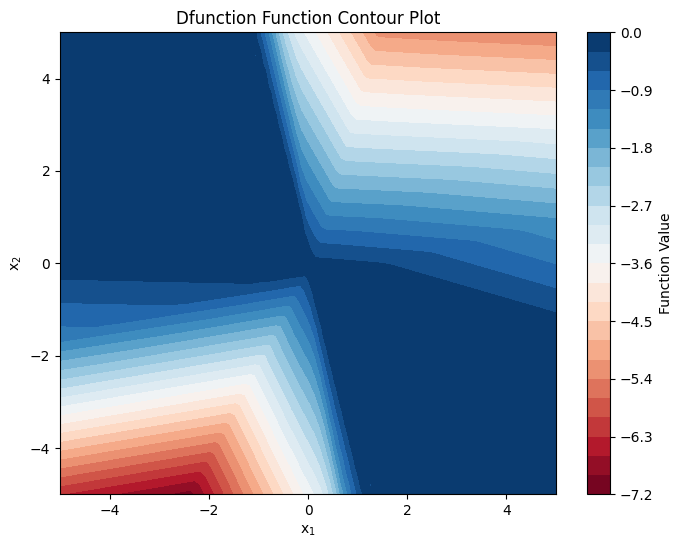

torch.sum(loss_fn(dL, DV_ext)):1.8113653659820557, torch.sum(F.relu(DV)):0.0008522346615791321, D0:tensor([-0.0076], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


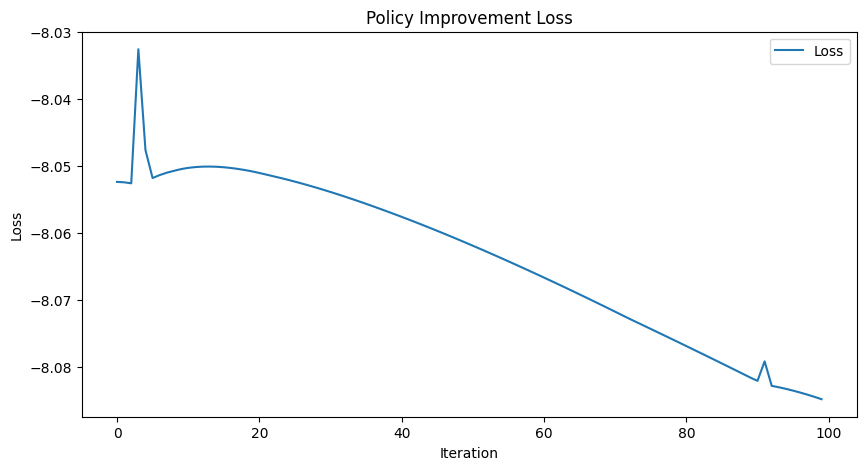

---------------------Sampling Training Data---------------------


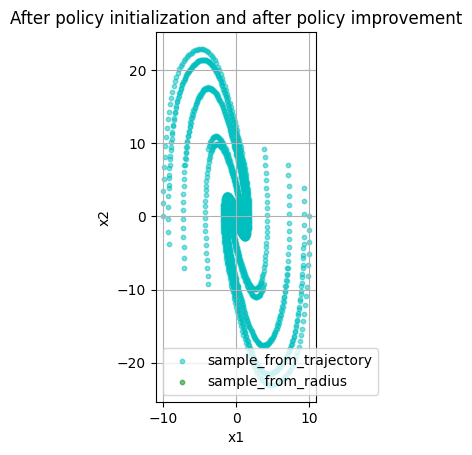

-----------------It takes 225 steps to converge.------------------


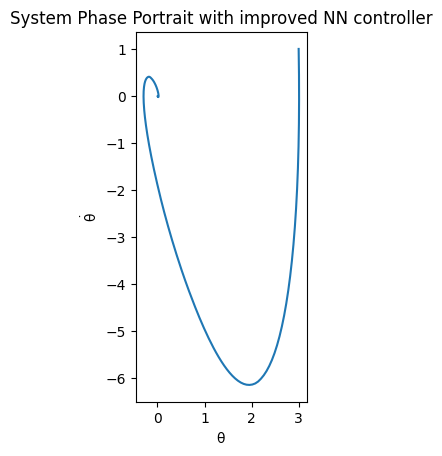

第11次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3153748512
Epoch [2000/10000], Loss: 1.1654462814
Epoch [3000/10000], Loss: 1.1139967442
Epoch [4000/10000], Loss: 1.1019577980
Epoch [5000/10000], Loss: 1.0999369621
Epoch [6000/10000], Loss: 1.0989713669
Epoch [7000/10000], Loss: 1.0982621908
Epoch [8000/10000], Loss: 1.0976626873
Epoch [9000/10000], Loss: 1.0970280170
Epoch [10000/10000], Loss: 1.0963166952


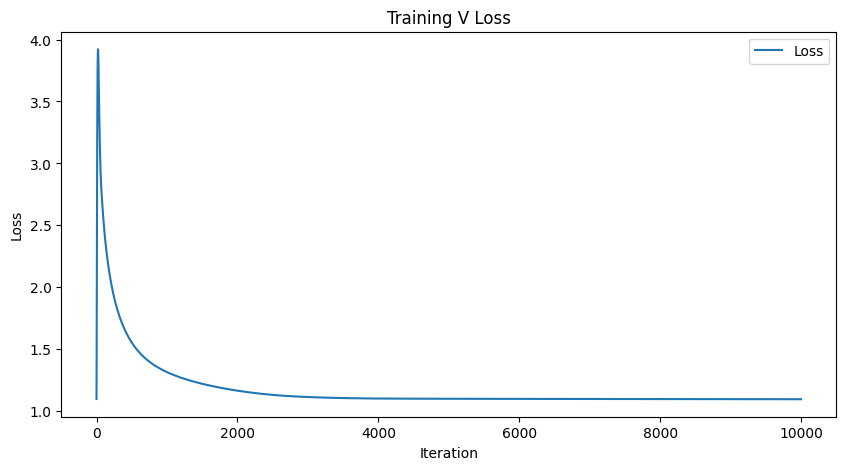

-----------------------Plotting Lyapunov-----------------------


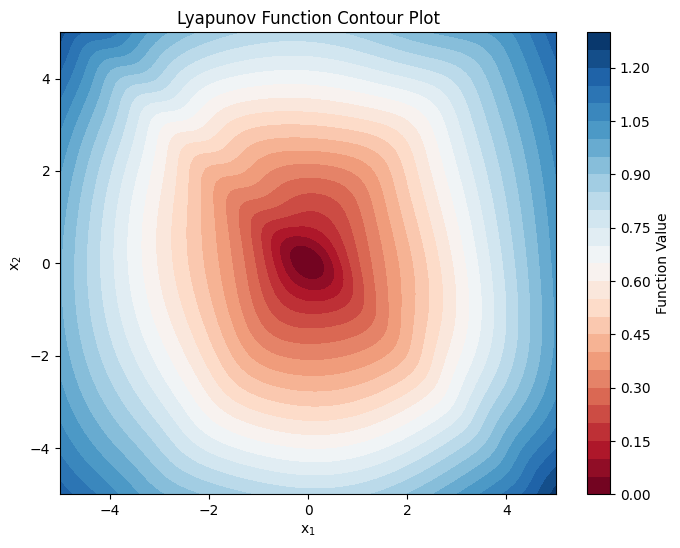

L0:tensor([0.0047], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1968.650634765625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.1399450302
Epoch [2000/10000], Loss: 2.0904288292
Epoch [3000/10000], Loss: 2.1254081726
Epoch [4000/10000], Loss: 2.1875498295
Epoch [5000/10000], Loss: 2.2850456238
Epoch [6000/10000], Loss: 2.3095836639
Epoch [7000/10000], Loss: 2.1050865650
Epoch [8000/10000], Loss: 2.3498125076
Epoch [9000/10000], Loss: 2.4208092690
Epoch [10000/10000], Loss: 2.0687351227


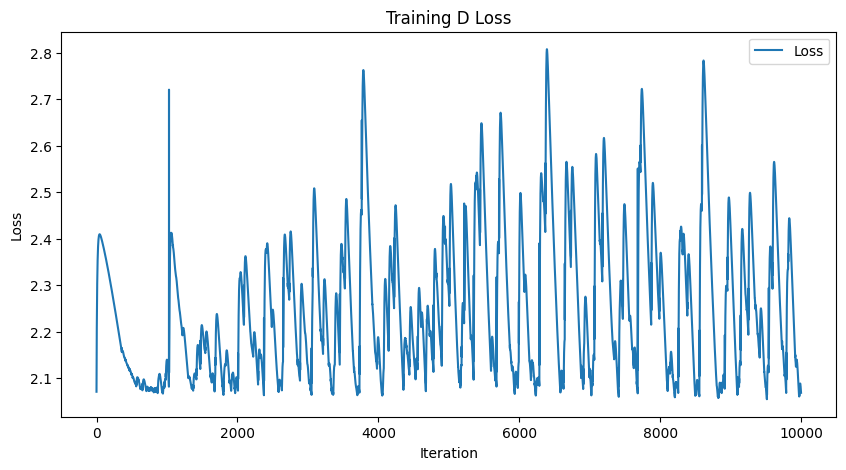

-----------------------Plotting Lyapunov-----------------------


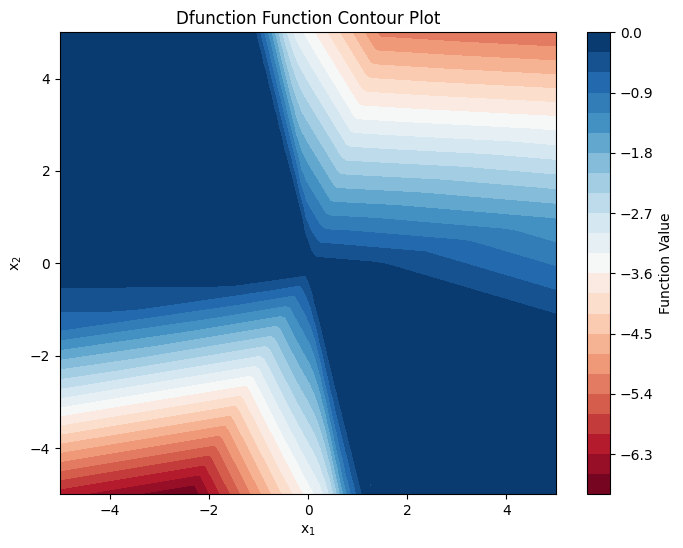

torch.sum(loss_fn(dL, DV_ext)):1.8037489652633667, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0068], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


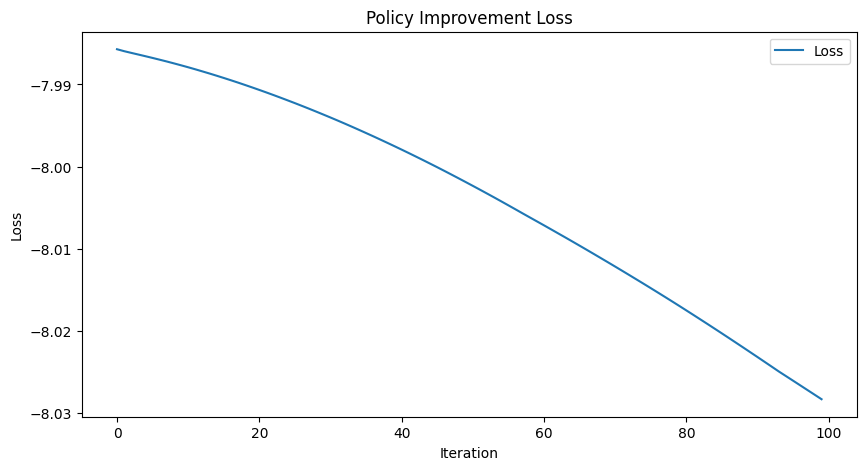

---------------------Sampling Training Data---------------------


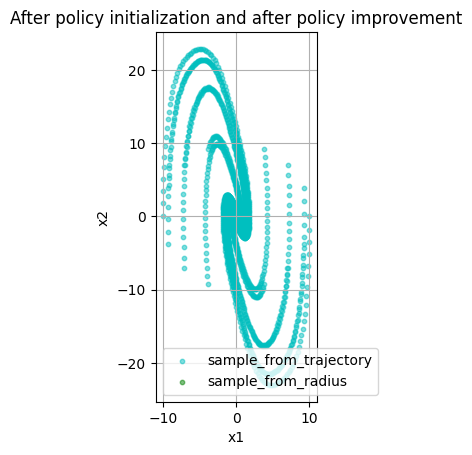

-----------------It takes 224 steps to converge.------------------


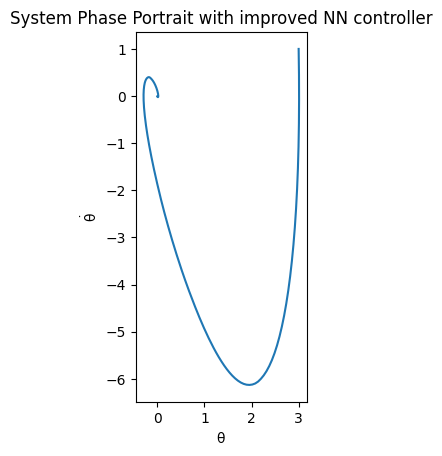

第12次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3256068230
Epoch [2000/10000], Loss: 1.1752710342
Epoch [3000/10000], Loss: 1.1119111776
Epoch [4000/10000], Loss: 1.0970908403
Epoch [5000/10000], Loss: 1.0948168039
Epoch [6000/10000], Loss: 1.0941253901
Epoch [7000/10000], Loss: 1.0936721563
Epoch [8000/10000], Loss: 1.0932409763
Epoch [9000/10000], Loss: 1.0927809477
Epoch [10000/10000], Loss: 1.0922726393


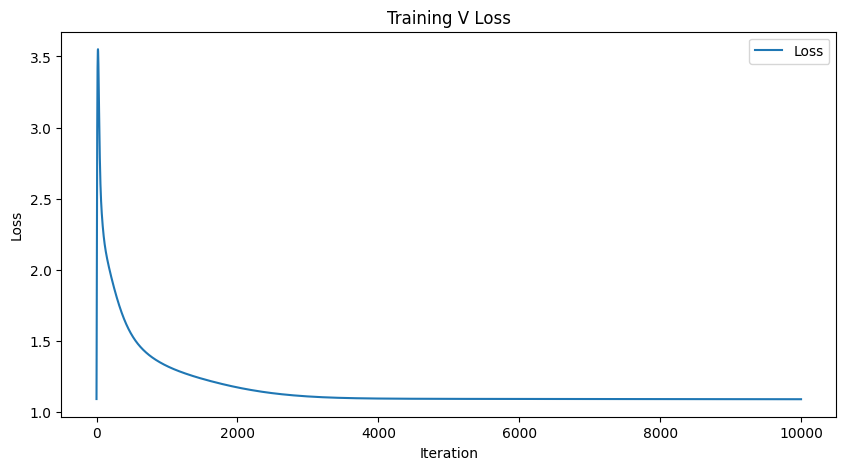

-----------------------Plotting Lyapunov-----------------------


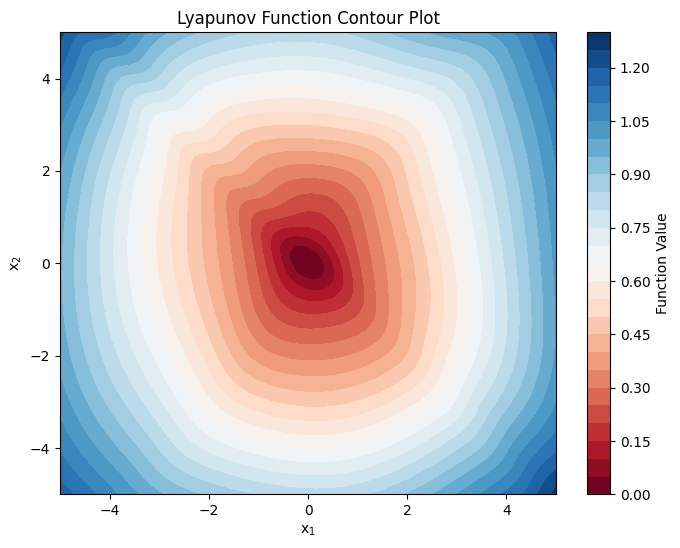

L0:tensor([0.0038], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1955.1727294921875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.0545563698
Epoch [2000/10000], Loss: 2.1435036659
Epoch [3000/10000], Loss: 2.0587790012
Epoch [4000/10000], Loss: 2.4551825523
Epoch [5000/10000], Loss: 2.2144153118
Epoch [6000/10000], Loss: 2.2120566368
Epoch [7000/10000], Loss: 2.5328123569
Epoch [8000/10000], Loss: 2.4822566509
Epoch [9000/10000], Loss: 2.1045167446
Epoch [10000/10000], Loss: 2.1958825588


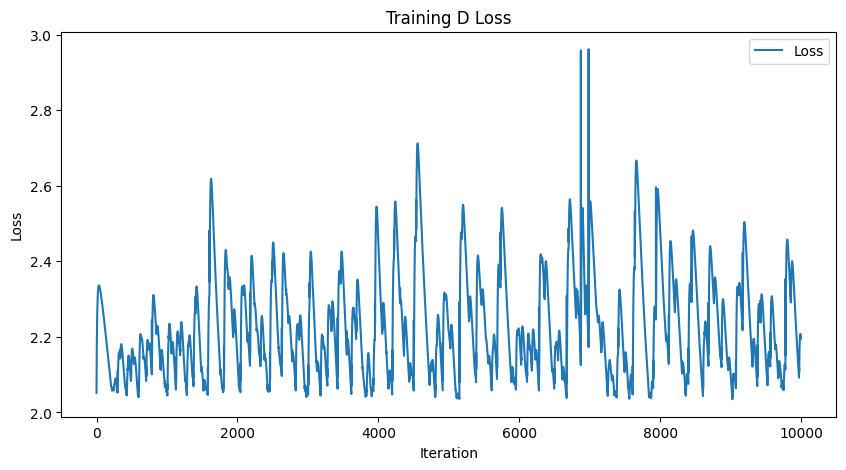

-----------------------Plotting Lyapunov-----------------------


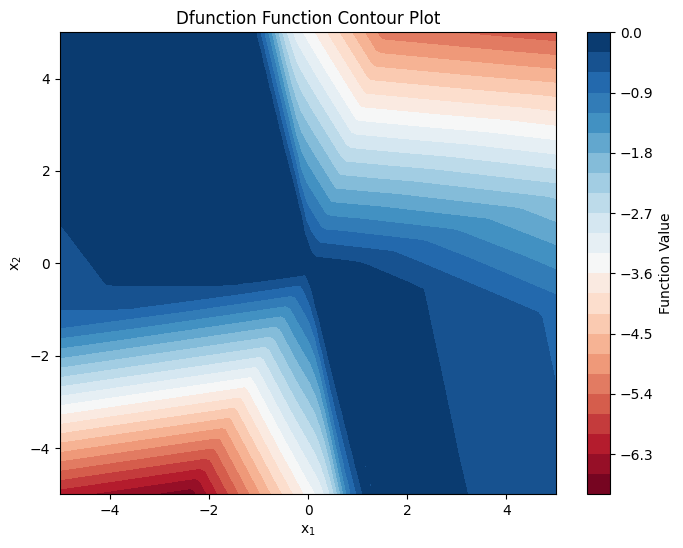

torch.sum(loss_fn(dL, DV_ext)):1.941244125366211, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0078], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


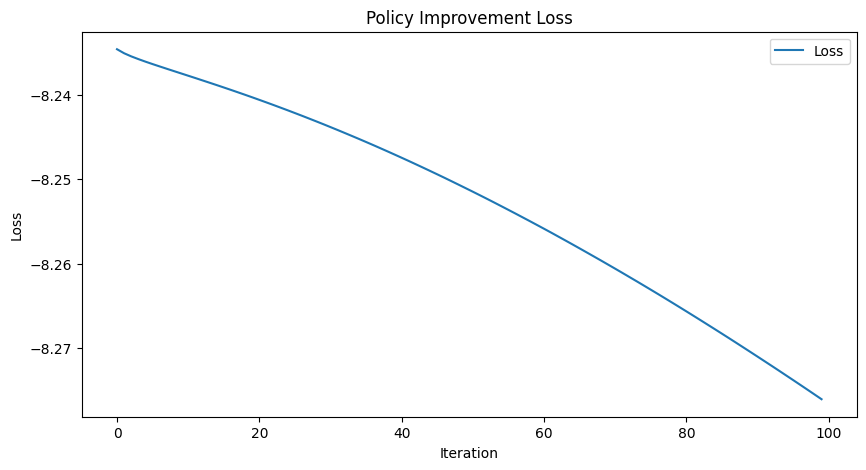

---------------------Sampling Training Data---------------------


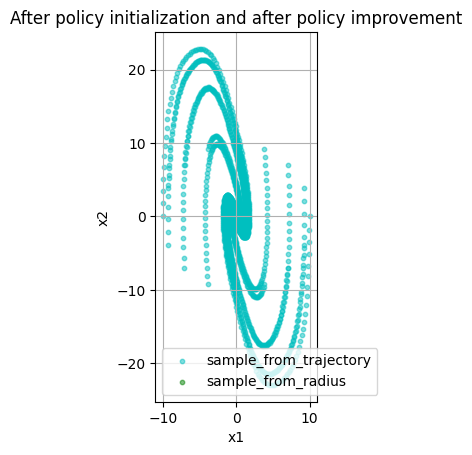

-----------------It takes 223 steps to converge.------------------


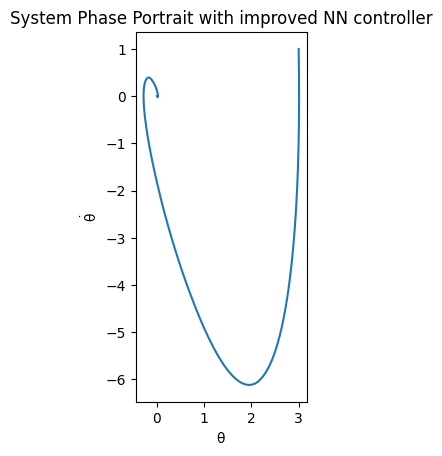

第13次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2848187685
Epoch [2000/10000], Loss: 1.1545799971
Epoch [3000/10000], Loss: 1.1037535667
Epoch [4000/10000], Loss: 1.0938752890
Epoch [5000/10000], Loss: 1.0924382210
Epoch [6000/10000], Loss: 1.0914347172
Epoch [7000/10000], Loss: 1.0905225277
Epoch [8000/10000], Loss: 1.0897318125
Epoch [9000/10000], Loss: 1.0890178680
Epoch [10000/10000], Loss: 1.0882719755


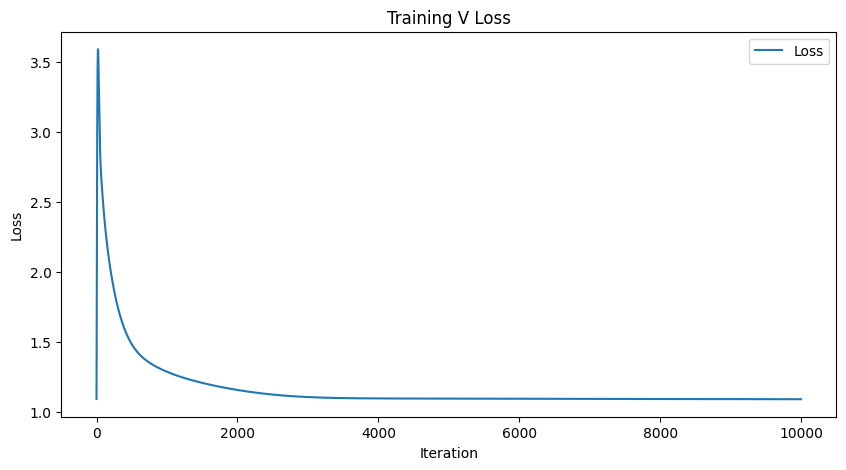

-----------------------Plotting Lyapunov-----------------------


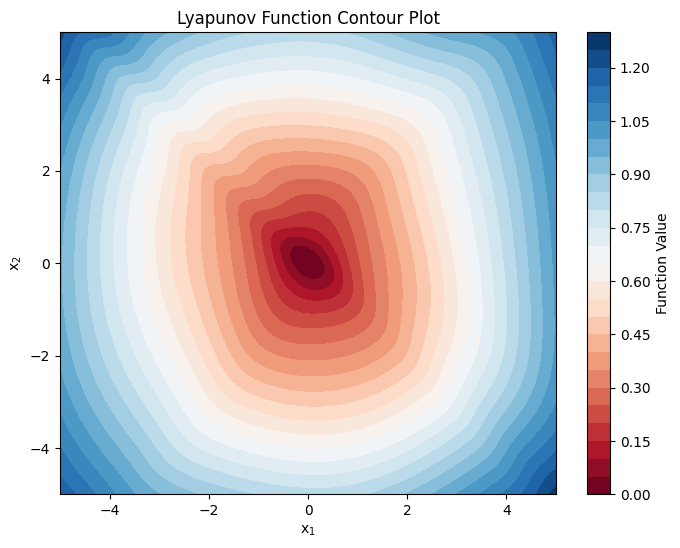

L0:tensor([0.0024], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1939.957763671875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.2374143600
Epoch [2000/10000], Loss: 2.2725210190
Epoch [3000/10000], Loss: 2.4057300091
Epoch [4000/10000], Loss: 2.0516288280
Epoch [5000/10000], Loss: 2.2795138359
Epoch [6000/10000], Loss: 2.1674356461
Epoch [7000/10000], Loss: 2.1527073383
Epoch [8000/10000], Loss: 2.0786371231
Epoch [9000/10000], Loss: 2.1082797050
Epoch [10000/10000], Loss: 2.3082211018


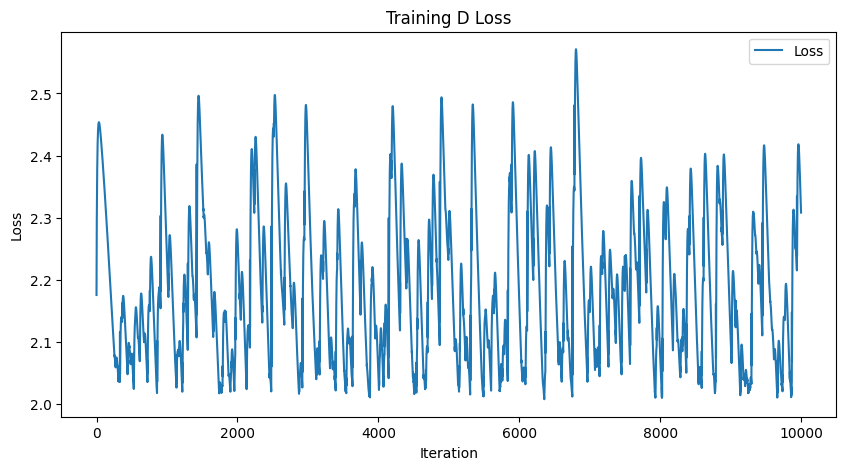

-----------------------Plotting Lyapunov-----------------------


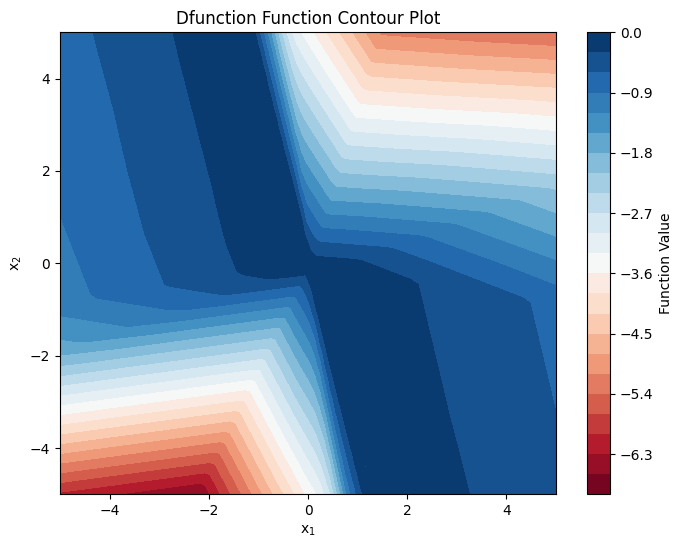

torch.sum(loss_fn(dL, DV_ext)):2.0624008178710938, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0096], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


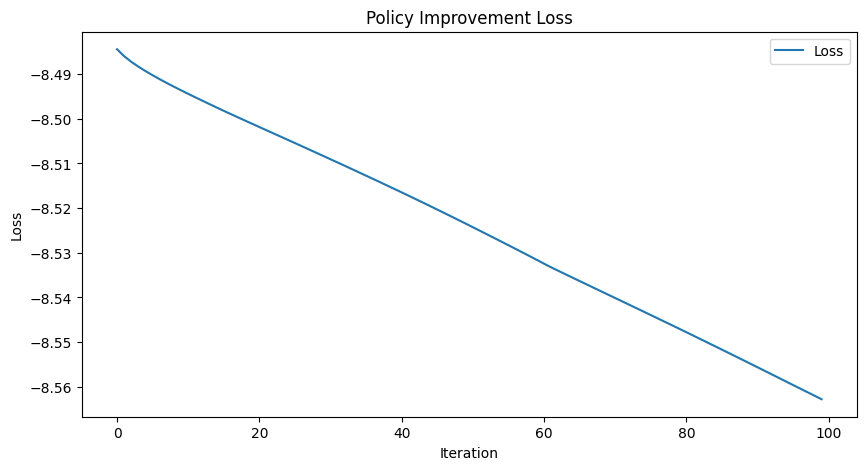

---------------------Sampling Training Data---------------------


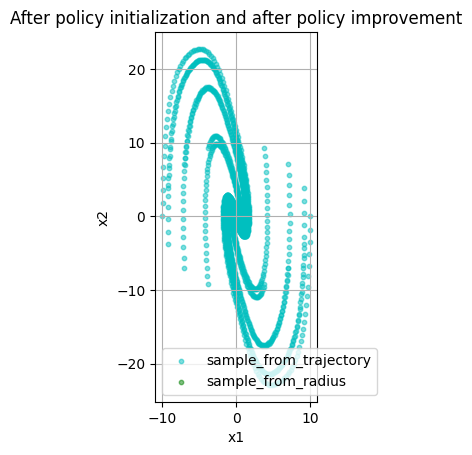

-----------------It takes 222 steps to converge.------------------


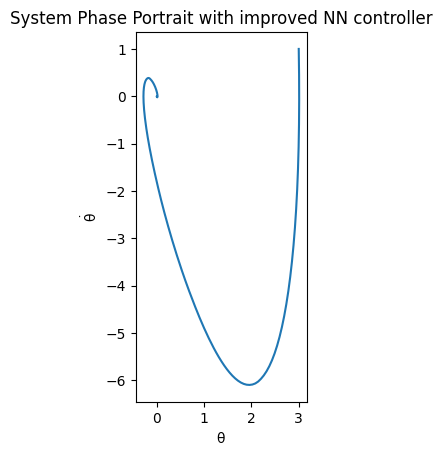

第14次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.3116793633
Epoch [2000/10000], Loss: 1.1558424234
Epoch [3000/10000], Loss: 1.0976742506
Epoch [4000/10000], Loss: 1.0867103338
Epoch [5000/10000], Loss: 1.0846077204
Epoch [6000/10000], Loss: 1.0838449001
Epoch [7000/10000], Loss: 1.0834401846
Epoch [8000/10000], Loss: 1.0831724405
Epoch [9000/10000], Loss: 1.0828387737
Epoch [10000/10000], Loss: 1.0823729038


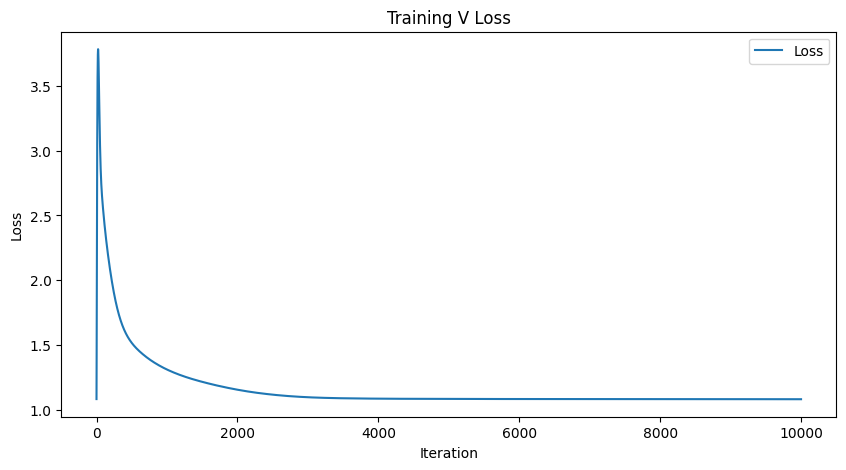

-----------------------Plotting Lyapunov-----------------------


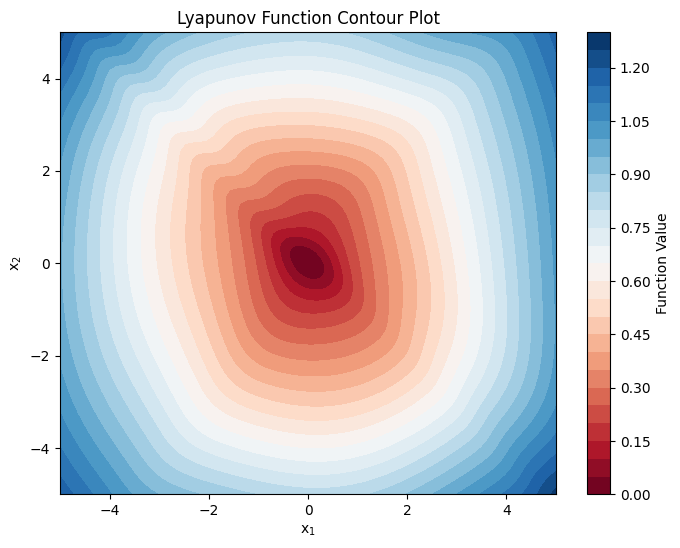

L0:tensor([0.0016], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1920.9072265625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.1334722042
Epoch [2000/10000], Loss: 2.0151414871
Epoch [3000/10000], Loss: 2.1409757137
Epoch [4000/10000], Loss: 2.1509761810
Epoch [5000/10000], Loss: 2.2027142048
Epoch [6000/10000], Loss: 2.1653809547
Epoch [7000/10000], Loss: 2.1815814972
Epoch [8000/10000], Loss: 2.1594119072
Epoch [9000/10000], Loss: 2.3409104347
Epoch [10000/10000], Loss: 2.1825928688


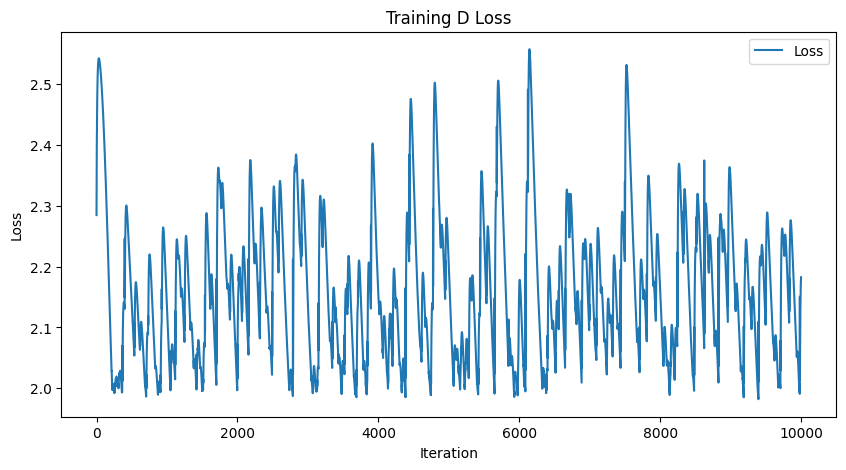

-----------------------Plotting Lyapunov-----------------------


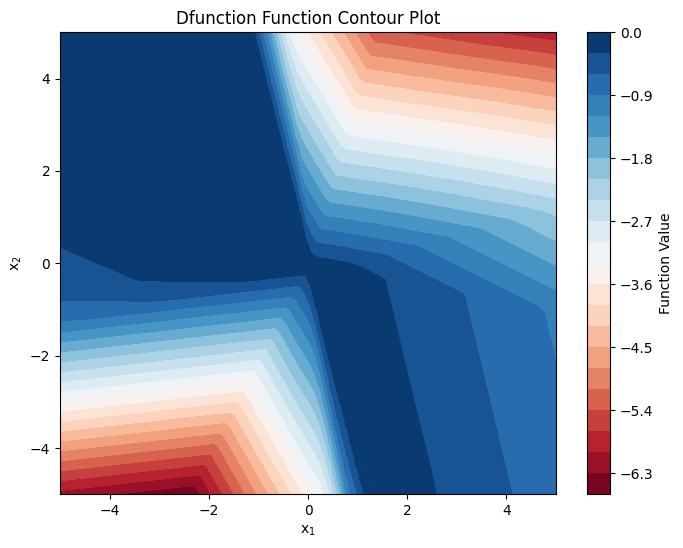

torch.sum(loss_fn(dL, DV_ext)):1.9463708400726318, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0133], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


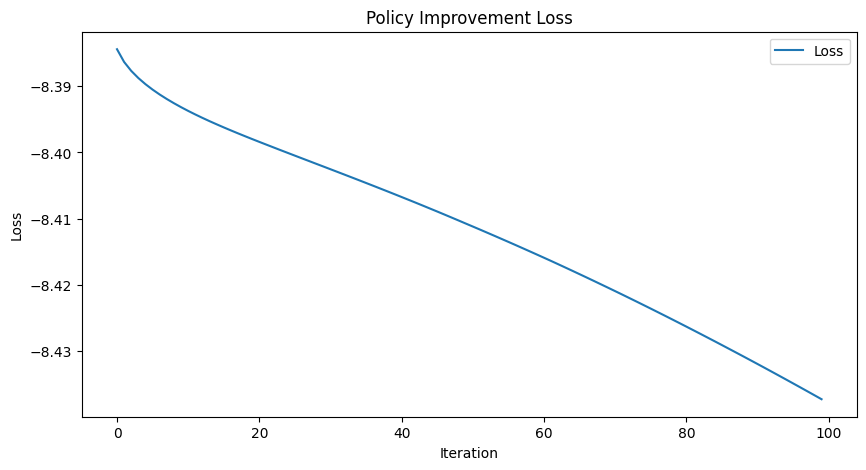

---------------------Sampling Training Data---------------------


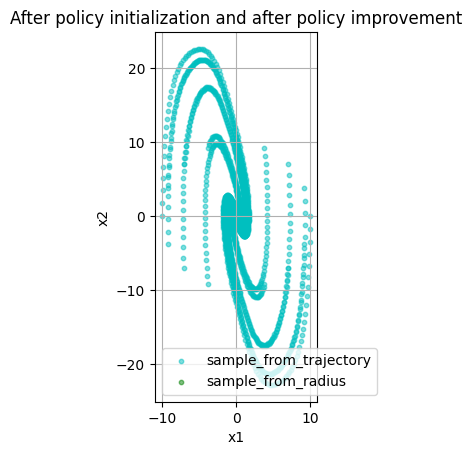

-----------------It takes 221 steps to converge.------------------


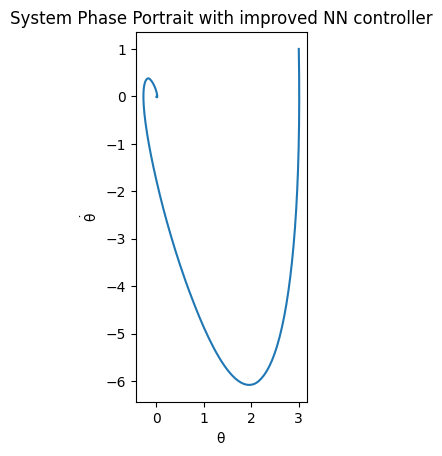

第15次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2976222038
Epoch [2000/10000], Loss: 1.1419830322
Epoch [3000/10000], Loss: 1.0924501419
Epoch [4000/10000], Loss: 1.0820430517
Epoch [5000/10000], Loss: 1.0802633762
Epoch [6000/10000], Loss: 1.0796128511
Epoch [7000/10000], Loss: 1.0792535543
Epoch [8000/10000], Loss: 1.0790132284
Epoch [9000/10000], Loss: 1.0787326097
Epoch [10000/10000], Loss: 1.0783631802


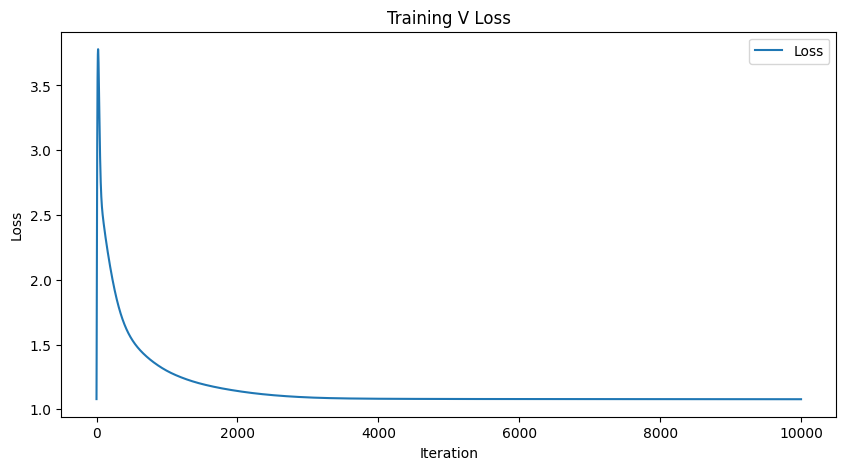

-----------------------Plotting Lyapunov-----------------------


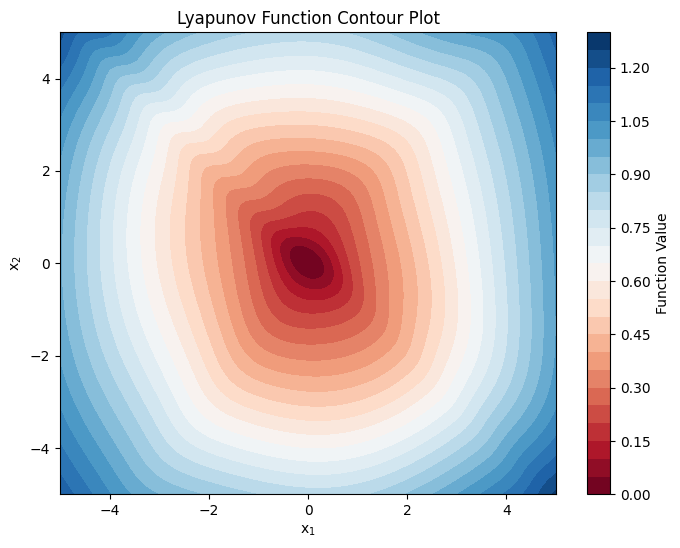

L0:tensor([0.0010], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1908.718994140625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.2189168930
Epoch [2000/10000], Loss: 2.0397729874
Epoch [3000/10000], Loss: 2.1111650467
Epoch [4000/10000], Loss: 2.0104672909
Epoch [5000/10000], Loss: 2.2589447498
Epoch [6000/10000], Loss: 2.2977676392
Epoch [7000/10000], Loss: 2.0855715275
Epoch [8000/10000], Loss: 2.0366010666
Epoch [9000/10000], Loss: 2.1936328411
Epoch [10000/10000], Loss: 2.0845732689


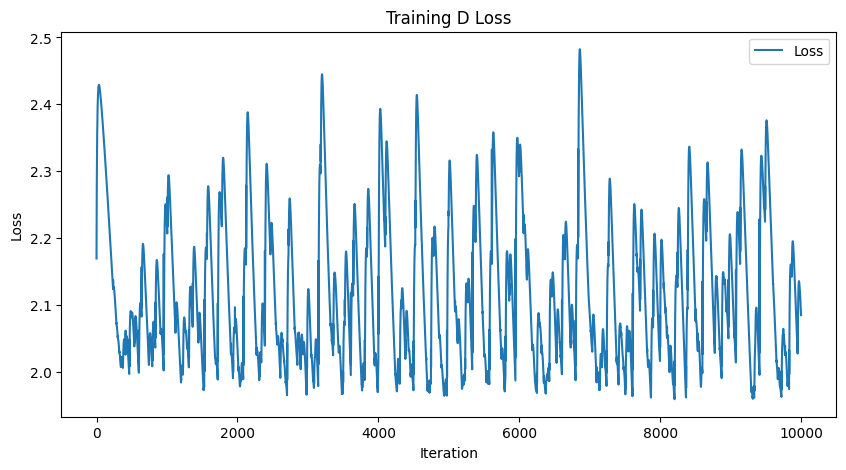

-----------------------Plotting Lyapunov-----------------------


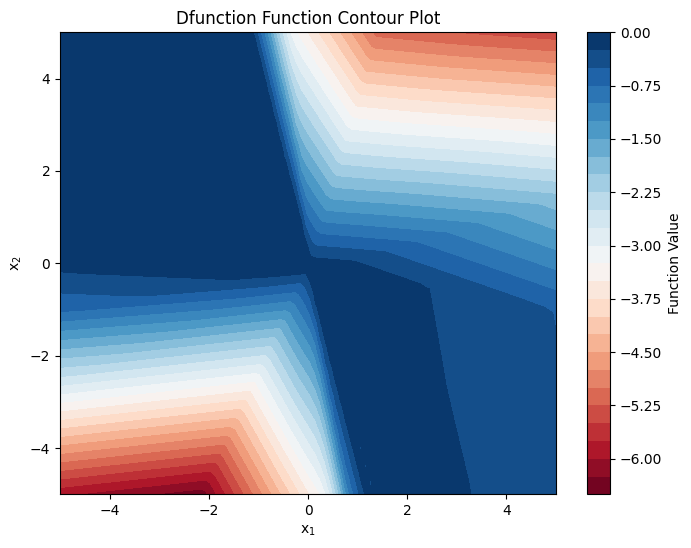

torch.sum(loss_fn(dL, DV_ext)):1.859127402305603, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0103], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


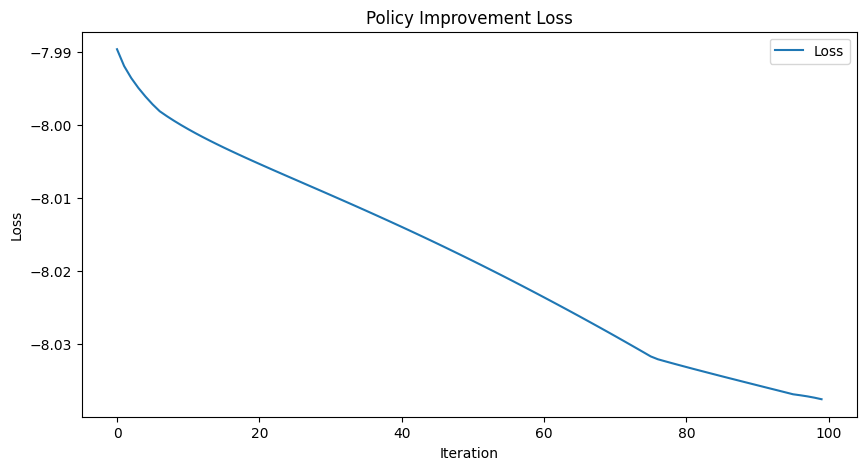

---------------------Sampling Training Data---------------------


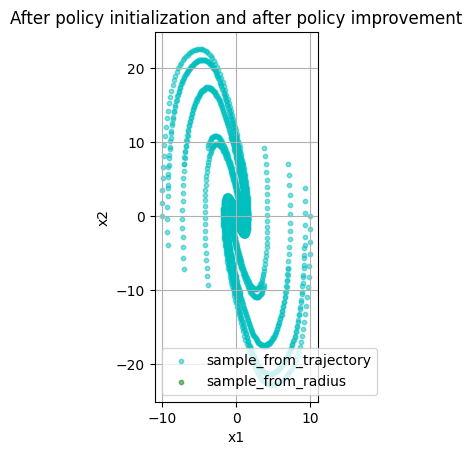

-----------------It takes 219 steps to converge.------------------


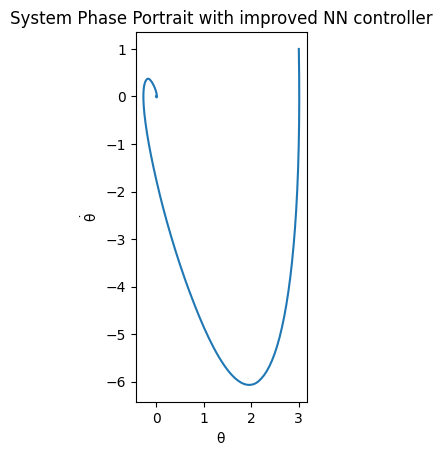

第16次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2836433649
Epoch [2000/10000], Loss: 1.1351588964
Epoch [3000/10000], Loss: 1.0888051987
Epoch [4000/10000], Loss: 1.0783916712
Epoch [5000/10000], Loss: 1.0765362978
Epoch [6000/10000], Loss: 1.0758924484
Epoch [7000/10000], Loss: 1.0755702257
Epoch [8000/10000], Loss: 1.0753300190
Epoch [9000/10000], Loss: 1.0750780106
Epoch [10000/10000], Loss: 1.0747470856


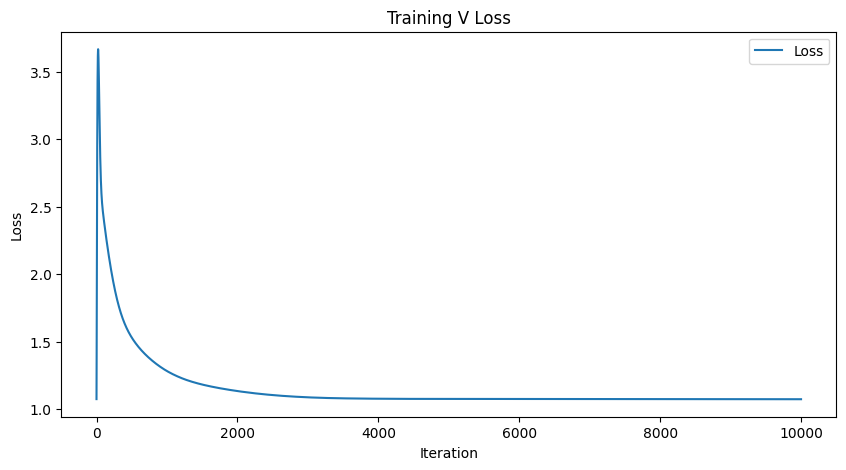

-----------------------Plotting Lyapunov-----------------------


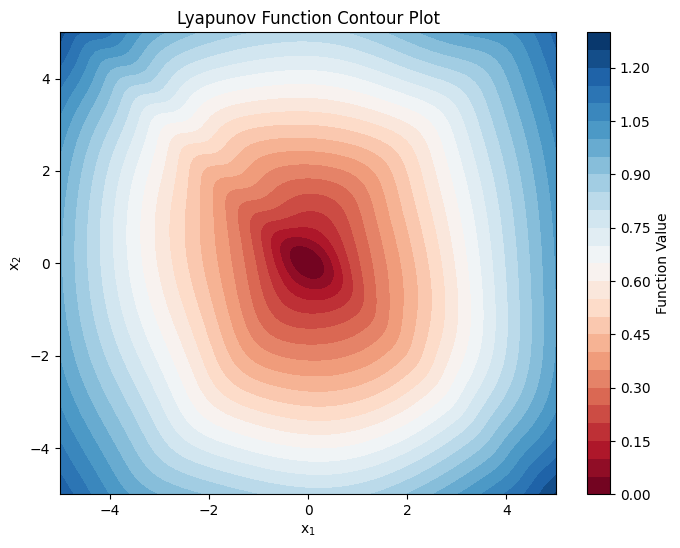

L0:tensor([0.0006], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1897.1845703125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 2.0484361649
Epoch [2000/10000], Loss: 2.0167808533
Epoch [3000/10000], Loss: 2.1448719501
Epoch [4000/10000], Loss: 2.0084466934
Epoch [5000/10000], Loss: 1.9994704723
Epoch [6000/10000], Loss: 2.0342414379
Epoch [7000/10000], Loss: 2.1163370609
Epoch [8000/10000], Loss: 1.9571410418
Epoch [9000/10000], Loss: 1.9668107033
Epoch [10000/10000], Loss: 1.9862993956


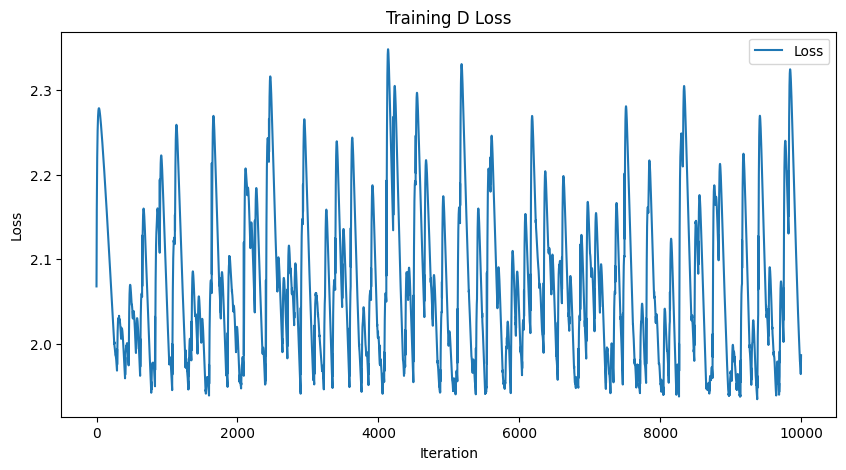

-----------------------Plotting Lyapunov-----------------------


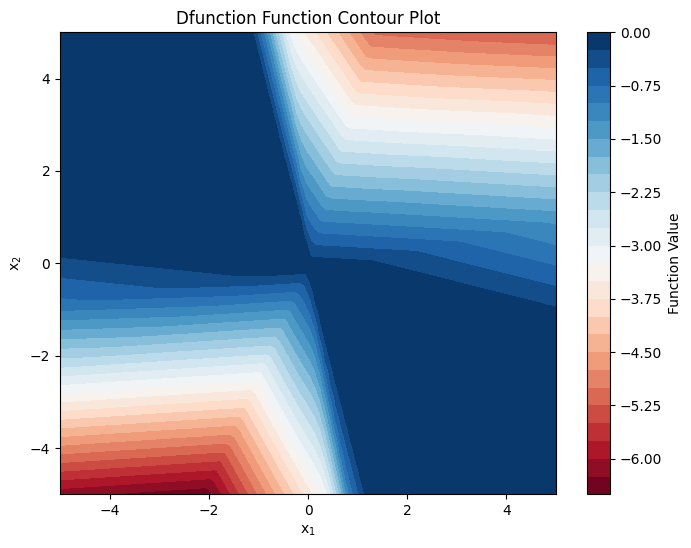

torch.sum(loss_fn(dL, DV_ext)):1.77165687084198, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0098], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


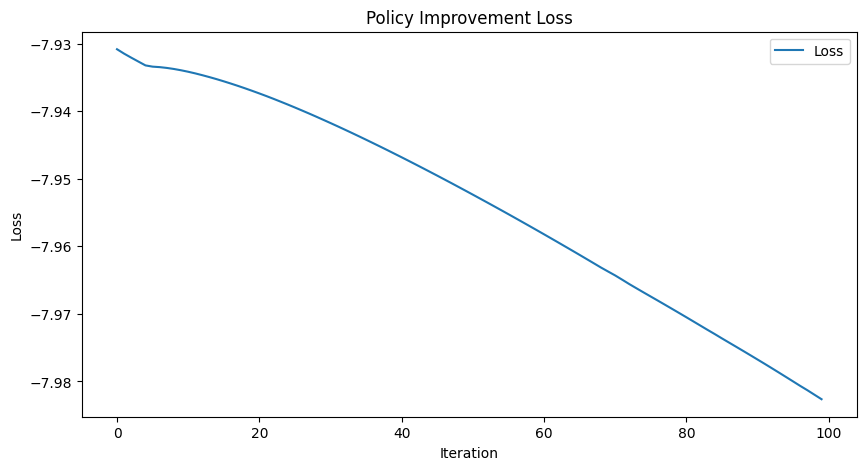

---------------------Sampling Training Data---------------------


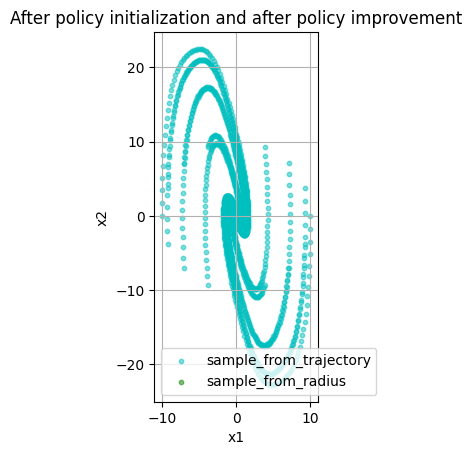

-----------------It takes 218 steps to converge.------------------


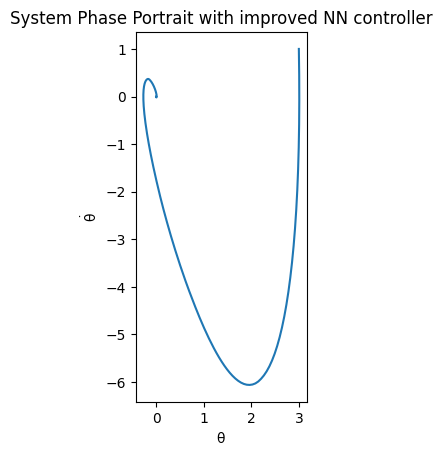

第17次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2966884375
Epoch [2000/10000], Loss: 1.1283165216
Epoch [3000/10000], Loss: 1.0850921869
Epoch [4000/10000], Loss: 1.0753138065
Epoch [5000/10000], Loss: 1.0733640194
Epoch [6000/10000], Loss: 1.0726654530
Epoch [7000/10000], Loss: 1.0722817183
Epoch [8000/10000], Loss: 1.0719887018
Epoch [9000/10000], Loss: 1.0716979504
Epoch [10000/10000], Loss: 1.0713843107


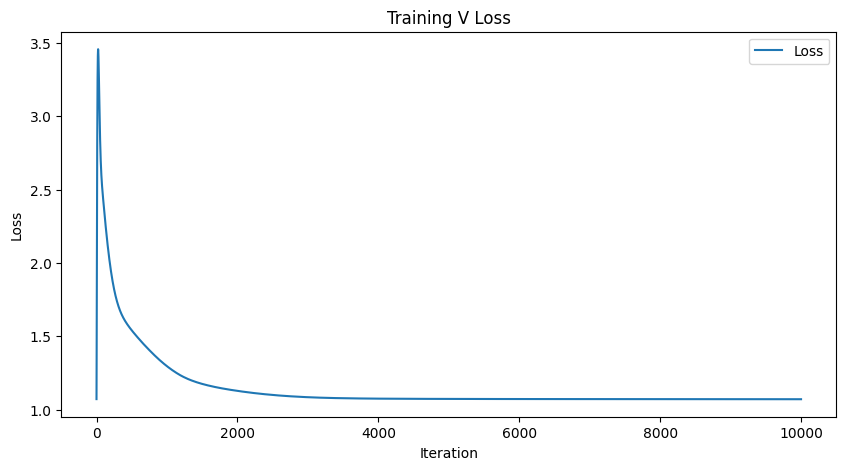

-----------------------Plotting Lyapunov-----------------------


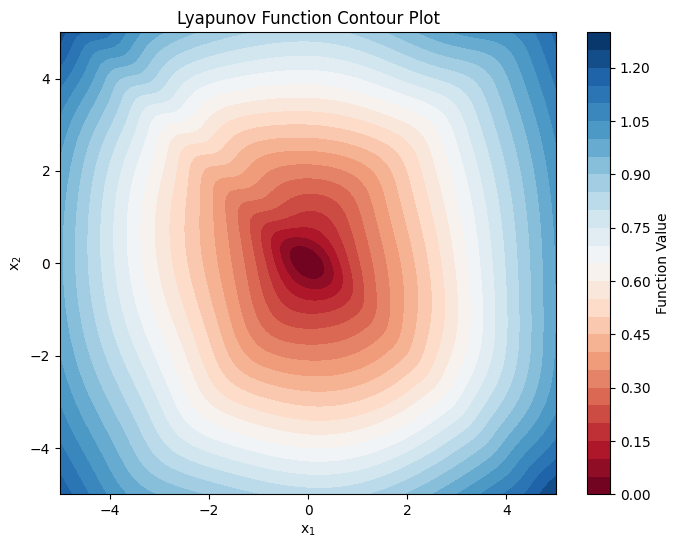

L0:tensor([0.0006], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1884.0567626953125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.9570752382
Epoch [2000/10000], Loss: 2.0239572525
Epoch [3000/10000], Loss: 1.9318157434
Epoch [4000/10000], Loss: 2.2791278362
Epoch [5000/10000], Loss: 1.9517827034
Epoch [6000/10000], Loss: 2.0079357624
Epoch [7000/10000], Loss: 2.0003960133
Epoch [8000/10000], Loss: 2.0017778873
Epoch [9000/10000], Loss: 2.0303478241
Epoch [10000/10000], Loss: 2.0797579288


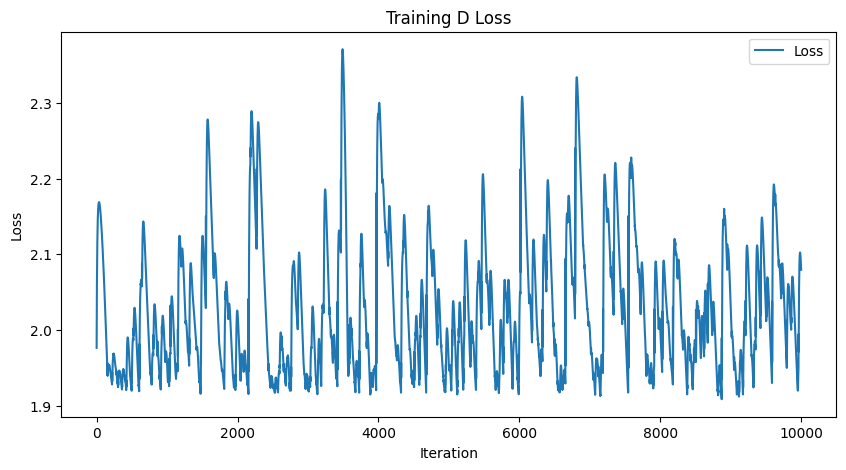

-----------------------Plotting Lyapunov-----------------------


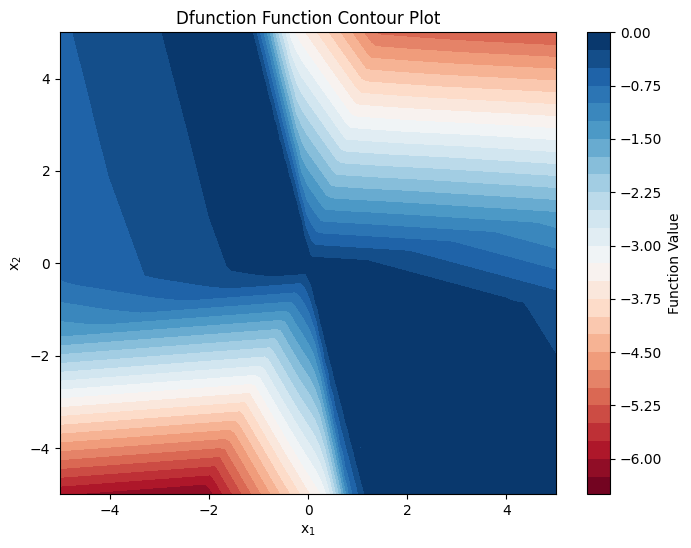

torch.sum(loss_fn(dL, DV_ext)):1.8751951456069946, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0134], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


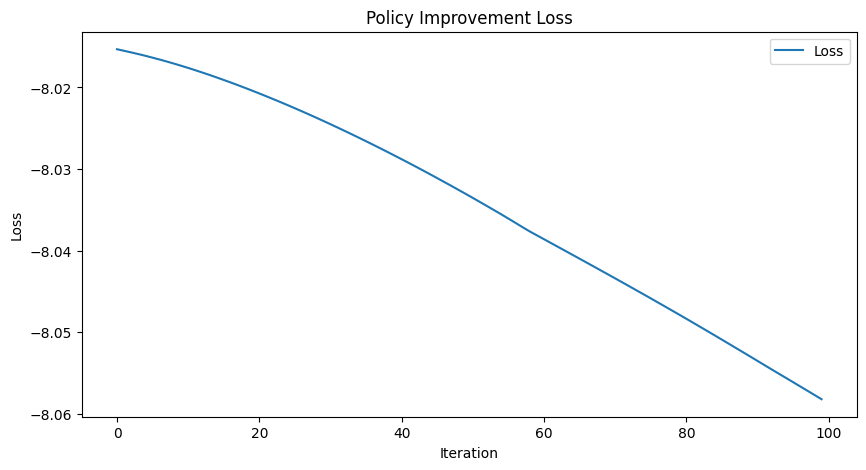

---------------------Sampling Training Data---------------------


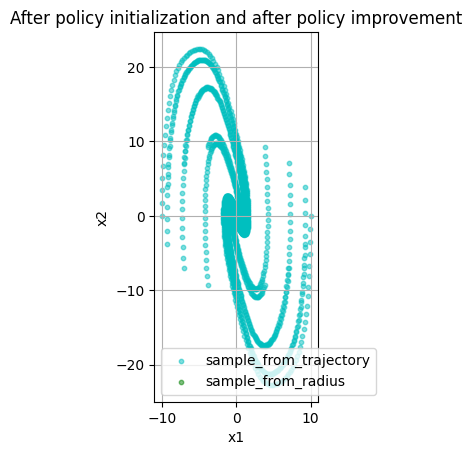

-----------------It takes 217 steps to converge.------------------


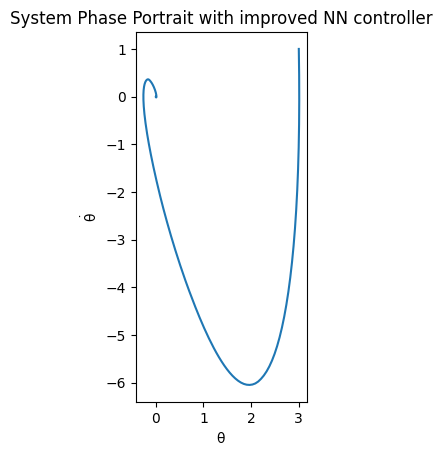

第18次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2727924585
Epoch [2000/10000], Loss: 1.1255028248
Epoch [3000/10000], Loss: 1.0817682743
Epoch [4000/10000], Loss: 1.0725486279
Epoch [5000/10000], Loss: 1.0705994368
Epoch [6000/10000], Loss: 1.0697464943
Epoch [7000/10000], Loss: 1.0693901777
Epoch [8000/10000], Loss: 1.0691239834
Epoch [9000/10000], Loss: 1.0688655376
Epoch [10000/10000], Loss: 1.0685658455


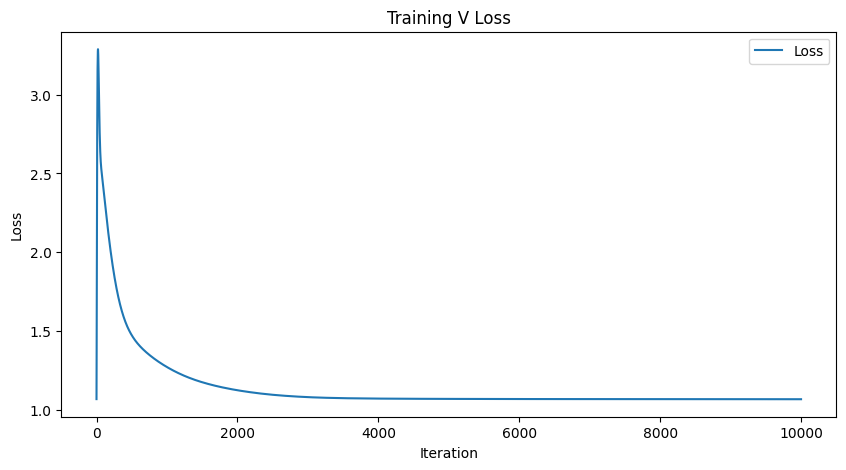

-----------------------Plotting Lyapunov-----------------------


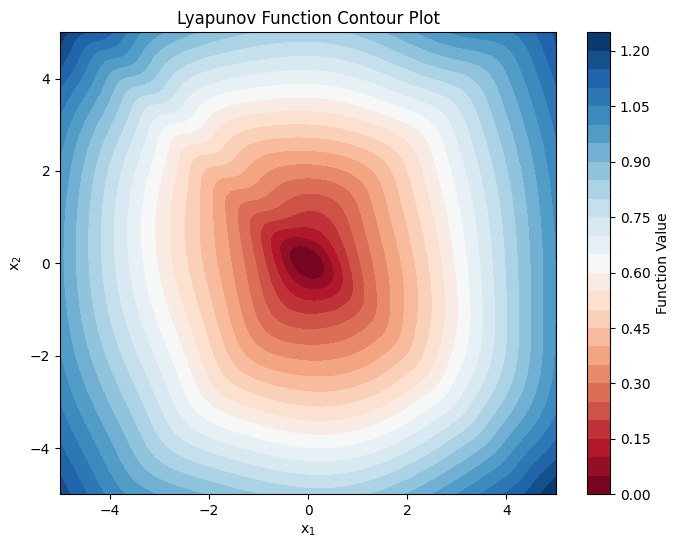

L0:tensor([-2.0266e-05], grad_fn=<SelectBackward0>), PD:0.06423687934875488, torch.sum(F.relu(dL)):1873.5941162109375
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.9357538223
Epoch [2000/10000], Loss: 2.0023860931
Epoch [3000/10000], Loss: 2.0934681892
Epoch [4000/10000], Loss: 2.0257318020
Epoch [5000/10000], Loss: 1.9181160927
Epoch [6000/10000], Loss: 2.1994345188
Epoch [7000/10000], Loss: 1.9785703421
Epoch [8000/10000], Loss: 2.0570516586
Epoch [9000/10000], Loss: 2.0812170506
Epoch [10000/10000], Loss: 1.9511933327


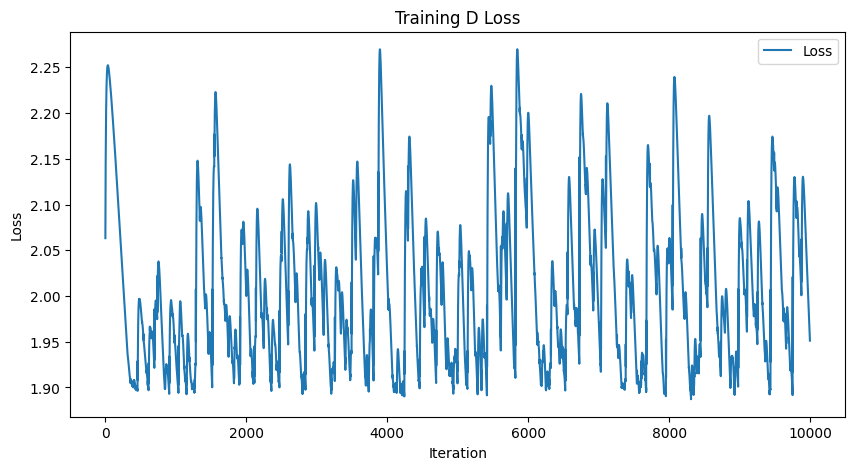

-----------------------Plotting Lyapunov-----------------------


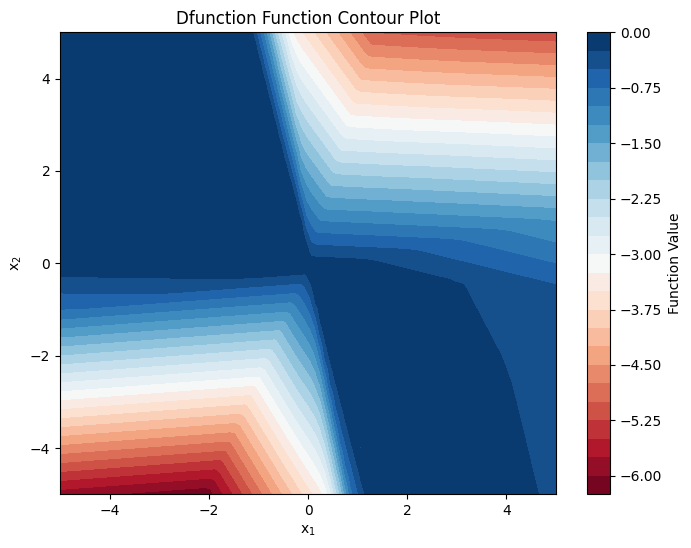

torch.sum(loss_fn(dL, DV_ext)):1.7560738325119019, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0113], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


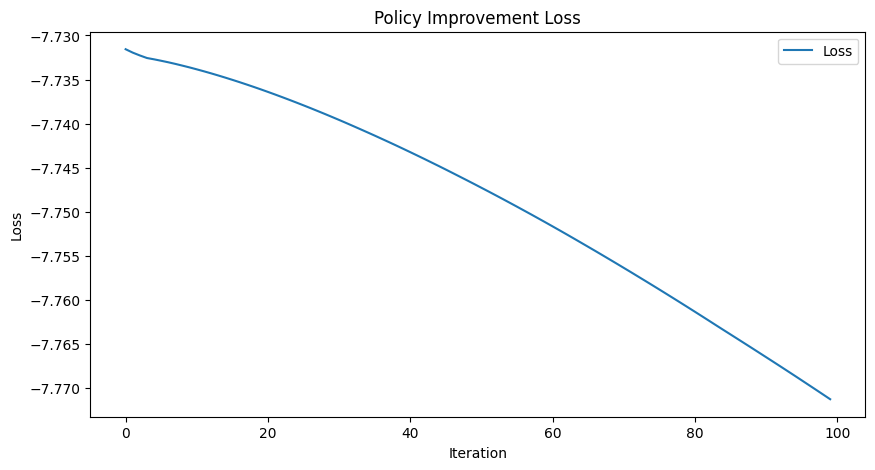

---------------------Sampling Training Data---------------------


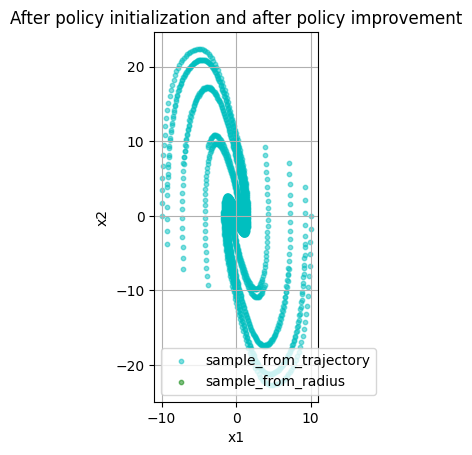

-----------------It takes 215 steps to converge.------------------


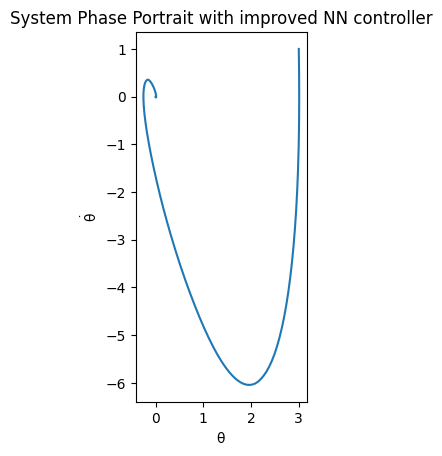

第19次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2594232559
Epoch [2000/10000], Loss: 1.1217142344
Epoch [3000/10000], Loss: 1.0792127848
Epoch [4000/10000], Loss: 1.0694680214
Epoch [5000/10000], Loss: 1.0677276850
Epoch [6000/10000], Loss: 1.0669716597
Epoch [7000/10000], Loss: 1.0666407347
Epoch [8000/10000], Loss: 1.0664247274
Epoch [9000/10000], Loss: 1.0661898851
Epoch [10000/10000], Loss: 1.0659414530


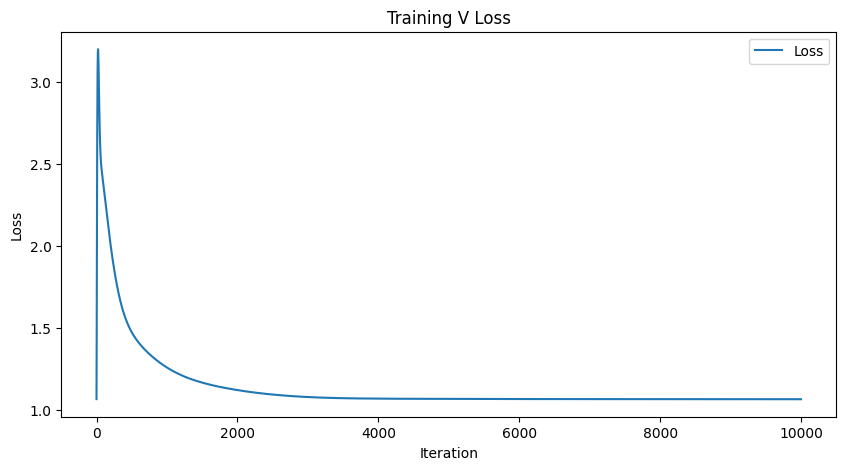

-----------------------Plotting Lyapunov-----------------------


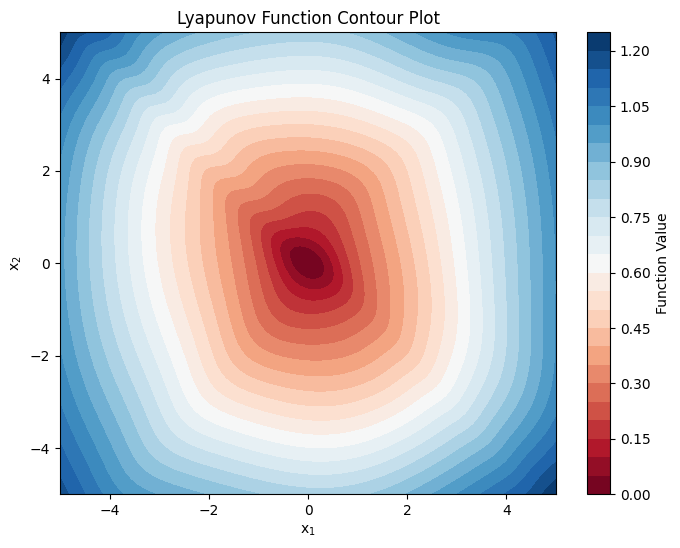

L0:tensor([-0.0002], grad_fn=<SelectBackward0>), PD:0.10182905197143555, torch.sum(F.relu(dL)):1864.1092529296875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.8749153614
Epoch [2000/10000], Loss: 2.0058588982
Epoch [3000/10000], Loss: 2.0672399998
Epoch [4000/10000], Loss: 2.1211910248
Epoch [5000/10000], Loss: 1.8929569721
Epoch [6000/10000], Loss: 1.9179955721
Epoch [7000/10000], Loss: 1.9271173477
Epoch [8000/10000], Loss: 1.9246292114
Epoch [9000/10000], Loss: 2.0065822601
Epoch [10000/10000], Loss: 1.9199757576


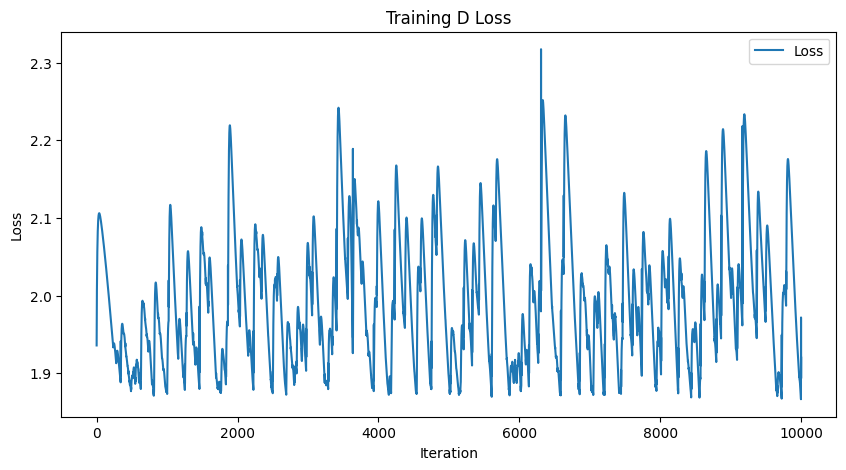

-----------------------Plotting Lyapunov-----------------------


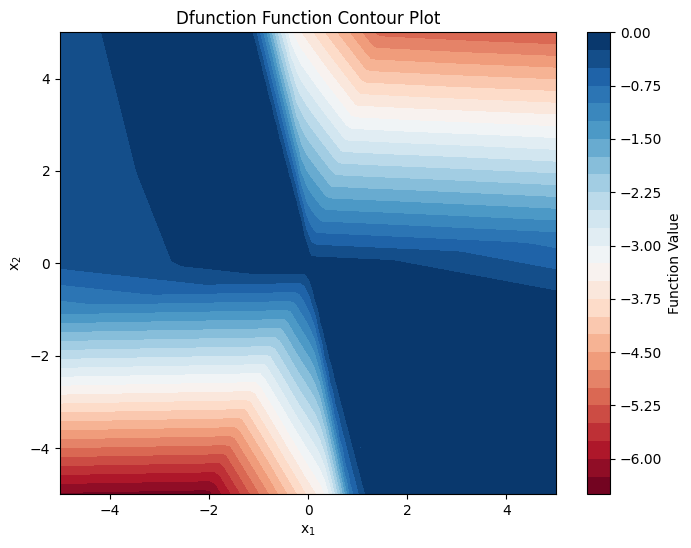

torch.sum(loss_fn(dL, DV_ext)):1.7314683198928833, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0122], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


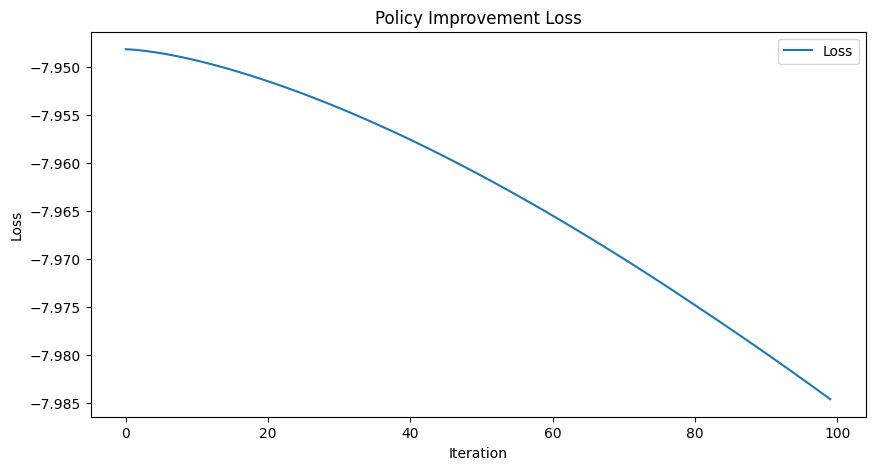

---------------------Sampling Training Data---------------------


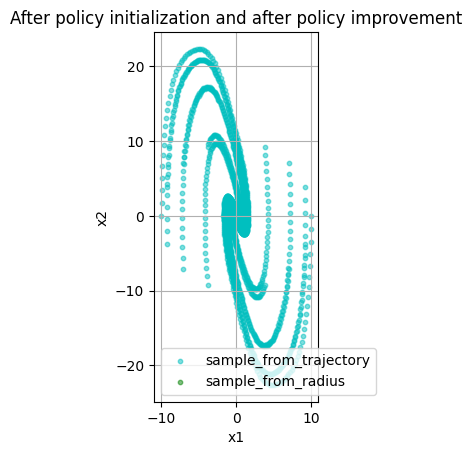

-----------------It takes 214 steps to converge.------------------


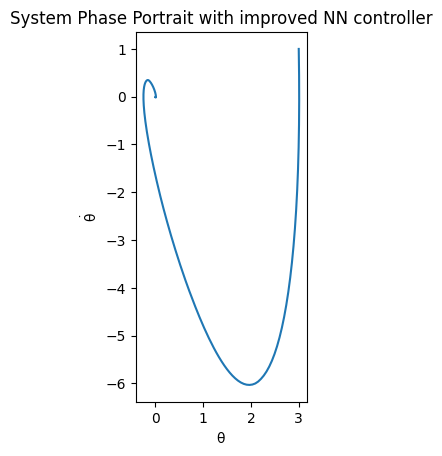

第20次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2420941591
Epoch [2000/10000], Loss: 1.1203284264
Epoch [3000/10000], Loss: 1.0777900219
Epoch [4000/10000], Loss: 1.0670142174
Epoch [5000/10000], Loss: 1.0651258230
Epoch [6000/10000], Loss: 1.0643719435
Epoch [7000/10000], Loss: 1.0640385151
Epoch [8000/10000], Loss: 1.0638344288
Epoch [9000/10000], Loss: 1.0636320114
Epoch [10000/10000], Loss: 1.0633754730


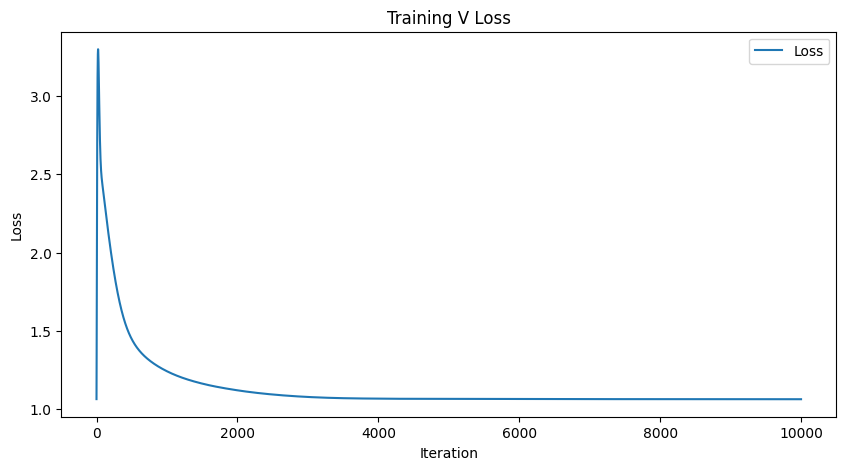

-----------------------Plotting Lyapunov-----------------------


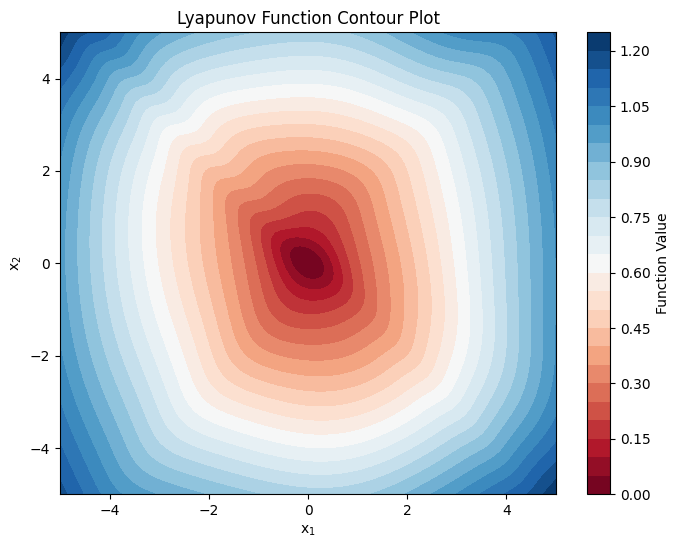

L0:tensor([0.0004], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1854.2193603515625
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.8956686258
Epoch [2000/10000], Loss: 1.8949280977
Epoch [3000/10000], Loss: 1.9958461523
Epoch [4000/10000], Loss: 1.8656182289
Epoch [5000/10000], Loss: 1.9510529041
Epoch [6000/10000], Loss: 1.9472727776
Epoch [7000/10000], Loss: 1.9997905493
Epoch [8000/10000], Loss: 2.0591158867
Epoch [9000/10000], Loss: 2.0707418919
Epoch [10000/10000], Loss: 2.0347917080


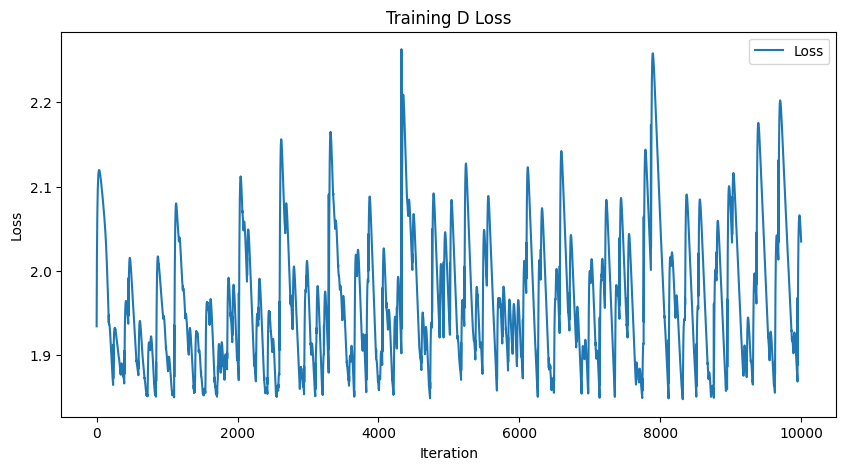

-----------------------Plotting Lyapunov-----------------------


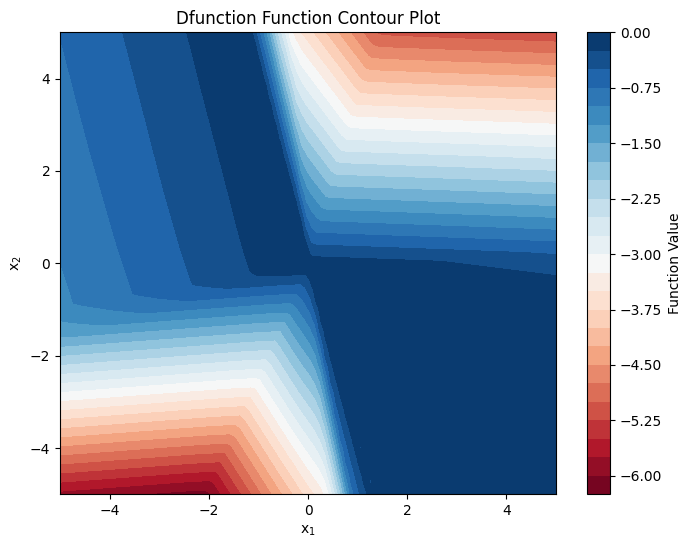

torch.sum(loss_fn(dL, DV_ext)):1.8539894819259644, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0137], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


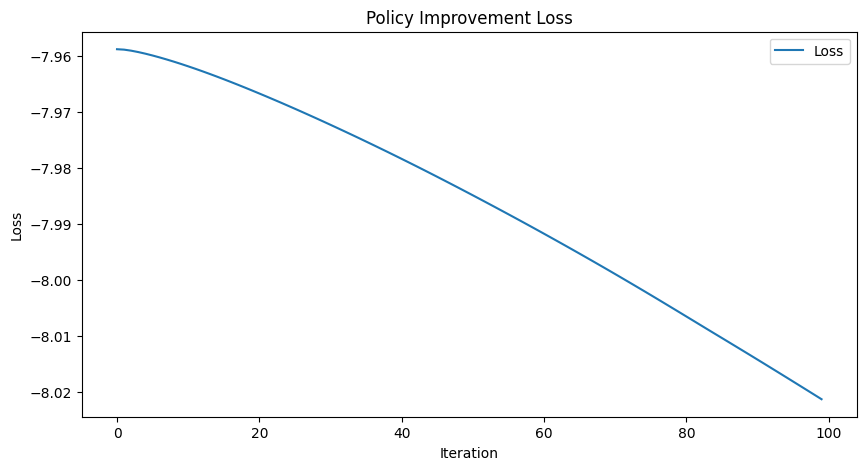

---------------------Sampling Training Data---------------------


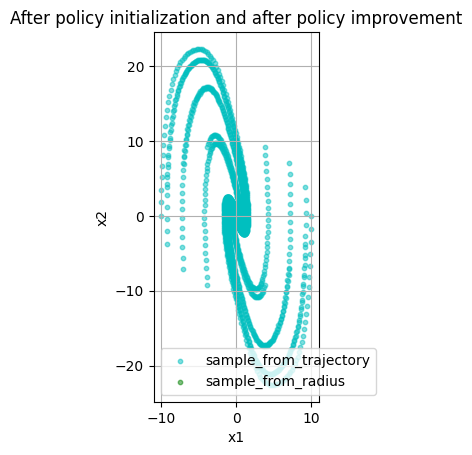

-----------------It takes 211 steps to converge.------------------


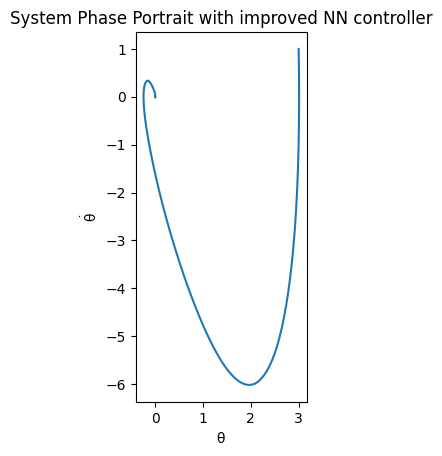

第21次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2286275625
Epoch [2000/10000], Loss: 1.1180480719
Epoch [3000/10000], Loss: 1.0747772455
Epoch [4000/10000], Loss: 1.0635155439
Epoch [5000/10000], Loss: 1.0616605282
Epoch [6000/10000], Loss: 1.0609678030
Epoch [7000/10000], Loss: 1.0606933832
Epoch [8000/10000], Loss: 1.0604987144
Epoch [9000/10000], Loss: 1.0602953434
Epoch [10000/10000], Loss: 1.0600637197


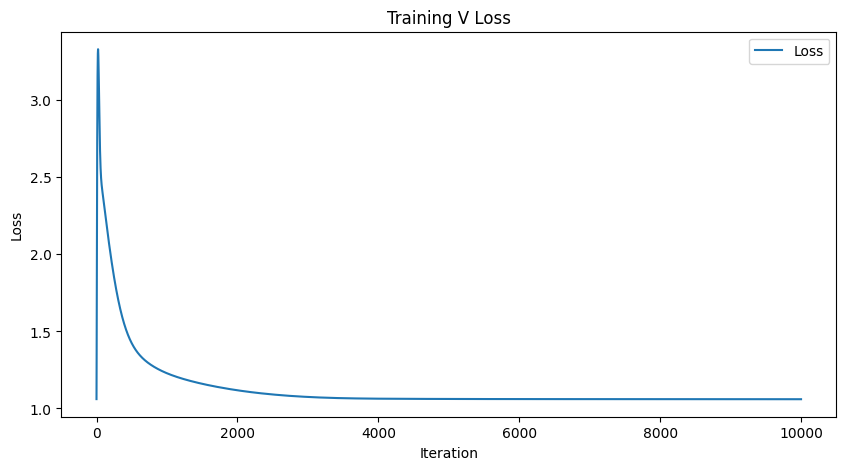

-----------------------Plotting Lyapunov-----------------------


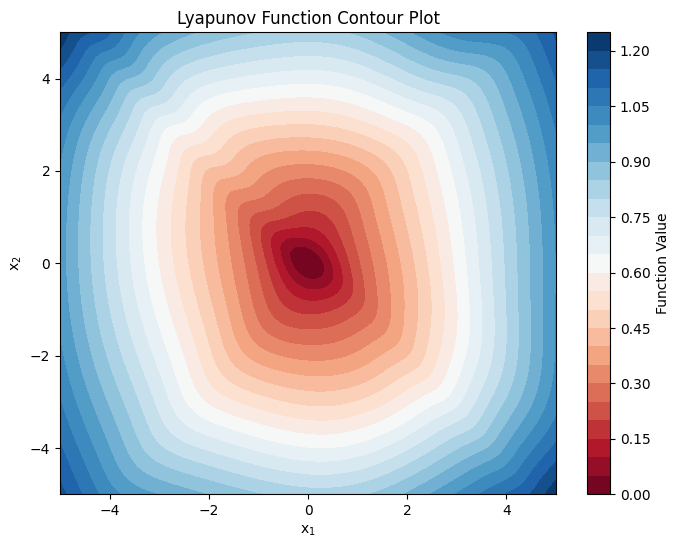

L0:tensor([-0.0005], grad_fn=<SelectBackward0>), PD:0.2410411834716797, torch.sum(F.relu(dL)):1841.1282958984375
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.9613960981
Epoch [2000/10000], Loss: 1.9517717361
Epoch [3000/10000], Loss: 1.9119756222
Epoch [4000/10000], Loss: 1.9386765957
Epoch [5000/10000], Loss: 1.9779613018
Epoch [6000/10000], Loss: 1.9765163660
Epoch [7000/10000], Loss: 1.9409368038
Epoch [8000/10000], Loss: 1.9329293966
Epoch [9000/10000], Loss: 1.9428193569
Epoch [10000/10000], Loss: 2.0485270023


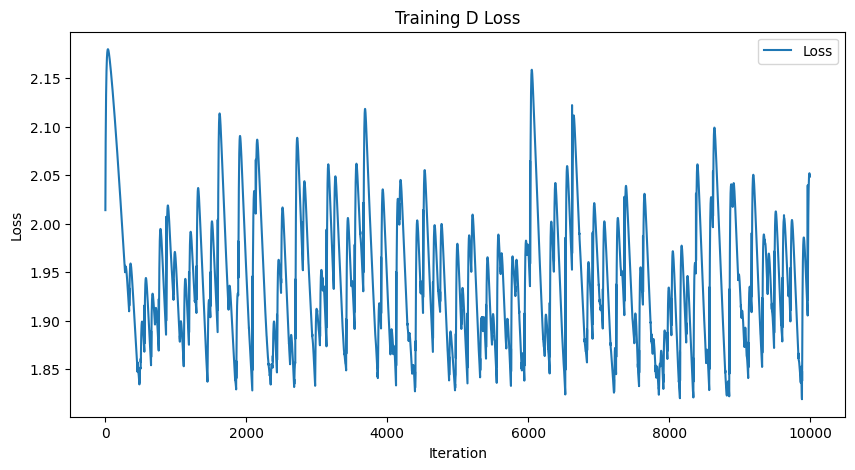

-----------------------Plotting Lyapunov-----------------------


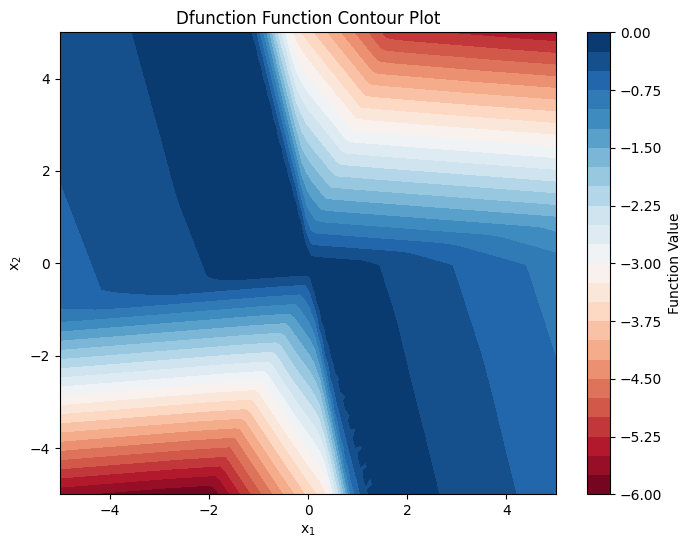

torch.sum(loss_fn(dL, DV_ext)):1.873393177986145, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0041], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


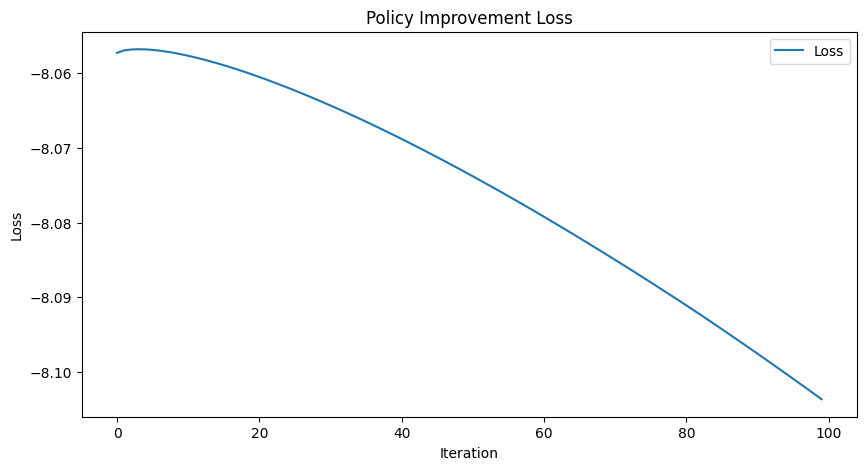

---------------------Sampling Training Data---------------------


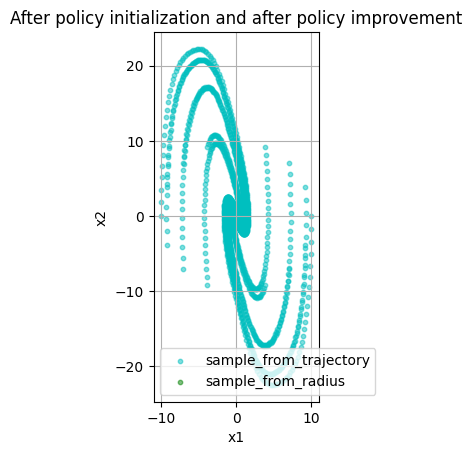

-----------------It takes 209 steps to converge.------------------


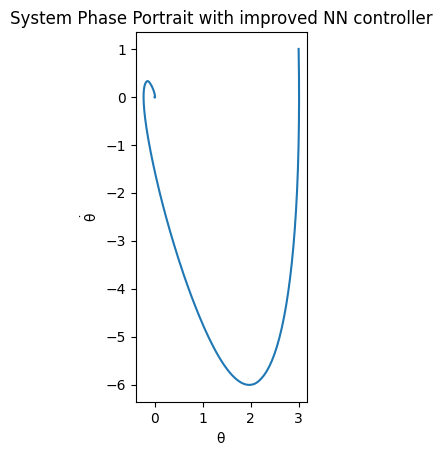

第22次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2221118212
Epoch [2000/10000], Loss: 1.1120955944
Epoch [3000/10000], Loss: 1.0708196163
Epoch [4000/10000], Loss: 1.0605437756
Epoch [5000/10000], Loss: 1.0586425066
Epoch [6000/10000], Loss: 1.0580393076
Epoch [7000/10000], Loss: 1.0577750206
Epoch [8000/10000], Loss: 1.0575884581
Epoch [9000/10000], Loss: 1.0573891401
Epoch [10000/10000], Loss: 1.0571265221


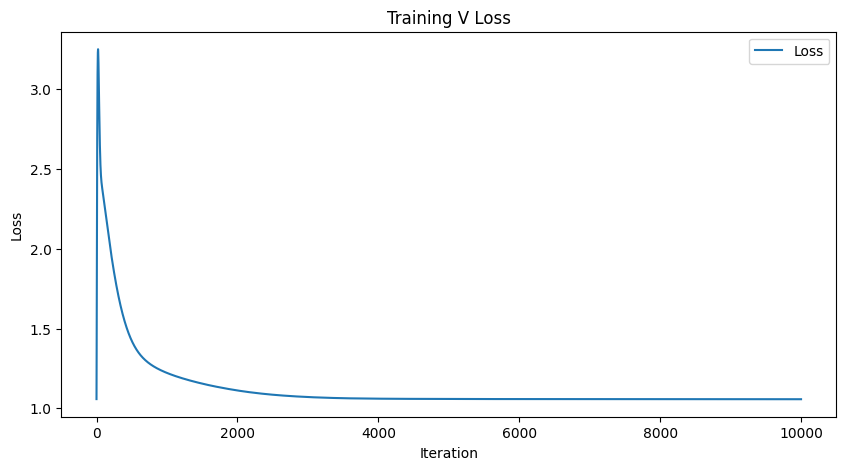

-----------------------Plotting Lyapunov-----------------------


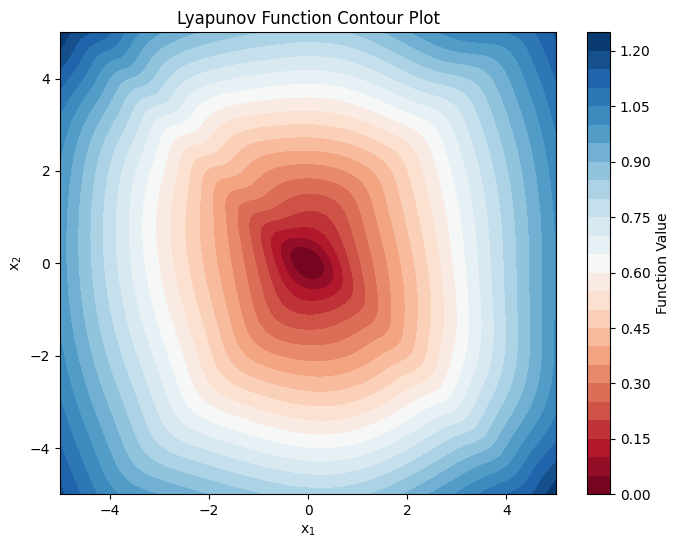

L0:tensor([0.0005], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1830.433349609375
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.9493380785
Epoch [2000/10000], Loss: 1.9555962086
Epoch [3000/10000], Loss: 1.8547810316
Epoch [4000/10000], Loss: 1.9606305361
Epoch [5000/10000], Loss: 1.9189813137
Epoch [6000/10000], Loss: 1.9129065275
Epoch [7000/10000], Loss: 1.8860498667
Epoch [8000/10000], Loss: 1.8648519516
Epoch [9000/10000], Loss: 2.0195555687
Epoch [10000/10000], Loss: 1.8233232498


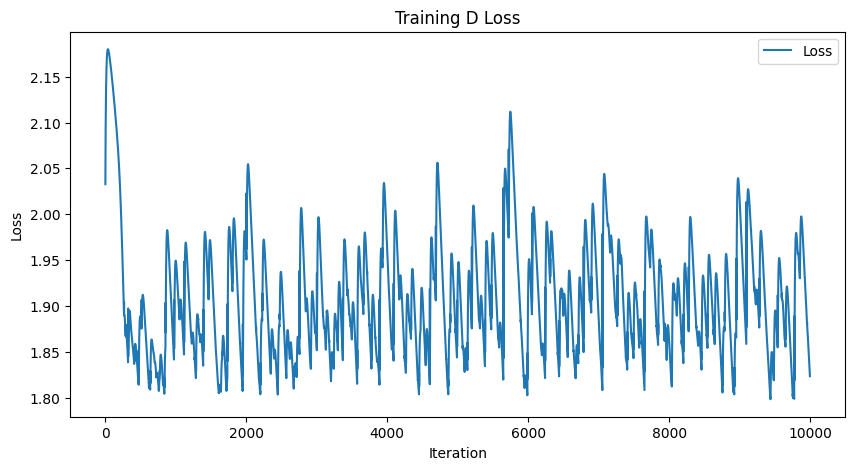

-----------------------Plotting Lyapunov-----------------------


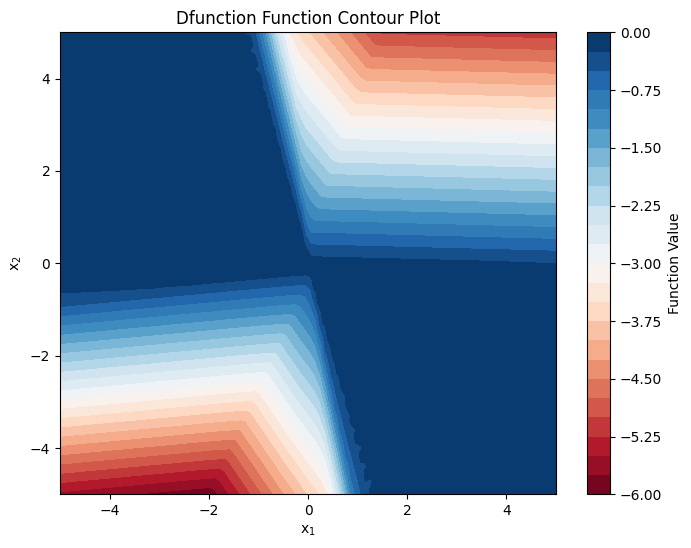

torch.sum(loss_fn(dL, DV_ext)):1.6537057161331177, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0008], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


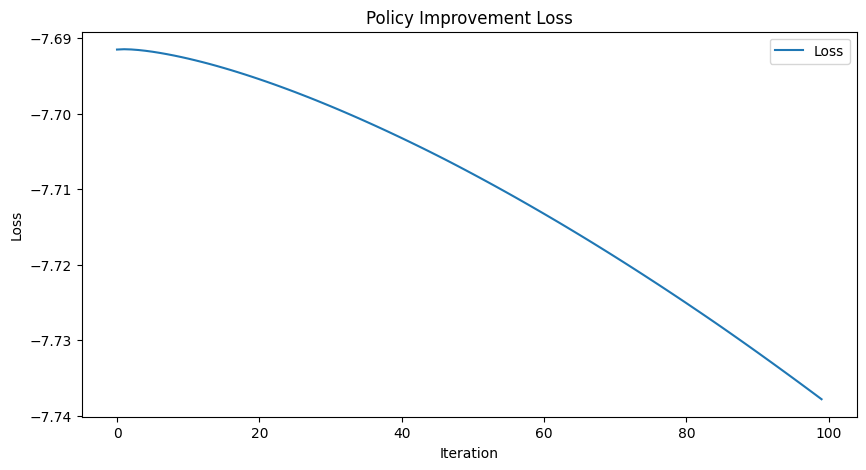

---------------------Sampling Training Data---------------------


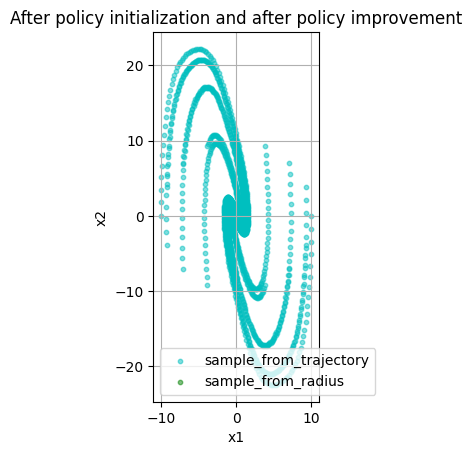

-----------------It takes 207 steps to converge.------------------


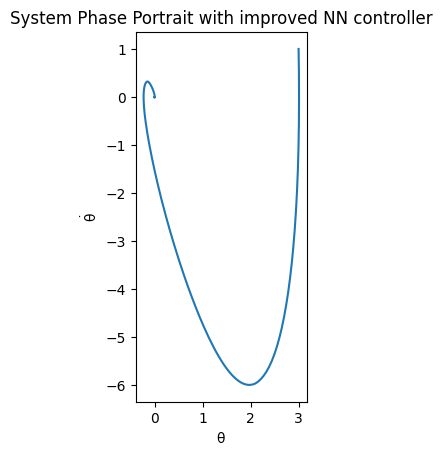

第23次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2167559862
Epoch [2000/10000], Loss: 1.1071654558
Epoch [3000/10000], Loss: 1.0687979460
Epoch [4000/10000], Loss: 1.0578637123
Epoch [5000/10000], Loss: 1.0558059216
Epoch [6000/10000], Loss: 1.0553325415
Epoch [7000/10000], Loss: 1.0550705194
Epoch [8000/10000], Loss: 1.0548666716
Epoch [9000/10000], Loss: 1.0546529293
Epoch [10000/10000], Loss: 1.0544478893


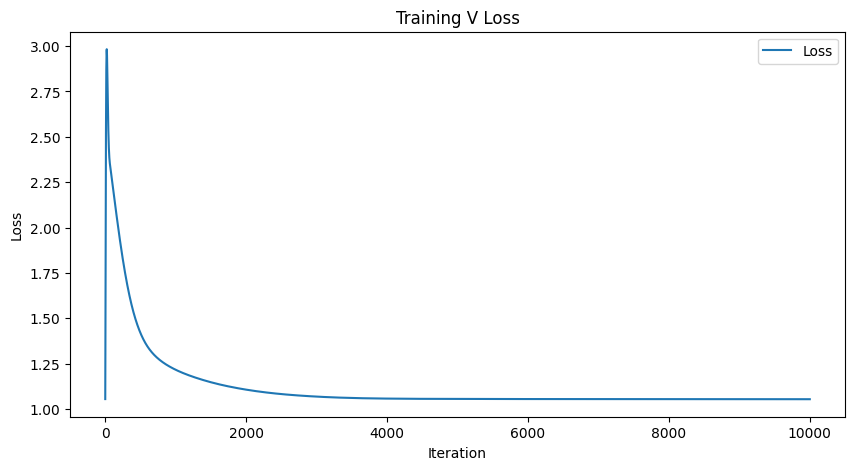

-----------------------Plotting Lyapunov-----------------------


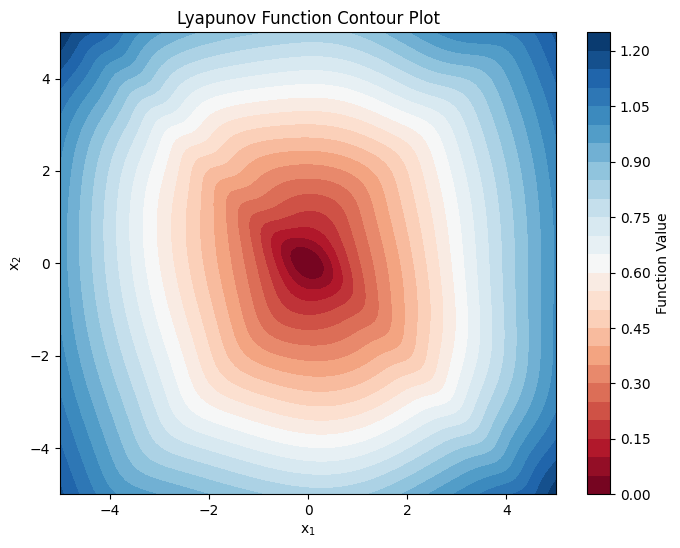

L0:tensor([-0.0009], grad_fn=<SelectBackward0>), PD:0.4783172607421875, torch.sum(F.relu(dL)):1821.147705078125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.8270804882
Epoch [2000/10000], Loss: 1.9031447172
Epoch [3000/10000], Loss: 1.8614175320
Epoch [4000/10000], Loss: 1.9299556017
Epoch [5000/10000], Loss: 1.8834941387
Epoch [6000/10000], Loss: 1.9147380590
Epoch [7000/10000], Loss: 1.8613811731
Epoch [8000/10000], Loss: 1.9447056055
Epoch [9000/10000], Loss: 1.9928431511
Epoch [10000/10000], Loss: 1.8502109051


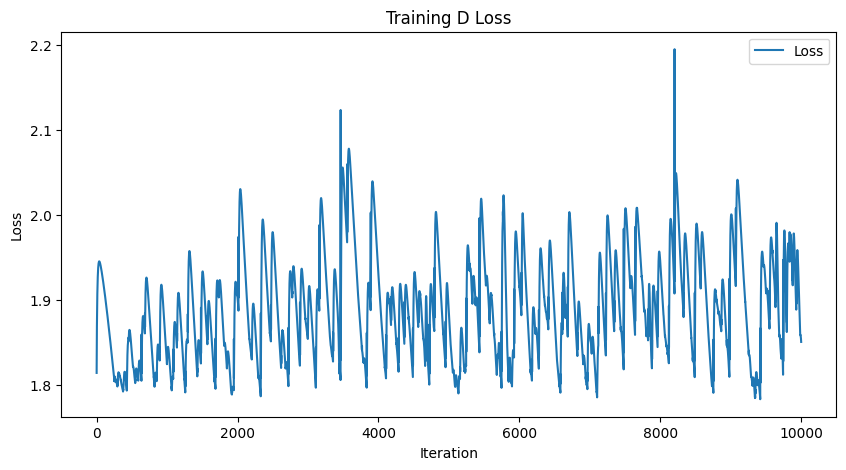

-----------------------Plotting Lyapunov-----------------------


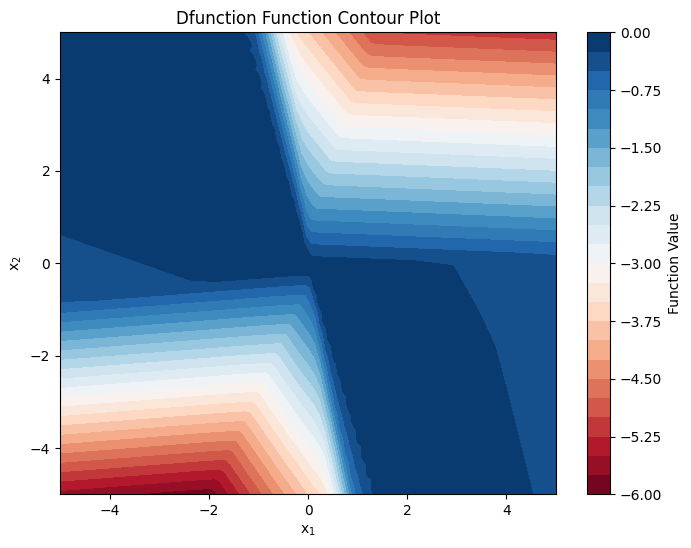

torch.sum(loss_fn(dL, DV_ext)):1.6860536336898804, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0018], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


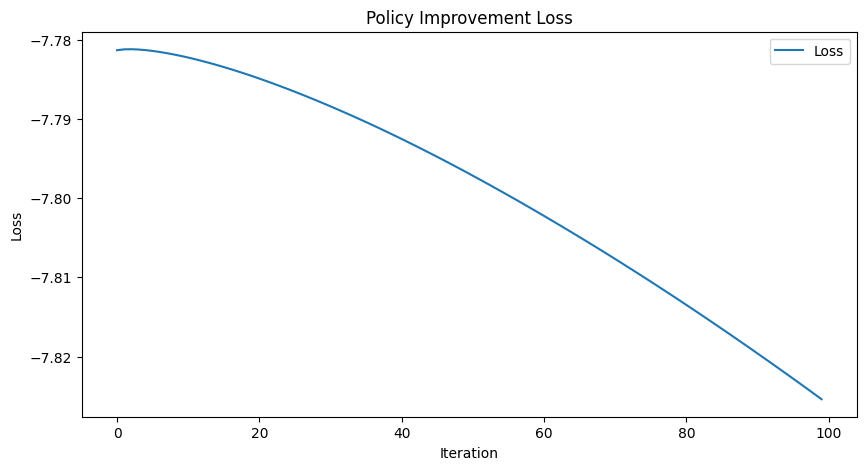

---------------------Sampling Training Data---------------------


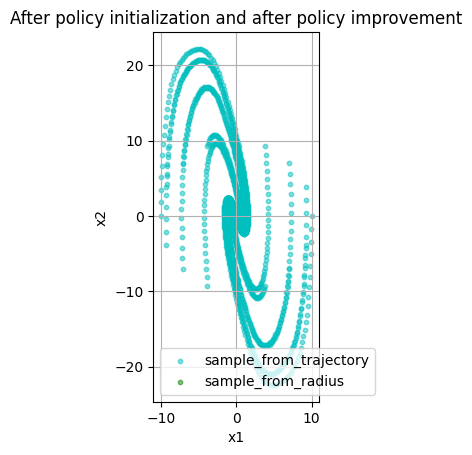

-----------------It takes 205 steps to converge.------------------


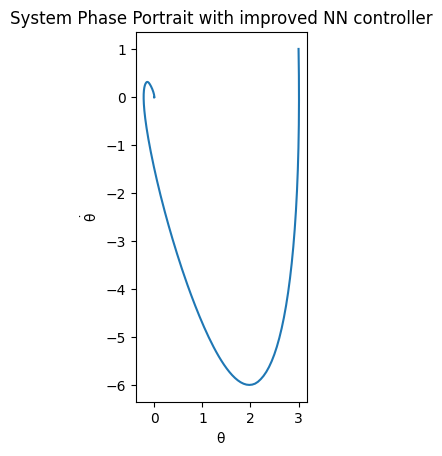

第24次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2112283707
Epoch [2000/10000], Loss: 1.1051214933
Epoch [3000/10000], Loss: 1.0664108992
Epoch [4000/10000], Loss: 1.0554363728
Epoch [5000/10000], Loss: 1.0533691645
Epoch [6000/10000], Loss: 1.0528529882
Epoch [7000/10000], Loss: 1.0526305437
Epoch [8000/10000], Loss: 1.0524610281
Epoch [9000/10000], Loss: 1.0522753000
Epoch [10000/10000], Loss: 1.0520508289


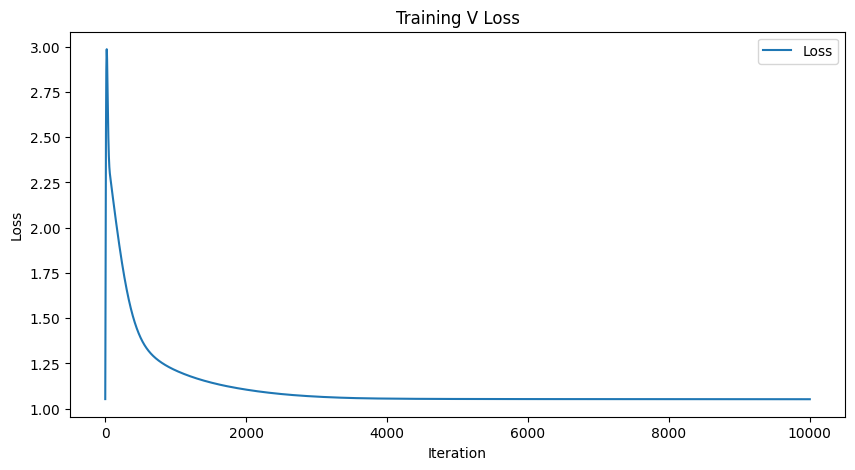

-----------------------Plotting Lyapunov-----------------------


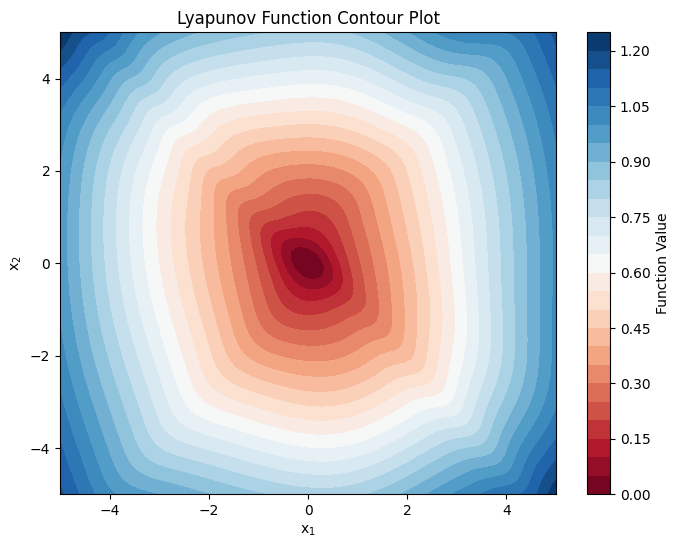

L0:tensor([0.0003], grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1812.2635498046875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.8494516611
Epoch [2000/10000], Loss: 1.8317549229
Epoch [3000/10000], Loss: 1.8512084484
Epoch [4000/10000], Loss: 1.9704481363
Epoch [5000/10000], Loss: 1.8795317411
Epoch [6000/10000], Loss: 1.8678983450
Epoch [7000/10000], Loss: 1.9061546326
Epoch [8000/10000], Loss: 1.8331822157
Epoch [9000/10000], Loss: 1.8202358484
Epoch [10000/10000], Loss: 1.8873460293


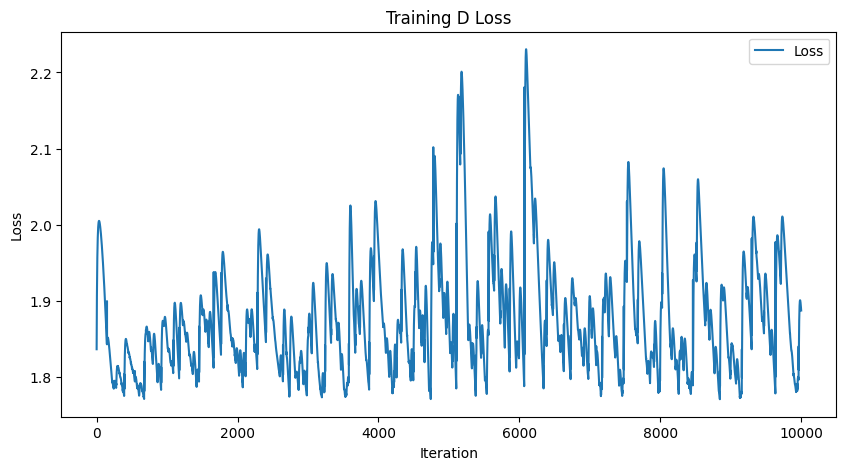

-----------------------Plotting Lyapunov-----------------------


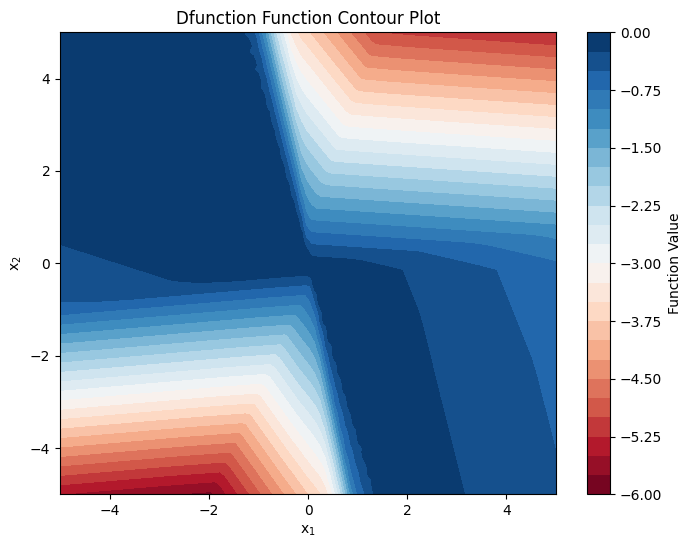

torch.sum(loss_fn(dL, DV_ext)):1.7266258001327515, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0035], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


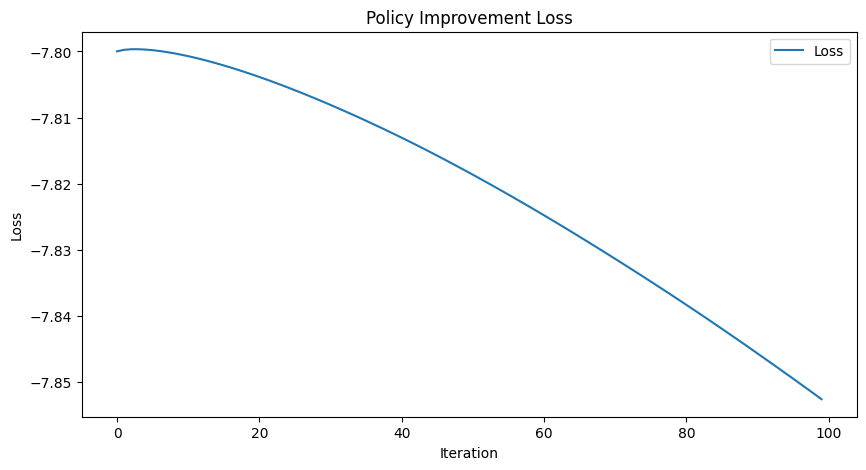

---------------------Sampling Training Data---------------------


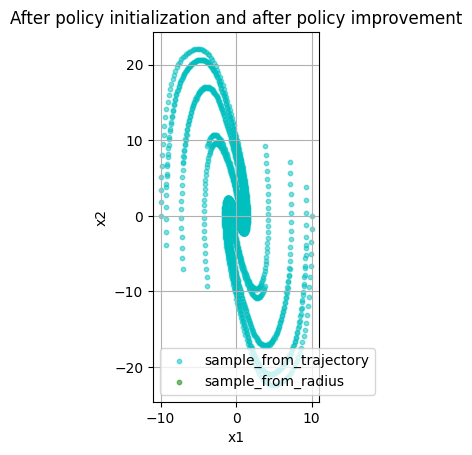

-----------------It takes 203 steps to converge.------------------


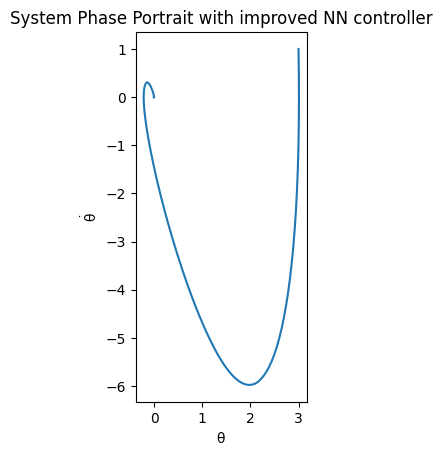

第25次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.2096736431
Epoch [2000/10000], Loss: 1.1025594473
Epoch [3000/10000], Loss: 1.0637346506
Epoch [4000/10000], Loss: 1.0524698496
Epoch [5000/10000], Loss: 1.0505537987
Epoch [6000/10000], Loss: 1.0500264168
Epoch [7000/10000], Loss: 1.0498092175
Epoch [8000/10000], Loss: 1.0496320724
Epoch [9000/10000], Loss: 1.0494625568
Epoch [10000/10000], Loss: 1.0491881371


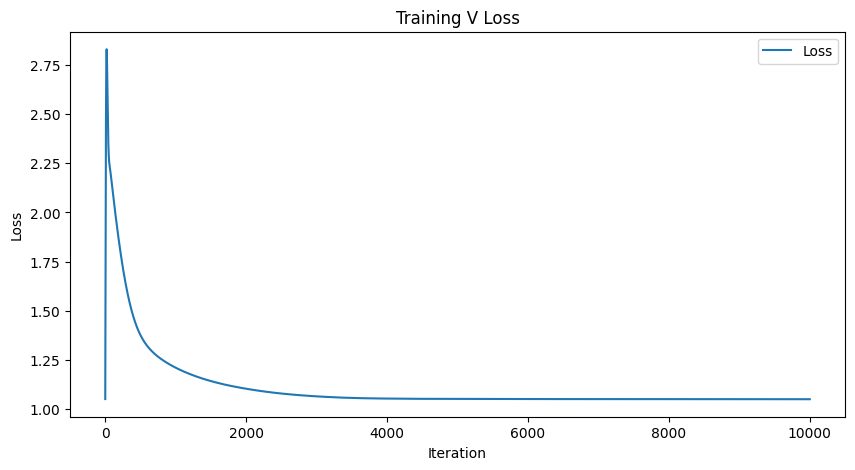

-----------------------Plotting Lyapunov-----------------------


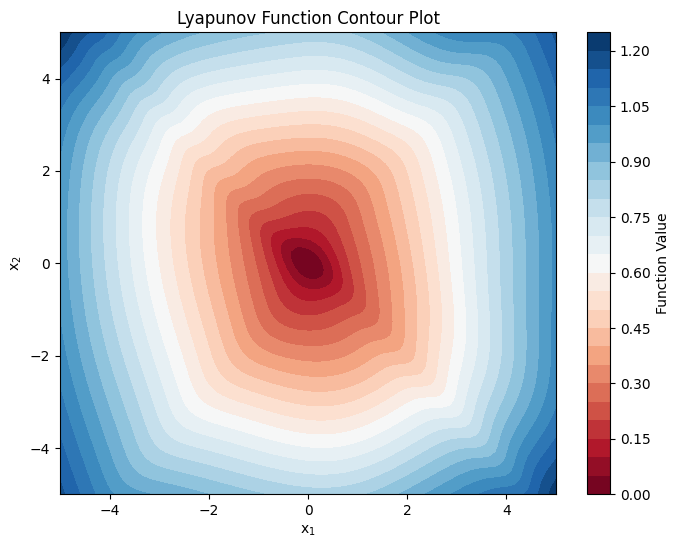

L0:tensor([-0.0003], grad_fn=<SelectBackward0>), PD:0.09285831451416016, torch.sum(F.relu(dL)):1801.0452880859375
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.8495446444
Epoch [2000/10000], Loss: 1.9933556318
Epoch [3000/10000], Loss: 1.8491067886
Epoch [4000/10000], Loss: 1.8913686275
Epoch [5000/10000], Loss: 1.9589289427
Epoch [6000/10000], Loss: 1.9439036846
Epoch [7000/10000], Loss: 1.8773033619
Epoch [8000/10000], Loss: 1.8797347546
Epoch [9000/10000], Loss: 1.8672325611
Epoch [10000/10000], Loss: 1.9263236523


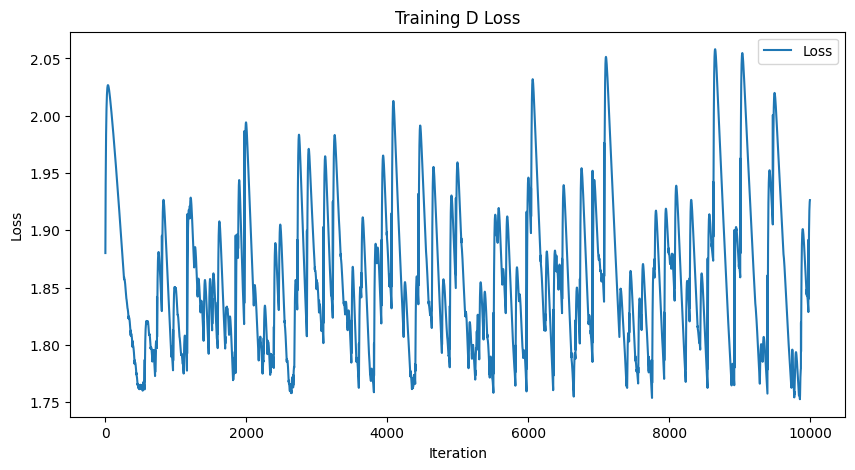

-----------------------Plotting Lyapunov-----------------------


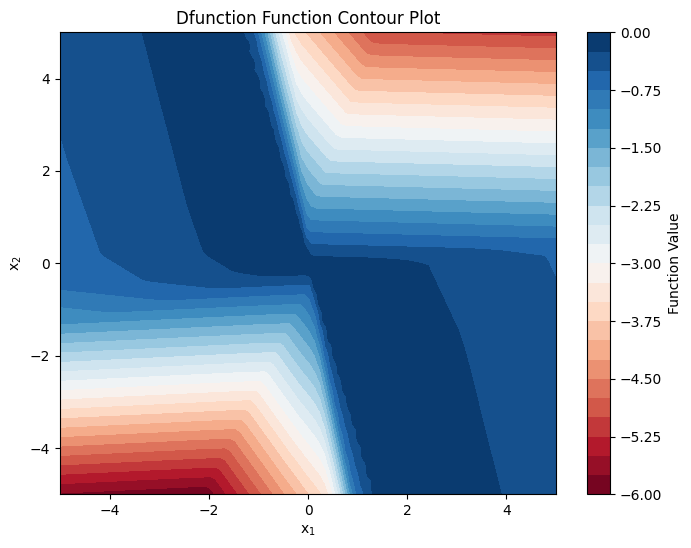

torch.sum(loss_fn(dL, DV_ext)):1.770066499710083, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0045], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


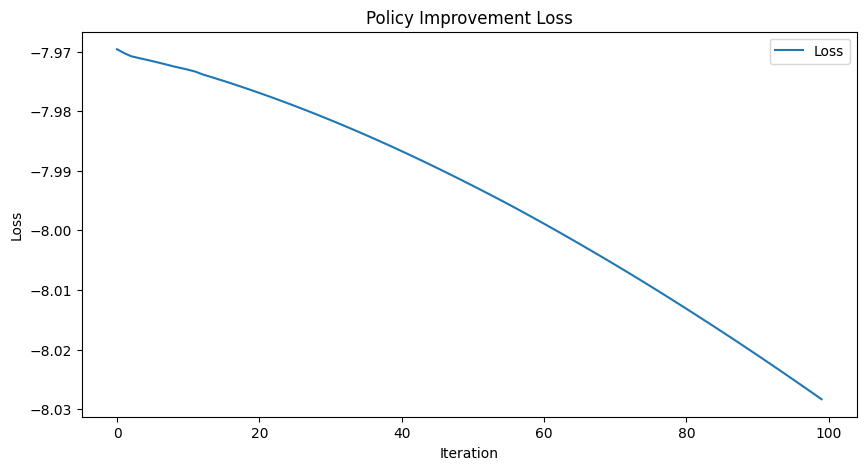

---------------------Sampling Training Data---------------------


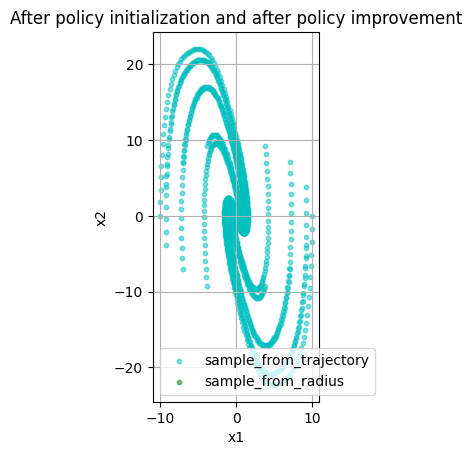

-----------------It takes 200 steps to converge.------------------


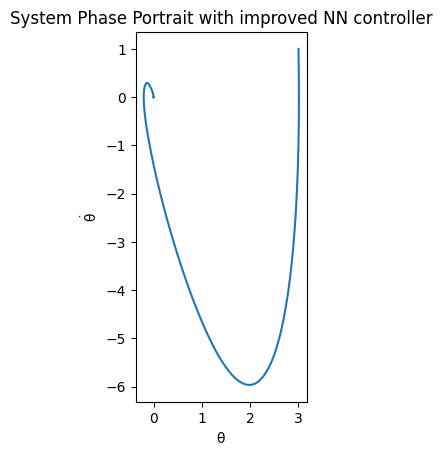

第26次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.1930791140
Epoch [2000/10000], Loss: 1.0933468342
Epoch [3000/10000], Loss: 1.0613909960
Epoch [4000/10000], Loss: 1.0506341457
Epoch [5000/10000], Loss: 1.0483703613
Epoch [6000/10000], Loss: 1.0476474762
Epoch [7000/10000], Loss: 1.0472936630
Epoch [8000/10000], Loss: 1.0469937325
Epoch [9000/10000], Loss: 1.0468145609
Epoch [10000/10000], Loss: 1.0466005802


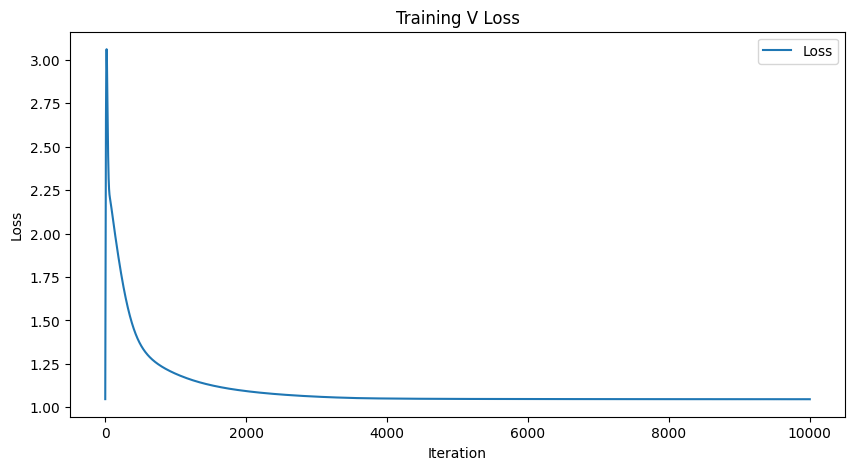

-----------------------Plotting Lyapunov-----------------------


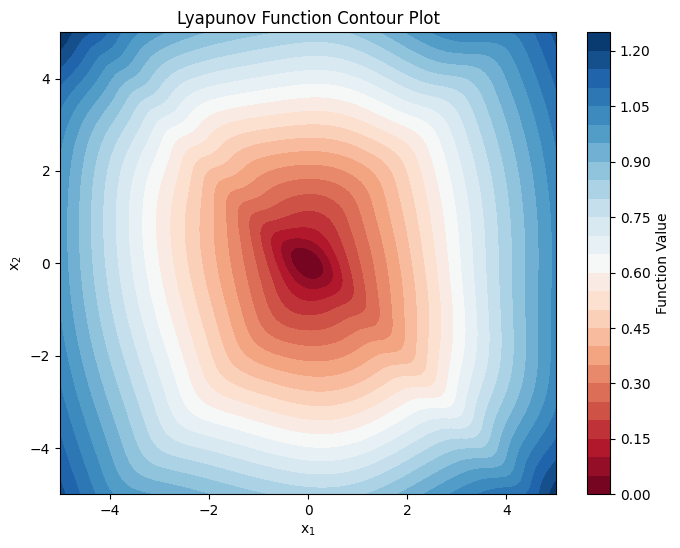

L0:tensor([-0.0008], grad_fn=<SelectBackward0>), PD:0.4419822692871094, torch.sum(F.relu(dL)):1791.576904296875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.7581999302
Epoch [2000/10000], Loss: 1.9272171259
Epoch [3000/10000], Loss: 1.7579593658
Epoch [4000/10000], Loss: 1.7856185436
Epoch [5000/10000], Loss: 1.8697971106
Epoch [6000/10000], Loss: 1.7488160133
Epoch [7000/10000], Loss: 1.7777330875
Epoch [8000/10000], Loss: 1.9161942005
Epoch [9000/10000], Loss: 1.8811436892
Epoch [10000/10000], Loss: 1.7419805527


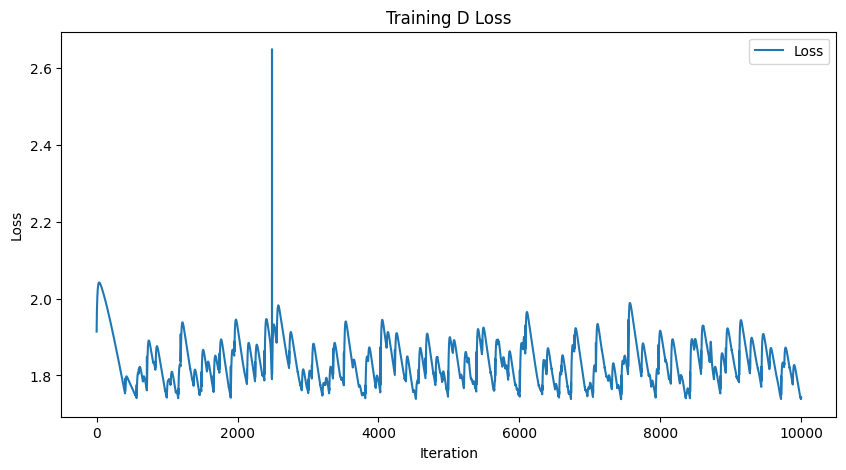

-----------------------Plotting Lyapunov-----------------------


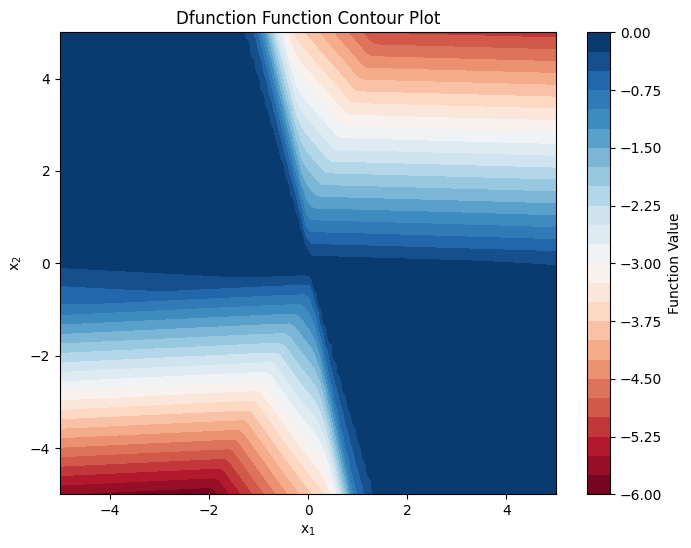

torch.sum(loss_fn(dL, DV_ext)):1.58956778049469, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0023], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


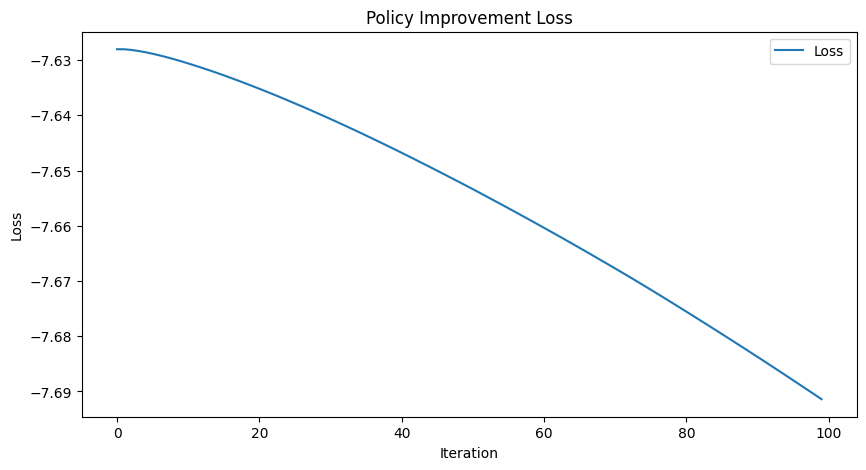

---------------------Sampling Training Data---------------------


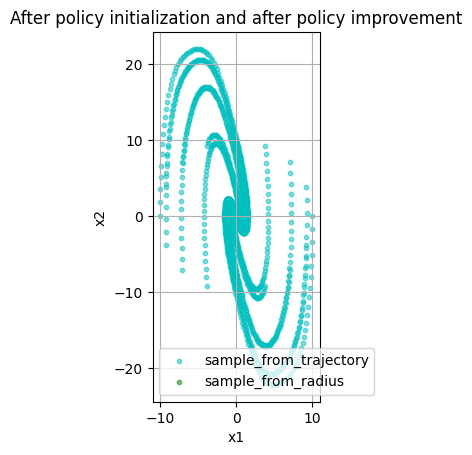

-----------------It takes 197 steps to converge.------------------


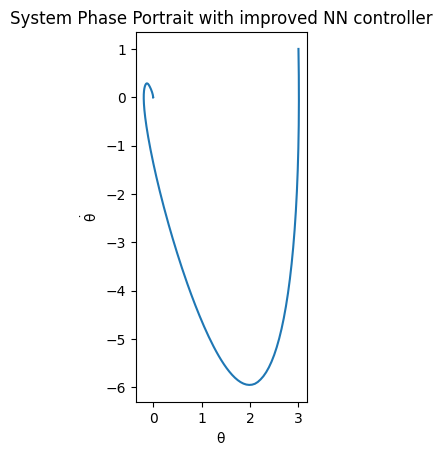

第27次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.1914558411
Epoch [2000/10000], Loss: 1.0914112329
Epoch [3000/10000], Loss: 1.0566568375
Epoch [4000/10000], Loss: 1.0466730595
Epoch [5000/10000], Loss: 1.0449719429
Epoch [6000/10000], Loss: 1.0445274115
Epoch [7000/10000], Loss: 1.0443277359
Epoch [8000/10000], Loss: 1.0442030430
Epoch [9000/10000], Loss: 1.0440543890
Epoch [10000/10000], Loss: 1.0438529253


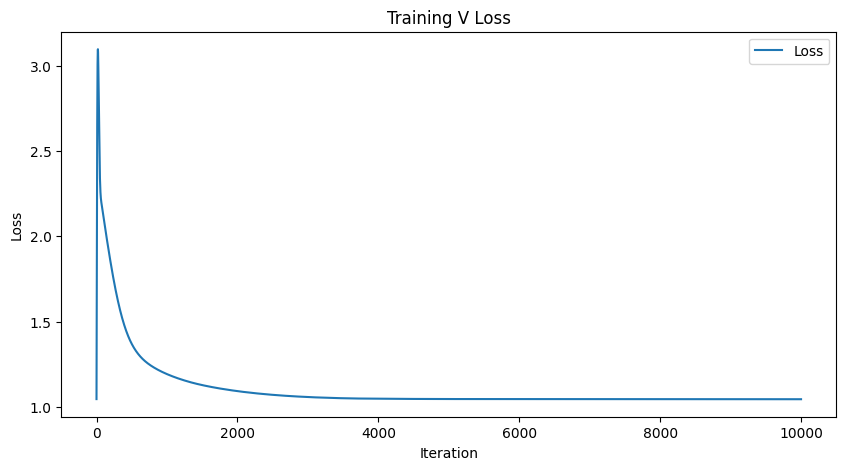

-----------------------Plotting Lyapunov-----------------------


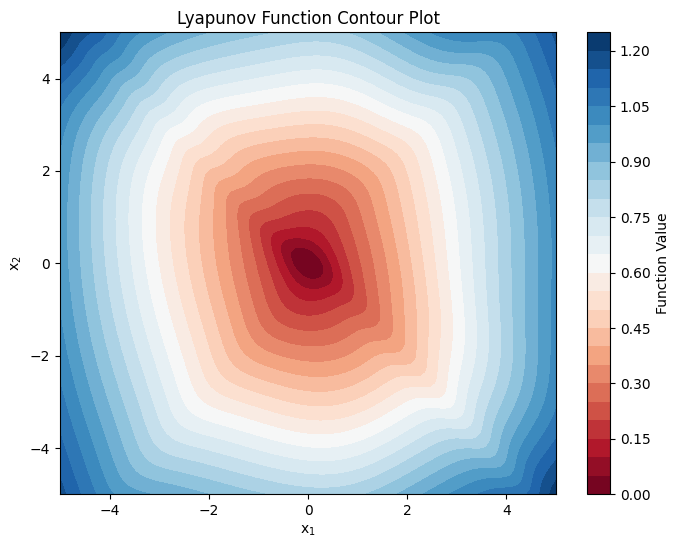

L0:tensor([-0.0004], grad_fn=<SelectBackward0>), PD:0.2166285514831543, torch.sum(F.relu(dL)):1780.985595703125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.7422798872
Epoch [2000/10000], Loss: 1.9209774733
Epoch [3000/10000], Loss: 1.7684113979
Epoch [4000/10000], Loss: 1.7540450096
Epoch [5000/10000], Loss: 1.8602354527
Epoch [6000/10000], Loss: 1.8068183661
Epoch [7000/10000], Loss: 1.8409754038
Epoch [8000/10000], Loss: 1.8350474834
Epoch [9000/10000], Loss: 1.8169411421
Epoch [10000/10000], Loss: 1.7474044561


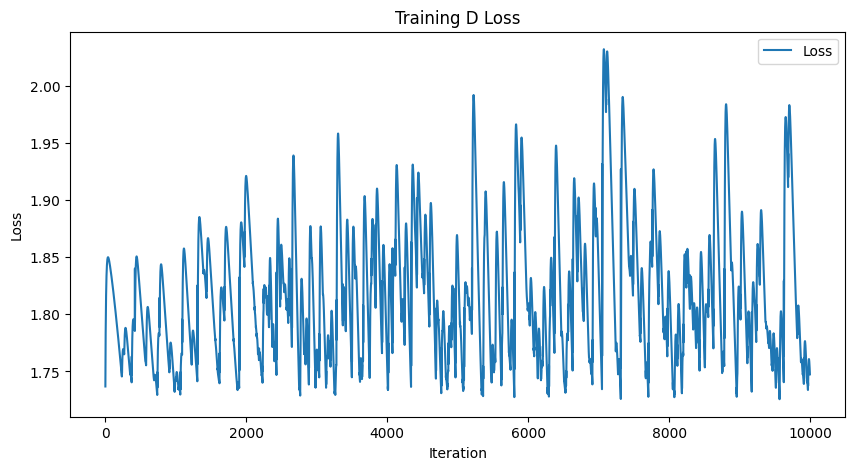

-----------------------Plotting Lyapunov-----------------------


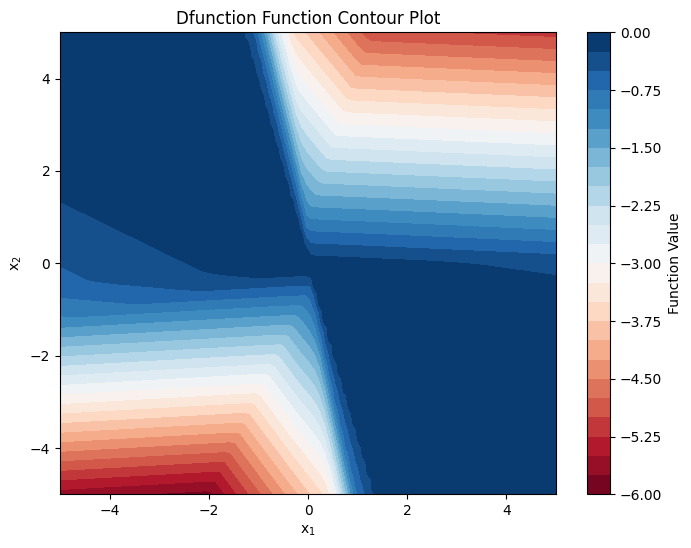

torch.sum(loss_fn(dL, DV_ext)):1.600457787513733, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0009], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


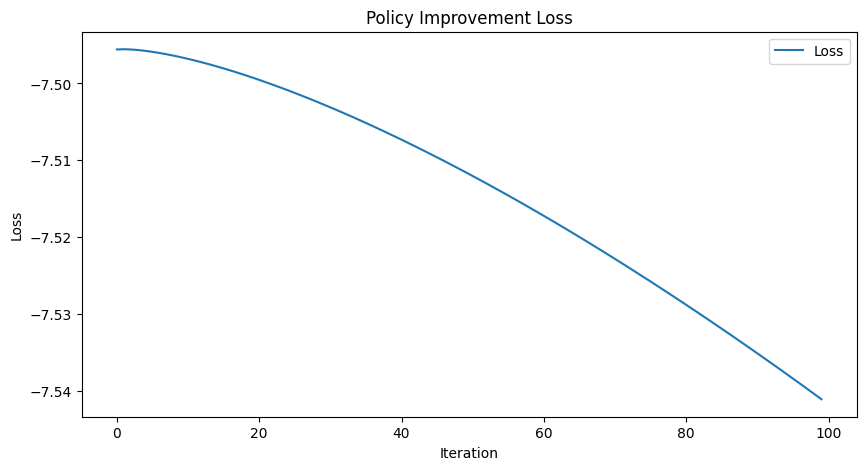

---------------------Sampling Training Data---------------------


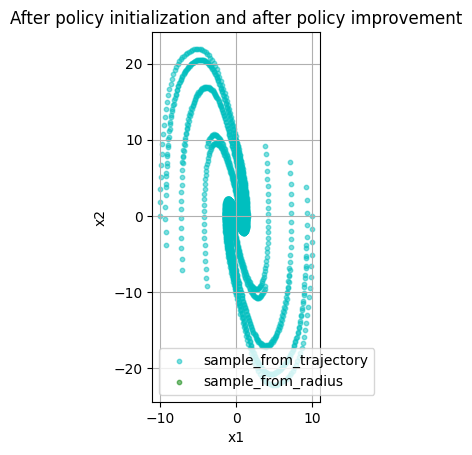

-----------------It takes 195 steps to converge.------------------


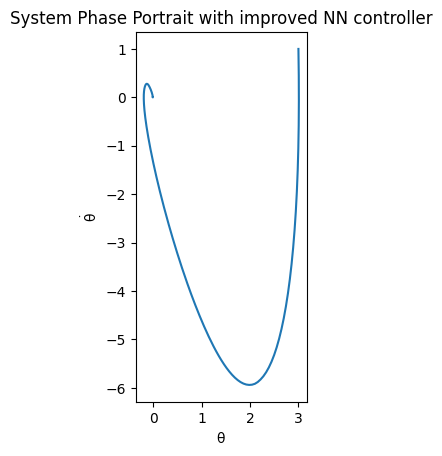

第28次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.1876590252
Epoch [2000/10000], Loss: 1.0885161161
Epoch [3000/10000], Loss: 1.0545265675
Epoch [4000/10000], Loss: 1.0446164608
Epoch [5000/10000], Loss: 1.0428042412
Epoch [6000/10000], Loss: 1.0423607826
Epoch [7000/10000], Loss: 1.0421651602
Epoch [8000/10000], Loss: 1.0420472622
Epoch [9000/10000], Loss: 1.0419120789
Epoch [10000/10000], Loss: 1.0417522192


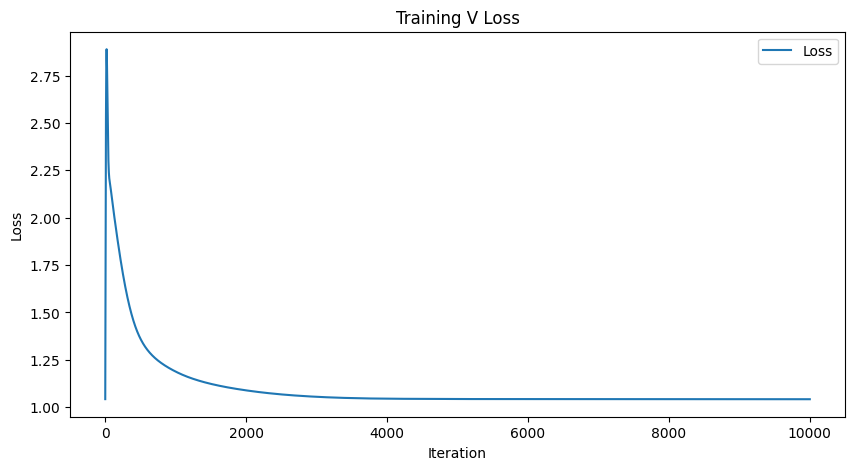

-----------------------Plotting Lyapunov-----------------------


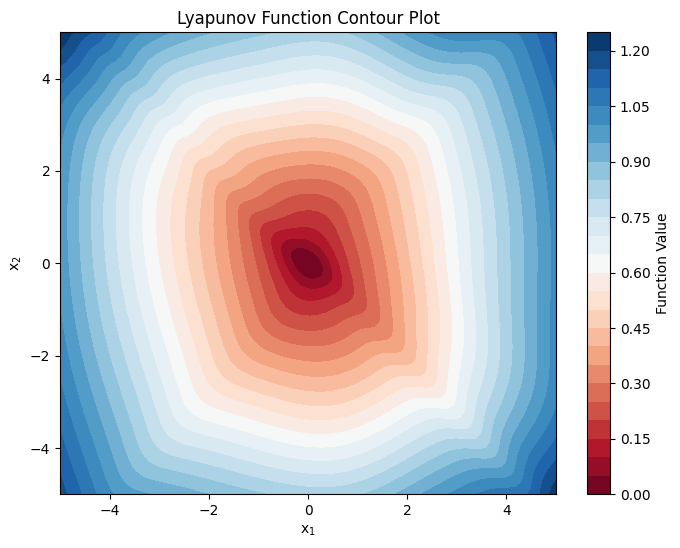

L0:tensor([-0.0010], grad_fn=<SelectBackward0>), PD:0.6732275485992432, torch.sum(F.relu(dL)):1773.216064453125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.8214738369
Epoch [2000/10000], Loss: 1.7982089520
Epoch [3000/10000], Loss: 1.7675751448
Epoch [4000/10000], Loss: 1.8111535311
Epoch [5000/10000], Loss: 1.7729468346
Epoch [6000/10000], Loss: 1.8996762037
Epoch [7000/10000], Loss: 1.7917257547
Epoch [8000/10000], Loss: 1.8390023708
Epoch [9000/10000], Loss: 1.8858541250
Epoch [10000/10000], Loss: 1.7241619825


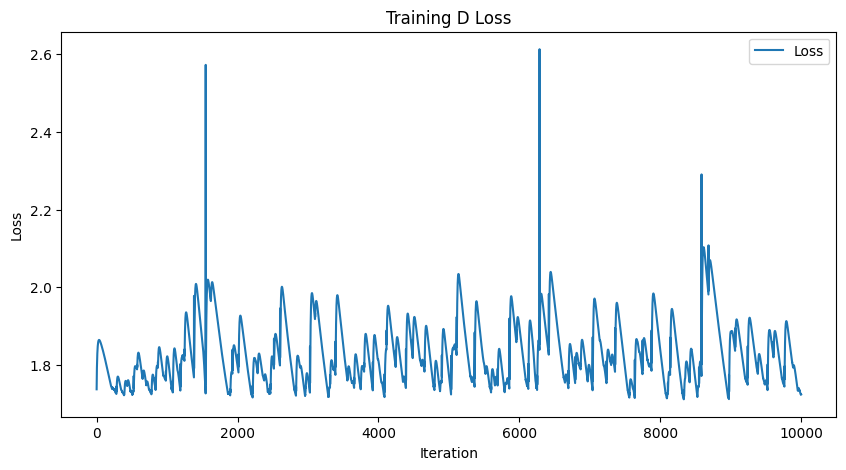

-----------------------Plotting Lyapunov-----------------------


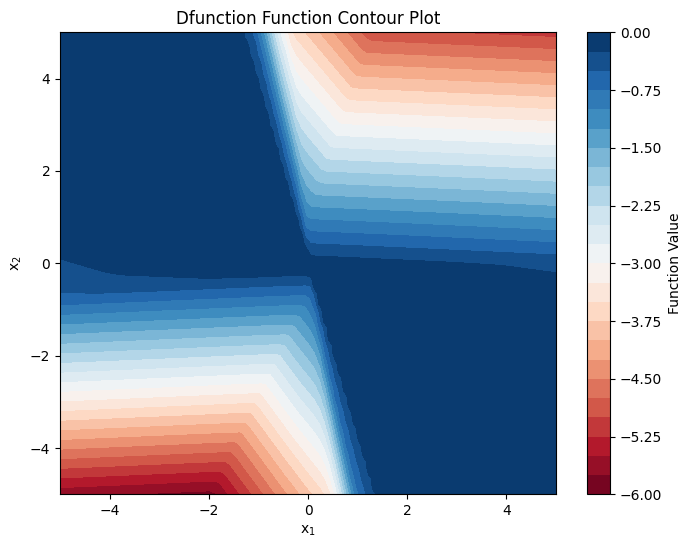

torch.sum(loss_fn(dL, DV_ext)):1.581540584564209, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0012], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


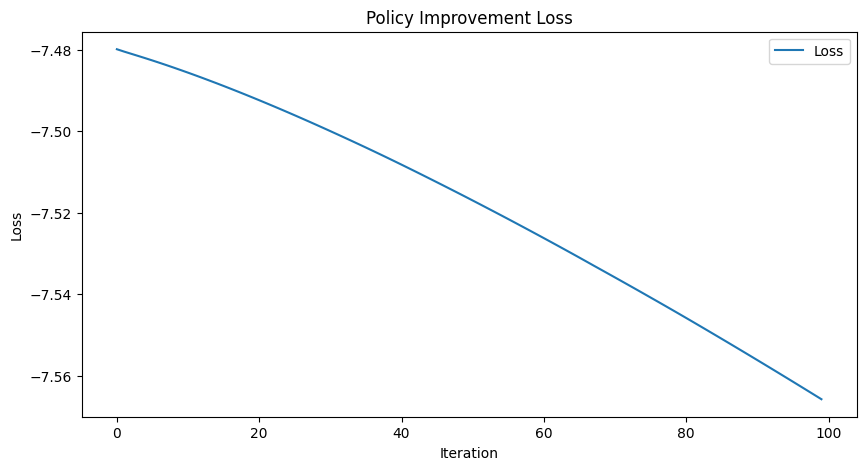

---------------------Sampling Training Data---------------------


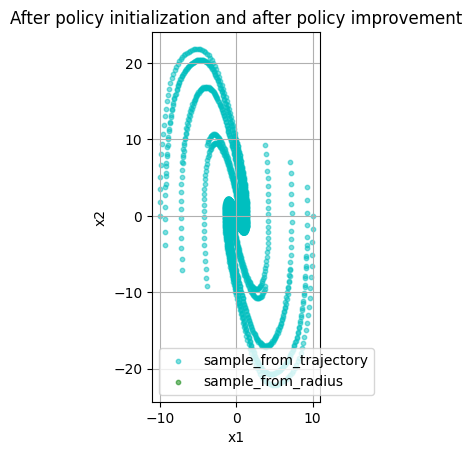

-----------------It takes 193 steps to converge.------------------


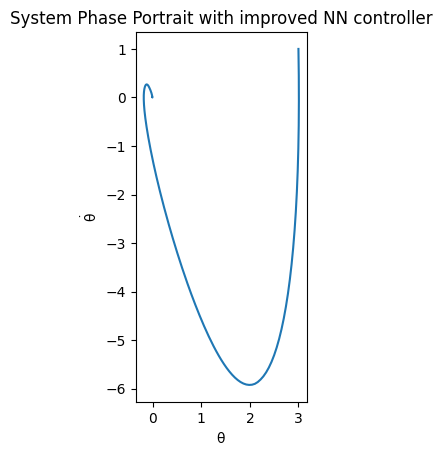

第29次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.1848278046
Epoch [2000/10000], Loss: 1.0846896172
Epoch [3000/10000], Loss: 1.0512458086
Epoch [4000/10000], Loss: 1.0414742231
Epoch [5000/10000], Loss: 1.0394653082
Epoch [6000/10000], Loss: 1.0390092134
Epoch [7000/10000], Loss: 1.0388411283
Epoch [8000/10000], Loss: 1.0387141705
Epoch [9000/10000], Loss: 1.0385606289
Epoch [10000/10000], Loss: 1.0383564234


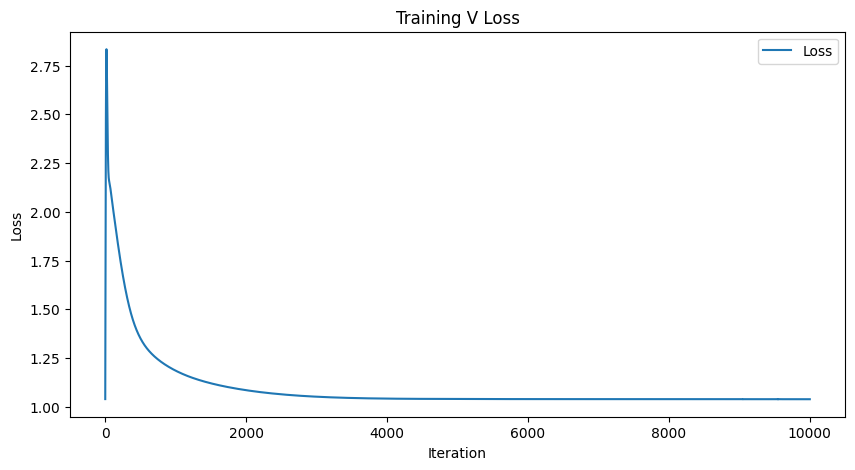

-----------------------Plotting Lyapunov-----------------------


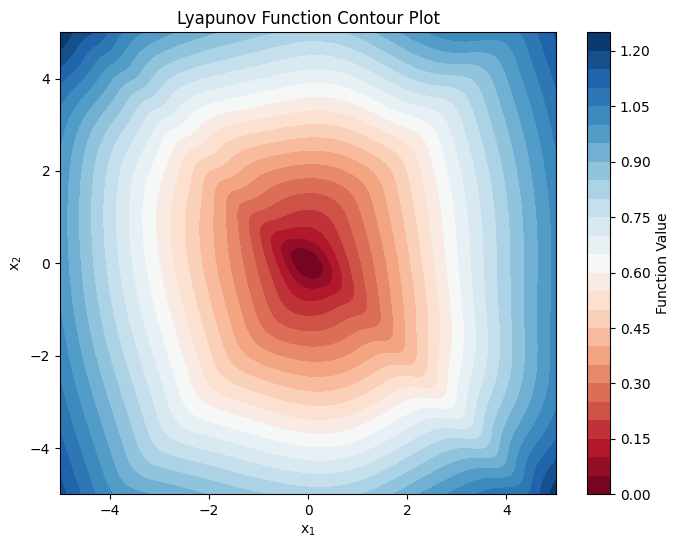

L0:tensor([-0.0007], grad_fn=<SelectBackward0>), PD:0.5049188137054443, torch.sum(F.relu(dL)):1757.58642578125
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.7432012558
Epoch [2000/10000], Loss: 1.8232659101
Epoch [3000/10000], Loss: 1.7096213102
Epoch [4000/10000], Loss: 1.9853875637
Epoch [5000/10000], Loss: 1.7342592478
Epoch [6000/10000], Loss: 1.7308604717
Epoch [7000/10000], Loss: 1.8229813576
Epoch [8000/10000], Loss: 1.7099167109
Epoch [9000/10000], Loss: 1.8038122654
Epoch [10000/10000], Loss: 1.7061634064


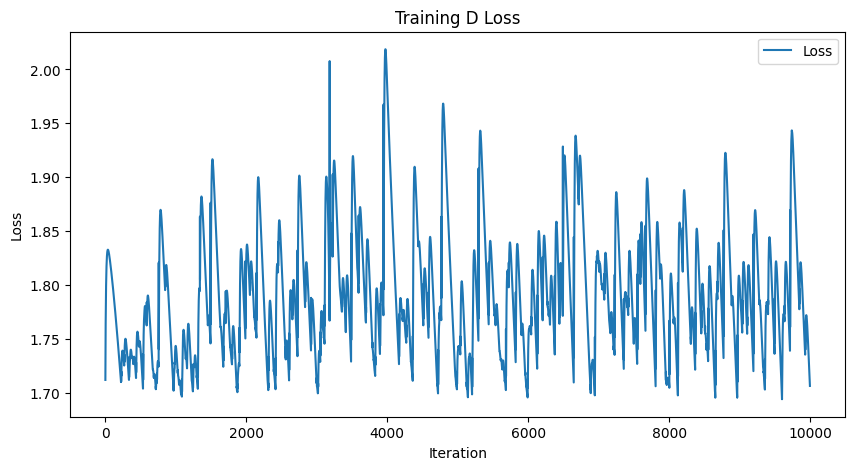

-----------------------Plotting Lyapunov-----------------------


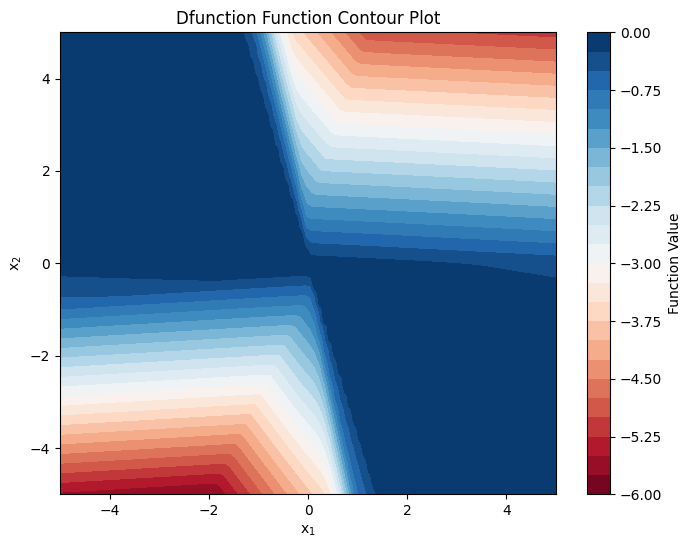

torch.sum(loss_fn(dL, DV_ext)):1.5688750743865967, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0003], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


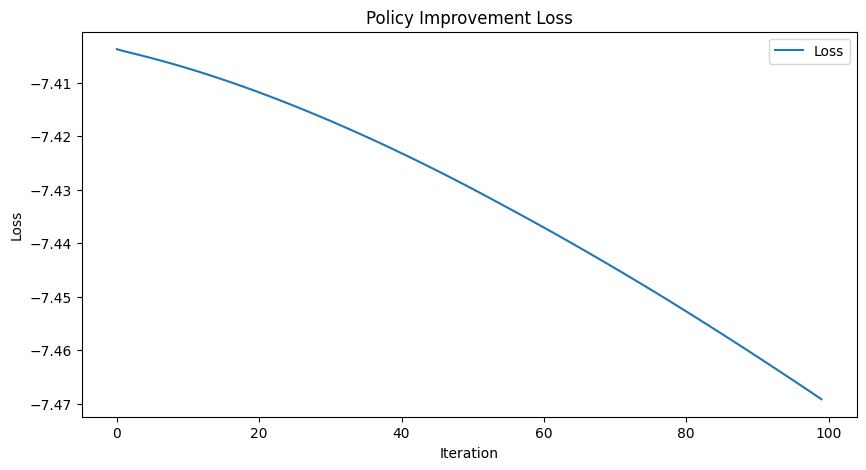

---------------------Sampling Training Data---------------------


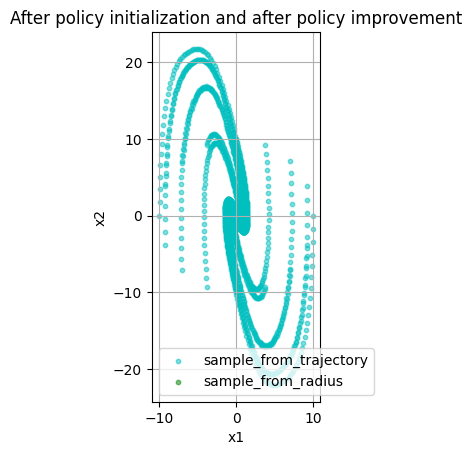

-----------------It takes 148 steps to converge.------------------


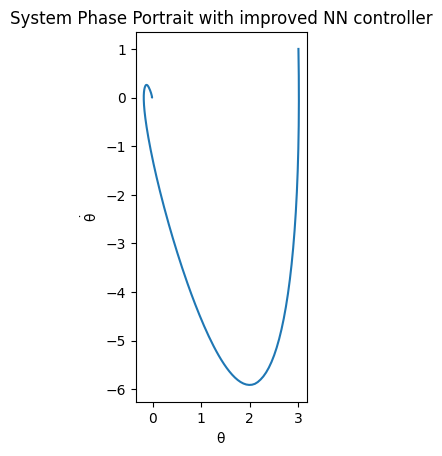

第30次迭代
--------------------------Learning V--------------------------
Epoch [1000/10000], Loss: 1.1829292774
Epoch [2000/10000], Loss: 1.0792703629
Epoch [3000/10000], Loss: 1.0472753048
Epoch [4000/10000], Loss: 1.0385730267
Epoch [5000/10000], Loss: 1.0368645191
Epoch [6000/10000], Loss: 1.0363854170
Epoch [7000/10000], Loss: 1.0361839533
Epoch [8000/10000], Loss: 1.0360585451
Epoch [9000/10000], Loss: 1.0359189510
Epoch [10000/10000], Loss: 1.0357587337


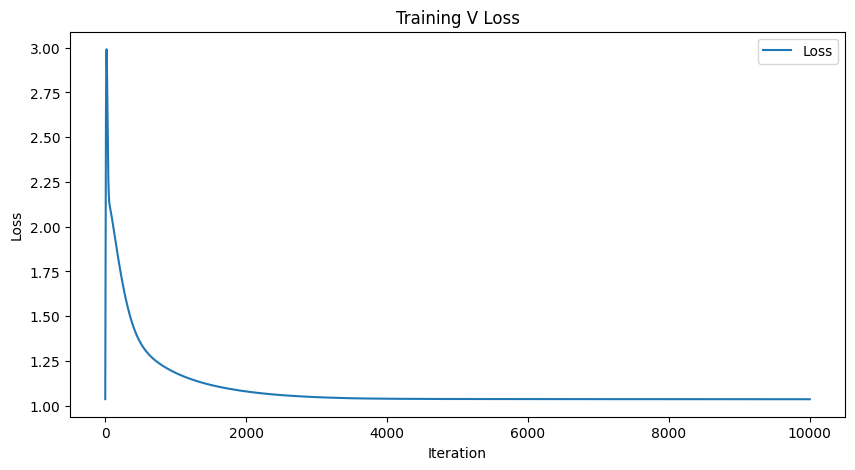

-----------------------Plotting Lyapunov-----------------------


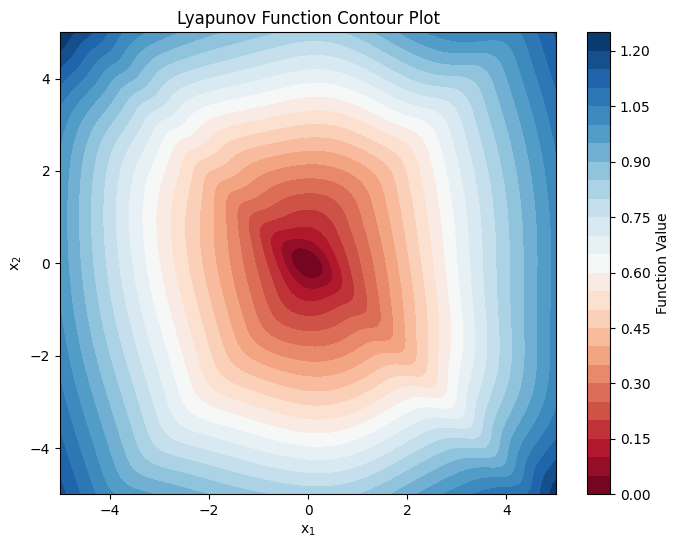

L0:tensor([-0.0011], grad_fn=<SelectBackward0>), PD:0.8526661396026611, torch.sum(F.relu(dL)):1745.98779296875
--------------------------Learning D--------------------------
torch.Size([4800, 2])
Epoch [1000/10000], Loss: 1.7075567245
Epoch [2000/10000], Loss: 1.9025323391
Epoch [3000/10000], Loss: 1.7760019302
Epoch [4000/10000], Loss: 1.7887376547
Epoch [5000/10000], Loss: 1.8288929462
Epoch [6000/10000], Loss: 1.6972739697
Epoch [7000/10000], Loss: 1.6838066578
Epoch [8000/10000], Loss: 1.8671398163
Epoch [9000/10000], Loss: 1.7336734533
Epoch [10000/10000], Loss: 1.7073736191


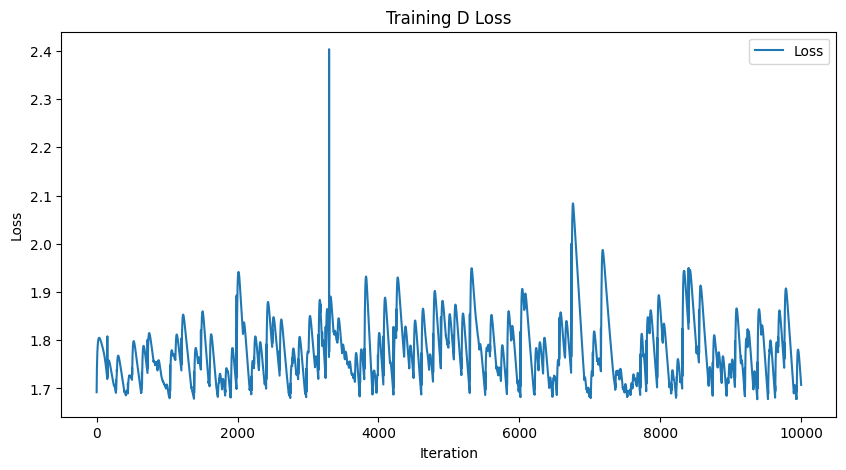

-----------------------Plotting Lyapunov-----------------------


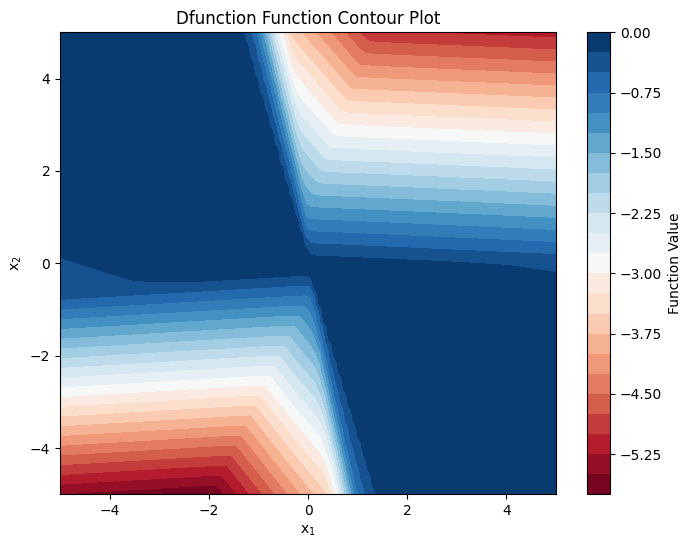

torch.sum(loss_fn(dL, DV_ext)):1.5729725360870361, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0015], grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


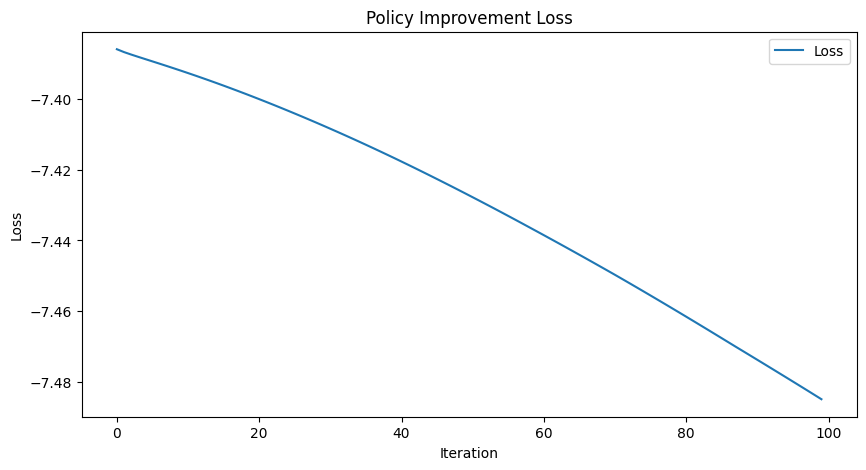

---------------------Sampling Training Data---------------------


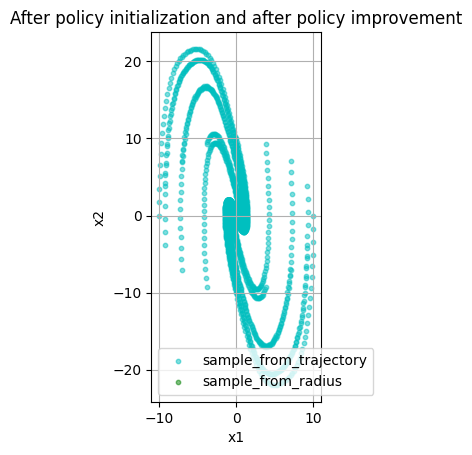

-----------------It takes 146 steps to converge.------------------


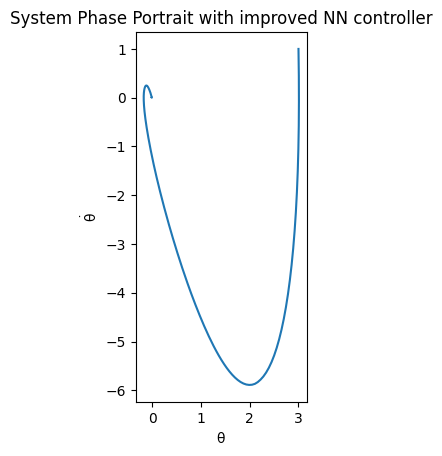

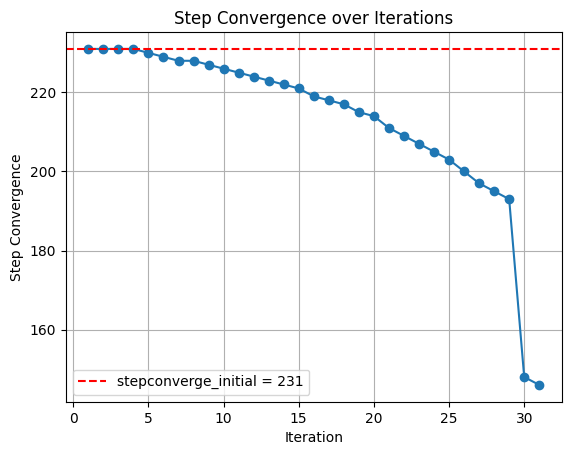

In [7]:
# 创建一个空列表来存储每次迭代的 stepconverge 值
stepconverge_list = []
stepconverge_list.append(stepconverge_initial)

for i in range(30):
    print(f"第{i+1}次迭代")
    d1.learn_V_LNN(sample_data = sim_data,
                iteration = 1*10**4,
                plot_loss = True,
                plot_lyapuonv = True,
                lr = 1e-3)

    d1.learn_D_DNN(sample_data = sim_data,
                iteration = 10**4,
                plot_loss = True,
                plot_dfunction = True,
                lr = 1e-4)

    d1.policy_improvement(sample_data = sim_data,
                        iteration = 10**2,
                        plot_loss = True)


    sim_data = d1.sample_training_data(sample_trajectory_number = 16,
                                    sample_number_per_trajectory = 300,
                                    sample_radius = 10,
                                    sample_number_in_radius = 0,
                                    invariant_sample = 1,
                                    sample_plot = 1,
                                    the_controller = d1.actor.Controller,
                                    title = 'After policy initialization and after policy improvement')

    x_initial = torch.tensor([[3],[1]]).to(device)
    step_num = 4000
    sim_data_ = p1.simulate_rk4(x_initial = x_initial, 
                            step_number = step_num,
                            use_controller = 1,
                            the_controller = d1.actor.Controller)
    
    stepconverge = p1.convergence_judgment(sim_data_)
    stepconverge_list.append(stepconverge)  # 将每次迭代的 stepconverge 值添加到列表中

    p1.plot_phase_portrait(data_sim = sim_data_,
                        arrow_on = False,
                        title = 'System Phase Portrait with improved NN controller')
    
  
        
# 绘制 stepconverge 值随迭代次数变化的折线图
plt.figure()
plt.plot(range(1, len(stepconverge_list) + 1), stepconverge_list, marker='o')
plt.axhline(y=stepconverge_initial, color='r', linestyle='--', label=f'stepconverge_initial = {stepconverge_initial}')
plt.xlabel('Iteration')
plt.ylabel('Step Convergence')
plt.title('Step Convergence over Iterations')
plt.grid(True)
plt.legend()  # Show legend with added line
plt.show()


# 保存控制器
torch.save(d1.actor.Controller, 'result/controller_DL-Online.pth')
torch.save(d1.lyapunov,'result/lyapunov_DL-Online.pth')

# 保存 stepconverge_list 到文件
with open('result/stepconverge_list_controller_DL-Online.pk', 'wb') as f:
    pickle.dump(stepconverge_list, f)